# Dataset import 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_squared_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from sklearn.preprocessing import MinMaxScaler
import warnings
warnings.filterwarnings("ignore")

# Load dataset
df = pd.read_csv(r"C:\Users\ratne\Reserch Project_Global_Temp\global temperature.csv")

df['Date'] = pd.to_datetime(df[['Year', 'Month', 'Day']])
df.set_index('Date', inplace=True)
df = df[['Temperature', 'Anomaly']]

 # Resample to monthly data
df.tail()


,Temperature,Anomaly
Date,,
2022-07-27,10.229,1.639
2022-07-28,10.221,1.631
2022-07-29,10.164,1.574
2022-07-30,10.167,1.577
2022-07-31,10.219,1.629


# Descriptive Statistics 

In [2]:
import pandas as pd

df = pd.read_csv(r"C:\Users\ratne\Reserch Project_Global_Temp\global temperature.csv")
# Keep only relevant columns
df1 = df[['Year', 'Month', 'Temperature']]

# Descriptive statistics for each year
yearly_stats = df1.groupby('Year')['Temperature'].describe()

# Descriptive statistics for each month across all years
monthly_stats = df1.groupby('Month')['Temperature'].describe()

# Grouping into specific 20-year periods
bins = list(range(df1['Year'].min(), df1['Year'].max() + 1, 20))
bin_labels = [f"{bins[i]}-{bins[i+1]-1}" for i in range(len(bins)-1)]
df1['Year Group'] = pd.cut(df1['Year'], bins=bins, labels=None) # Changed to None to avoid label issues
grouped_20yr_stats = df1.groupby('Year Group')['Temperature'].describe()

# Splitting the dataset into two equal time periods
mid_year = df1['Year'].median()
df1['Half'] = df1['Year'].apply(lambda x: 'First Half' if x <= mid_year else 'Second Half')
half_stats = df1.groupby('Half')['Temperature'].describe()

# Overall statistics
overall_stats = df1['Temperature'].describe()

# Compute average temperature for each month of each year
monthly_avg_per_year = df1.groupby(['Year', 'Month'])['Temperature'].mean().unstack()

# Compute average temperature for each year
yearly_avg_temp = df1.groupby('Year')['Temperature'].mean()

# Calculate 10-year averages
bins_10yr = list(range(df1['Year'].min(), df1['Year'].max() + 1, 10))
bin_labels_10yr = [f"{bins_10yr[i]}-{bins_10yr[i+1]-1}" for i in range(len(bins_10yr)-1)]
df1['Year Group 10'] = pd.cut(df1['Year'], bins=bins_10yr, labels=bin_labels_10yr, right=False)
grouped_10yr_avg = df1.groupby('Year Group 10')['Temperature'].mean()

# ---- Descriptive Statistics for 10-Year Groups ----
bins_10yr = list(range(df1['Year'].min(), df1['Year'].max() + 10, 10))
labels_10yr = [f"{bins_10yr[i]}-{bins_10yr[i+1]-1}" for i in range(len(bins_10yr)-1)]
df1['Year Group 10'] = pd.cut(df1['Year'], bins=bins_10yr, labels=labels_10yr, right=False)
grouped_10yr_stats = df1.groupby('Year Group 10')['Temperature'].describe()

# ---- Descriptive Statistics for 20-Year Groups ----
bins_20yr = list(range(df1['Year'].min(), df1['Year'].max() + 20, 20))
labels_20yr = [f"{bins_20yr[i]}-{bins_20yr[i+1]-1}" for i in range(len(bins_20yr)-1)]
df1['Year Group 20'] = pd.cut(df1['Year'], bins=bins_20yr, labels=labels_20yr, right=False)
grouped_20yr_stats = df1.groupby('Year Group 20')['Temperature'].describe()

# ---- Descriptive Statistics for 35-Year Groups ----
bins_35yr = list(range(df1['Year'].min(), df1['Year'].max() + 35, 35))
labels_35yr = [f"{bins_35yr[i]}-{bins_35yr[i+1]-1}" for i in range(len(bins_35yr)-1)]
df1['Year Group 35'] = pd.cut(df1['Year'], bins=bins_35yr, labels=labels_35yr, right=False)
grouped_35yr_stats = df1.groupby('Year Group 35')['Temperature'].describe()

# Save results to an Excel workbook
with pd.ExcelWriter("temperature_analysis_new1.xlsx") as writer:
    yearly_stats.to_excel(writer, sheet_name="Yearly Statistics")
    monthly_stats.to_excel(writer, sheet_name="Monthly Statistics")
    grouped_20yr_stats.to_excel(writer, sheet_name="20-Year Groups")
    half_stats.to_excel(writer, sheet_name="Two Halves")
    overall_stats.to_excel(writer, sheet_name="Overall Statistics")
    monthly_avg_per_year.to_excel(writer, sheet_name="Monthly Avg Per Year")
    yearly_avg_temp.to_excel(writer, sheet_name="Yearly Avg Temp")
    grouped_10yr_avg.to_excel(writer, sheet_name="10-Year Averages")
    grouped_10yr_stats.to_excel(writer, sheet_name="10-Year Stats")
    grouped_20yr_stats.to_excel(writer, sheet_name="20-Year Stats")
    grouped_35yr_stats.to_excel(writer, sheet_name="35-Year Stats")
# Save 10-year averages

# Display results
selected_years = list(range(1880, 2021, 10))
print("Descriptive Statistics by Selected Years (Every 10 Years):\n", yearly_stats.loc[selected_years])
print("\nDescriptive Statistics by Month:\n", monthly_stats)
print("\nDescriptive Statistics by 20-Year Groups:\n", grouped_20yr_stats)
print("\nDescriptive Statistics for Two Equal Halves:\n", half_stats)
print("\nOverall Statistics:\n", overall_stats)
print("\nMonthly Average Temperature per Year (First 5 Years):\n", monthly_avg_per_year.head())
print("\nYearly Average Temperature (First 5 Years):\n", yearly_avg_temp.head())
print("\n10-Year Averages:\n", grouped_10yr_avg) # Display 10-year averages
print("\nDescriptive Statistics by 10-Year Groups:\n", grouped_10yr_stats)
print("\nDescriptive Statistics by 20-Year Groups:\n", grouped_20yr_stats)
print("\nDescriptive Statistics by 35-Year Groups:\n", grouped_35yr_stats)


Descriptive Statistics by Selected Years (Every 10 Years):
       count       mean       std    min      25%     50%       75%     max
Year                                                                      
1880  366.0   7.995557  0.370984  6.945  7.76175   8.063   8.29675   8.666
1890  365.0   7.989942  0.300809  6.933  7.77400   8.003   8.20300   8.770
1900  365.0   8.528134  0.426486  6.916  8.34500   8.572   8.82600   9.367
1910  365.0   8.211362  0.395085  6.751  8.03100   8.280   8.47400   8.974
1920  366.0   8.305962  0.436845  6.956  8.14125   8.366   8.55550   9.524
1930  365.0   8.508871  0.430060  6.978  8.26500   8.479   8.74800   9.909
1940  366.0   8.680478  0.345768  7.759  8.48550   8.681   8.92300   9.566
1950  365.0   8.292293  0.390372  7.121  8.06000   8.355   8.58000   9.142
1960  366.0   8.484902  0.500478  7.228  8.14100   8.556   8.79875   9.672
1970  365.0   8.636427  0.397900  7.476  8.38200   8.619   8.88500   9.854
1980  366.0   8.936541  0.410590  7.656 

In [3]:
# ---- Descriptive Statistics for 10-Year Groups ----
bins_10yr = list(range(df1['Year'].min(), df1['Year'].max() + 10, 10))
labels_10yr = [f"{bins_10yr[i]}-{bins_10yr[i+1]-1}" for i in range(len(bins_10yr)-1)]
df1['Year Group 10'] = pd.cut(df1['Year'], bins=bins_10yr, labels=labels_10yr, right=False)
grouped_10yr_stats = df1.groupby('Year Group 10')['Temperature'].describe()

# ---- Descriptive Statistics for 20-Year Groups ----
bins_20yr = list(range(df1['Year'].min(), df1['Year'].max() + 20, 20))
labels_20yr = [f"{bins_20yr[i]}-{bins_20yr[i+1]-1}" for i in range(len(bins_20yr)-1)]
df1['Year Group 20'] = pd.cut(df1['Year'], bins=bins_20yr, labels=labels_20yr, right=False)
grouped_20yr_stats = df1.groupby('Year Group 20')['Temperature'].describe()

# ---- Descriptive Statistics for 35-Year Groups ----
bins_35yr = list(range(df1['Year'].min(), df1['Year'].max() + 35, 35))
labels_35yr = [f"{bins_35yr[i]}-{bins_35yr[i+1]-1}" for i in range(len(bins_35yr)-1)]
df1['Year Group 35'] = pd.cut(df1['Year'], bins=bins_35yr, labels=labels_35yr, right=False)
grouped_35yr_stats = df1.groupby('Year Group 35')['Temperature'].describe()

with pd.ExcelWriter("temperature_analysis_new.xlsx") as writer:
    yearly_stats.to_excel(writer, sheet_name="Yearly Statistics")
    monthly_stats.to_excel(writer, sheet_name="Monthly Statistics")
    grouped_20yr_stats.to_excel(writer, sheet_name="20-Year Groups")
    half_stats.to_excel(writer, sheet_name="Two Halves")
    overall_stats.to_excel(writer, sheet_name="Overall Statistics")
    monthly_avg_per_year.to_excel(writer, sheet_name="Monthly Avg Per Year")
    yearly_avg_temp.to_excel(writer, sheet_name="Yearly Avg Temp")
    grouped_10yr_avg.to_excel(writer, sheet_name="10-Year Averages") # Save 10-year averages

# Distributional Study

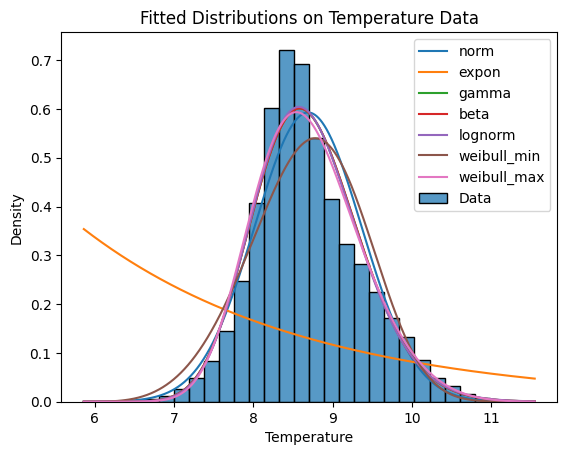


Kolmogorov-Smirnov Test Results:
             KS Statistic        P-Value
norm             0.059938  4.460529e-163
expon            0.427401   0.000000e+00
gamma            0.039049   1.968802e-69
beta             0.039049   1.967192e-69
lognorm          0.037038   1.654976e-62
weibull_min      0.074443  1.982387e-251
weibull_max      0.036362   2.928558e-60

Best Fit Distribution Parameters:
norm: (8.688502563511724, 0.6730782024854579)
expon: (5.862, 2.826502563511724)
gamma: (39.011663603959136, 4.497700761300052, 0.10742432871731672)
beta: (39.011788306791566, 47129810.30498446, 4.497692042424953, 5062886.853759905)
lognorm: (0.11628643083088369, 2.9328391979333386, 5.716837978733398)
weibull_min: (4.415801985131122, 5.859482916670485, 3.093586658959958)
weibull_max: (5.760986512463964, 12.050427154466213, 3.6289129305249883)


In [3]:
from scipy.stats import kstest, probplot
from scipy import stats

dist_names = ['norm', 'expon', 'gamma', 'beta', 'lognorm', 'weibull_min', 'weibull_max']
temperature_data = df['Temperature'].dropna()

best_fit = {}
kstest_results = {}

def evaluate_fit(data, dist_name, params):
    dist = getattr(stats, dist_name)
    ks_stat, ks_pval = kstest(data, dist_name, args=params)
    return ks_stat, ks_pval

for dist_name in dist_names:
    dist = getattr(stats, dist_name)
    params = dist.fit(temperature_data)
    best_fit[dist_name] = params
    ks_stat, ks_pval = evaluate_fit(temperature_data, dist_name, params)
    kstest_results[dist_name] = {'KS Statistic': ks_stat, 'P-Value': ks_pval}

# Convert results to a DataFrame
kstest_df = pd.DataFrame.from_dict(kstest_results, orient='index')

# Plot histogram with fitted distributions
sns.histplot(temperature_data, kde=False, bins=30, stat="density", label="Data")

x = np.linspace(temperature_data.min(), temperature_data.max(), 1000)

for dist_name, params in best_fit.items():
    dist = getattr(stats, dist_name)
    pdf_fitted = dist.pdf(x, *params)
    plt.plot(x, pdf_fitted, label=dist_name)

plt.legend()
plt.xlabel("Temperature")
plt.ylabel("Density")
plt.title("Fitted Distributions on Temperature Data")
plt.show()




# Print KS Test results
print("\nKolmogorov-Smirnov Test Results:")
print(kstest_df)

# Print best-fit parameters for each distribution
print("\nBest Fit Distribution Parameters:")
for dist_name, params in best_fit.items():
    print(f"{dist_name}: {params}")


===== Year 1880 =====
Shapiro-Wilk test statistic: 0.9572, p-value: 0.0000
Data is NOT normally distributed. Applying Johnson transformation...

Post-transformation Shapiro-Wilk: stat = 0.9572, p = 0.0000


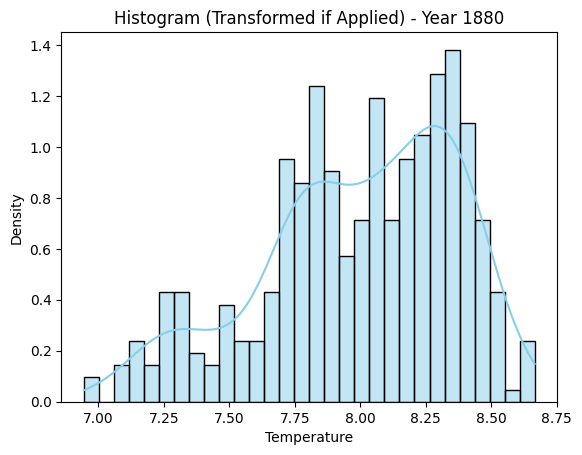

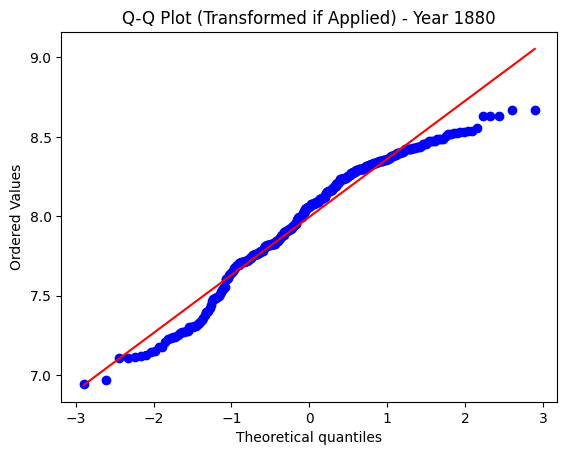


===== Year 1900 =====
Shapiro-Wilk test statistic: 0.9372, p-value: 0.0000
Data is NOT normally distributed. Applying Johnson transformation...

Post-transformation Shapiro-Wilk: stat = 0.9372, p = 0.0000


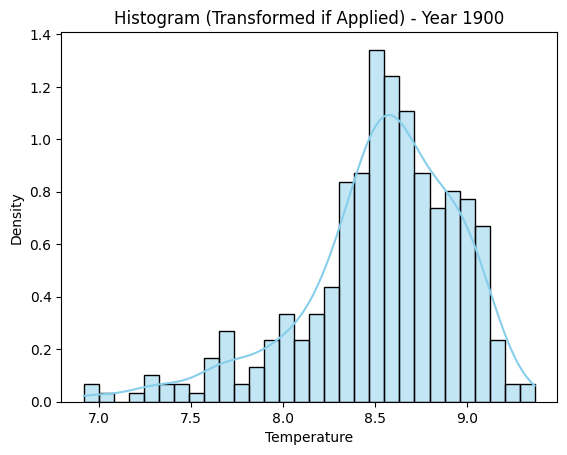

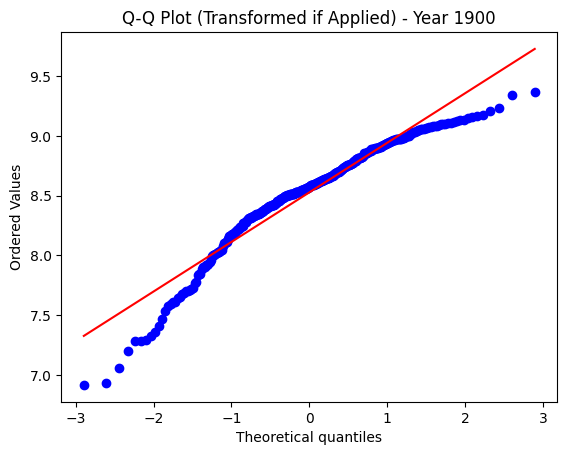


===== Year 1925 =====
Shapiro-Wilk test statistic: 0.9560, p-value: 0.0000
Data is NOT normally distributed. Applying Johnson transformation...

Post-transformation Shapiro-Wilk: stat = 0.9560, p = 0.0000


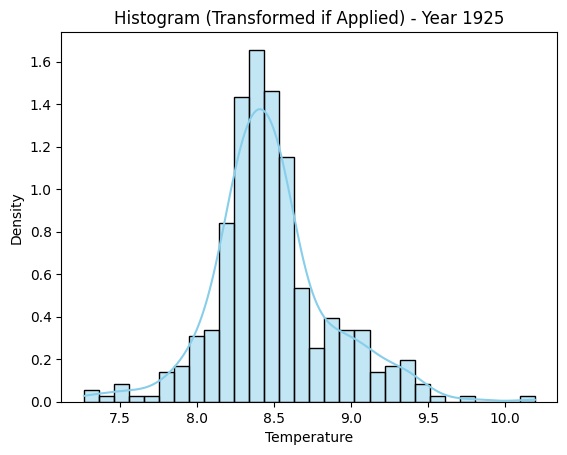

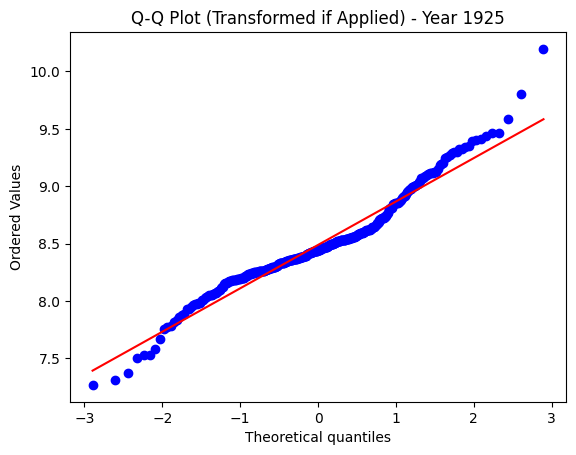


===== Year 1950 =====
Shapiro-Wilk test statistic: 0.9588, p-value: 0.0000
Data is NOT normally distributed. Applying Johnson transformation...

Post-transformation Shapiro-Wilk: stat = 0.9588, p = 0.0000


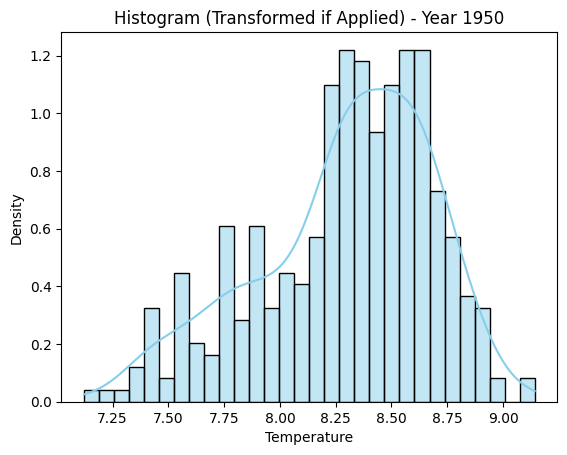

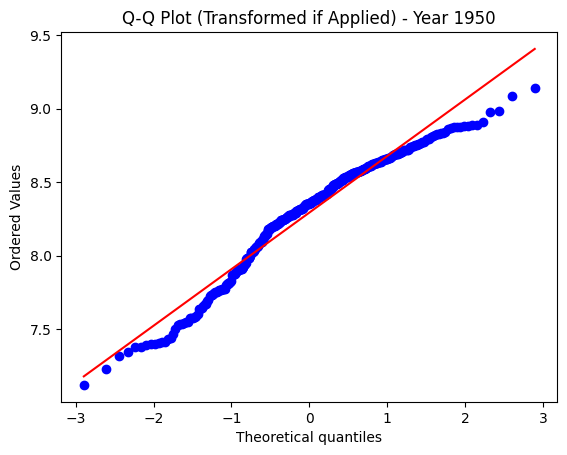


===== Year 1975 =====
Shapiro-Wilk test statistic: 0.9933, p-value: 0.1057
Data appears to be normally distributed.



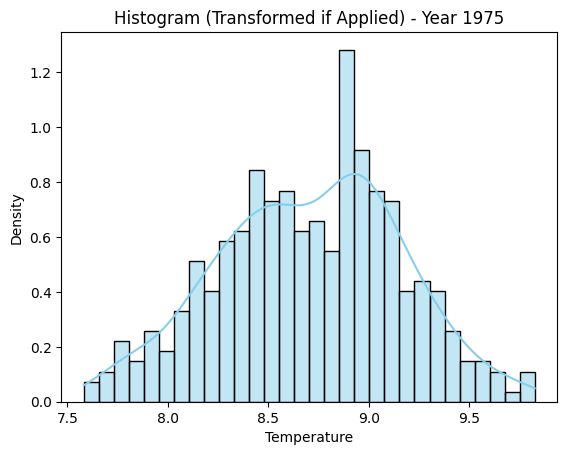

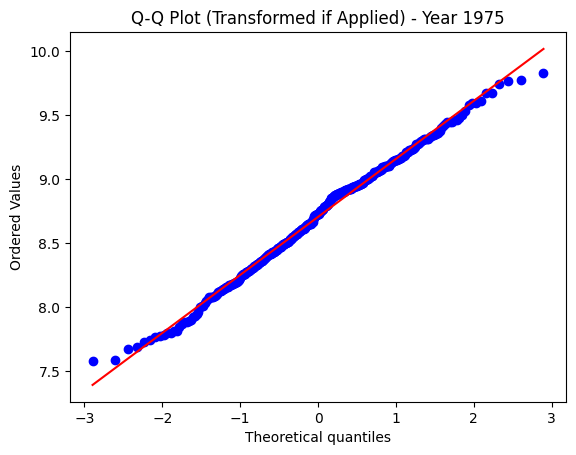


===== Year 2000 =====
Shapiro-Wilk test statistic: 0.9862, p-value: 0.0015
Data is NOT normally distributed. Applying Johnson transformation...

Post-transformation Shapiro-Wilk: stat = 0.9862, p = 0.0015


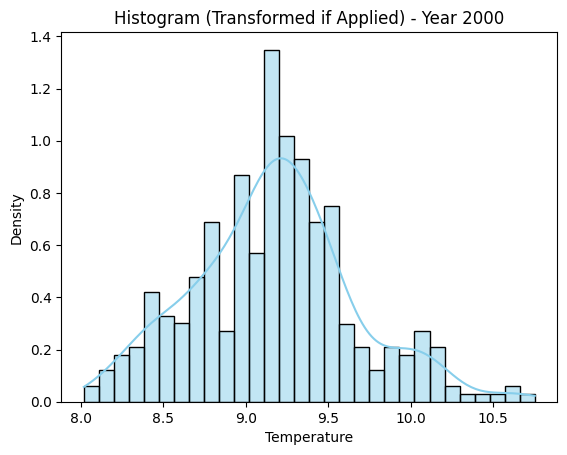

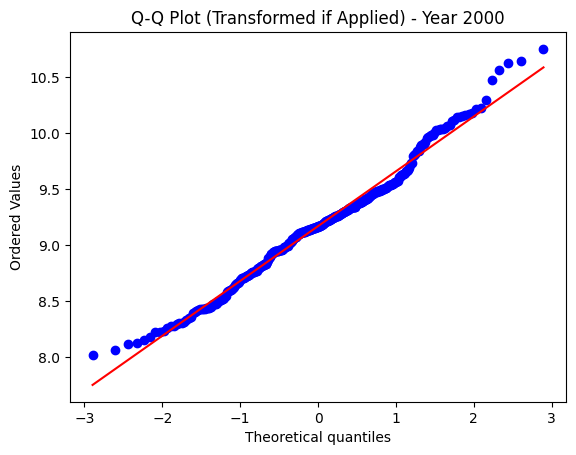


===== Year 2020 =====
Shapiro-Wilk test statistic: 0.9865, p-value: 0.0017
Data is NOT normally distributed. Applying Johnson transformation...

Post-transformation Shapiro-Wilk: stat = 0.9865, p = 0.0017


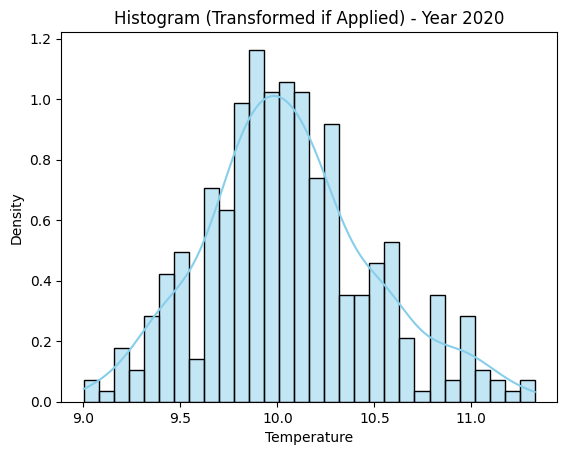

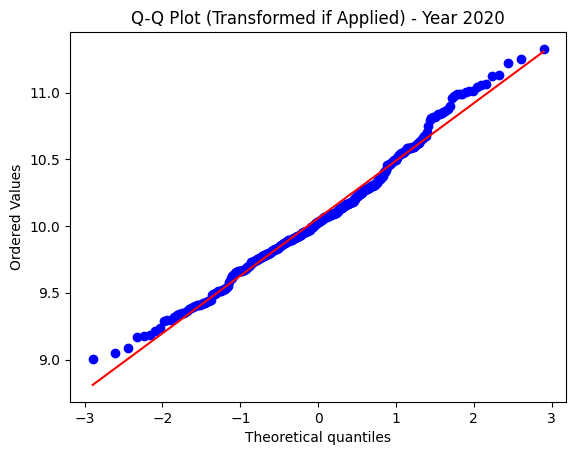

In [7]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from scipy.stats import shapiro

# List of years to test
target_years = [1880, 1900, 1925, 1950, 1975, 2000, 2020]

# Iterate through each year
for year in target_years:
    year_data = df[df['Year'] == year]['Temperature'].dropna()
    
    if len(year_data) < 3:
        print(f"Year {year}: Not enough data for testing.")
        continue
    
    print(f"\n===== Year {year} =====")

    # Normality test (Shapiro-Wilk is good for small to medium sample sizes)
    stat, p_value = shapiro(year_data)
    print(f"Shapiro-Wilk test statistic: {stat:.4f}, p-value: {p_value:.4f}")

    if p_value > 0.05:
        print("Data appears to be normally distributed.\n")
        transformed_data = year_data  # No need to transform
    else:
        print("Data is NOT normally distributed. Applying Johnson transformation...\n")
        
        # Fit Johnson SU distribution
        fitted_params = stats.johnsonsu.fit(year_data)
        transformed_data = stats.johnsonsu(*fitted_params).ppf(stats.johnsonsu(*fitted_params).cdf(year_data))

        # Re-test for normality after transformation
        stat_t, p_t = shapiro(transformed_data)
        print(f"Post-transformation Shapiro-Wilk: stat = {stat_t:.4f}, p = {p_t:.4f}")
    
    # Plot the final data (original or transformed)
    sns.histplot(transformed_data, bins=30, kde=True, stat="density", color='skyblue')
    plt.title(f"Histogram (Transformed if Applied) - Year {year}")
    plt.xlabel("Temperature")
    plt.ylabel("Density")
    plt.show()
    
    # Q-Q Plot to visually check normality
    stats.probplot(transformed_data, dist="norm", plot=plt)
    plt.title(f"Q-Q Plot (Transformed if Applied) - Year {year}")
    plt.show()


In [4]:
import pandas as pd
import numpy as np
from scipy import stats

def detect_outliers_std(df, column, threshold=2.5):
    """
    Detects outliers in a DataFrame column based on standard deviations from the mean.

    Args:
        df (pd.DataFrame): The DataFrame to analyze.
        column (str): The name of the column to check for outliers.
        threshold (float): The number of standard deviations from the mean to consider as an outlier.
                         Defaults to 2.5, as used in Hansen et al. (2010).

    Returns:
        pd.DataFrame: A DataFrame containing the outliers and their values.
    """
    mean = df[column].mean()
    std = df[column].std()
    outliers = df[(df[column] > mean + threshold * std) | (df[column] < mean - threshold * std)]
    return outliers

def detect_inconsistent_neighbors(df, column='Temperature', year_col='Year', threshold=2.5):
    """
    Detects data points that are inconsistent with neighboring years based on standard deviations.
    This is a simplified version of the neighbor comparison mentioned in Hansen et al. (2010).

    Args:
        df (pd.DataFrame): The DataFrame to analyze, containing 'Year' and the temperature column.
        column (str): The name of the column to check for inconsistencies (e.g., 'Temperature').
        year_col (str): The name of the year column.
        threshold (float): Threshold for considering a point as inconsistent.

    Returns:
        pd.DataFrame: DataFrame of inconsistent data points.
    """

    df_shifted = df.copy()
    df_shifted['Temp_lag1'] = df_shifted[column].shift(1)
    df_shifted['Temp_lead1'] = df_shifted[column].shift(-1)

    df_shifted['Mean_Neighbor'] = df_shifted[['Temp_lag1', 'Temp_lead1']].mean(axis=1)
    df_shifted['Std_Neighbor'] = df_shifted[['Temp_lag1', 'Temp_lead1']].std(axis=1)

    df_shifted['Outlier_High'] = (df_shifted[column] > df_shifted['Mean_Neighbor'] + threshold * df_shifted['Std_Neighbor'])
    df_shifted['Outlier_Low'] = (df_shifted[column] < df_shifted['Mean_Neighbor'] - threshold * df_shifted['Std_Neighbor'])

    inconsistent_points = df_shifted[(df_shifted['Outlier_High'] == True) | (df_shifted['Outlier_Low'] == True)]

    return inconsistent_points[['Year', column]]  # Return only Year and Temperature



# Example Usage:
# Overall outlier detection
overall_temp_outliers = detect_outliers_std(df1, 'Temperature')
print("Overall Temperature Outliers (Std Dev):\n", overall_temp_outliers)

# Outlier detection by year (e.g., for each year's temperature)
yearly_outliers = df1.groupby('Year').apply(detect_outliers_std, column='Temperature')
print("\nYearly Temperature Outliers (Std Dev):\n", yearly_outliers)

# Detect points inconsistent with neighboring years
inconsistent_neighbor_points = detect_inconsistent_neighbors(df1)
print("\nInconsistent Neighboring Year Points:\n", inconsistent_neighbor_points)

Overall Temperature Outliers (Std Dev):
        Year  Month  Temperature        Year Group         Half Year Group 10
72     1880      3        6.968               NaN   First Half     1880-1889
73     1880      3        6.945               NaN   First Half     1880-1889
1063   1882     11        6.950  (1880.0, 1900.0]   First Half     1880-1889
1064   1882     11        6.921  (1880.0, 1900.0]   First Half     1880-1889
1070   1882     12        6.856  (1880.0, 1900.0]   First Half     1880-1889
...     ...    ...          ...               ...          ...           ...
51964  2022      4       10.816               NaN  Second Half           NaN
51965  2022      4       10.653               NaN  Second Half           NaN
52025  2022      6       10.385               NaN  Second Half           NaN
52030  2022      6       10.394               NaN  Second Half           NaN
52031  2022      6       10.518               NaN  Second Half           NaN

[885 rows x 6 columns]

Yearly Tem

## Missing Values: Check for missing or inconsistent records.

## Outlier Detection: Boxplots and IQR method.

## Trend Analysis: Moving averages, seasonal decomposition.

## Visualization:

### 1.Time series plots for different periods.

### 2.Rolling mean and standard deviation.

### 3. Histogram of temperature anomalies.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51349 entries, 0 to 51348
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Year          51349 non-null  int64  
 1   Month         51349 non-null  int64  
 2   Day           51349 non-null  int64  
 3   Day of Year   51349 non-null  int64  
 4   Anomaly       51349 non-null  float64
 5   Temperature   51349 non-null  float64
 6   Rolling_Mean  50985 non-null  float64
 7   Rolling_Std   50985 non-null  float64
dtypes: float64(4), int64(4)
memory usage: 3.1 MB
None
   Year  Month  Day  Day of Year  Anomaly  Temperature  Rolling_Mean  \
0  1881     12   29          363    0.232        8.822           NaN   
1  1881     12   30          364   -0.015        8.575           NaN   
2  1881     12   31          365    0.013        8.603           NaN   
3  1882      1    1            1    0.020        8.610           NaN   
4  1882      1    2            2   -0.043      

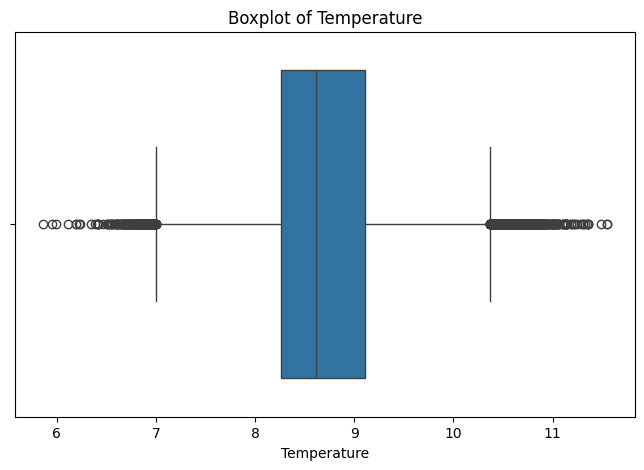

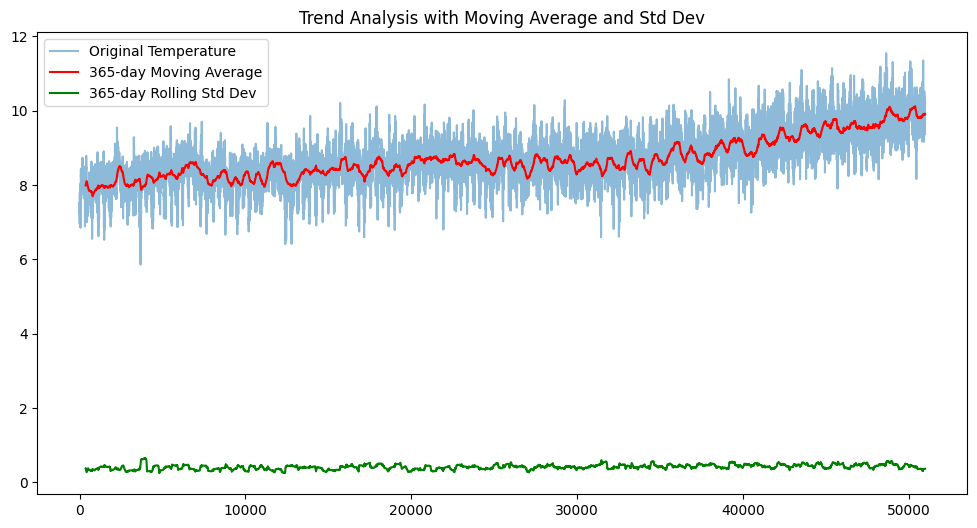

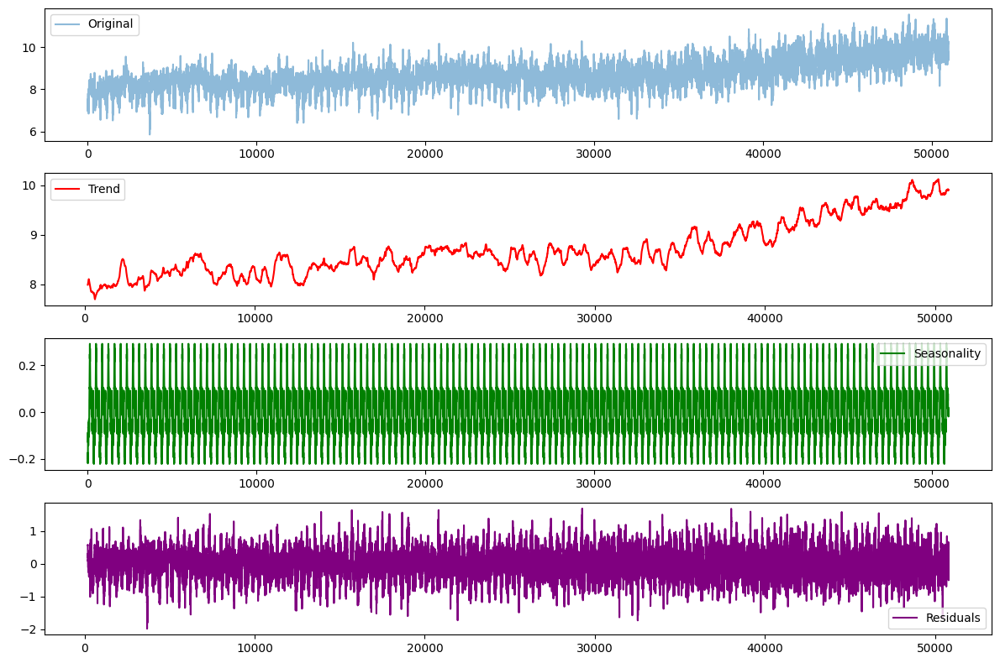

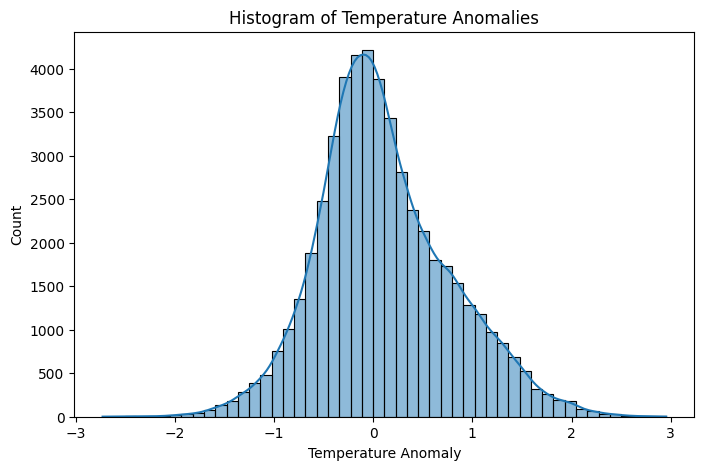

In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose



# Display basic info
print(df.info())
print(df.head())

# Check for missing values
missing_values = df.isnull().sum()
print("Missing Values:\n", missing_values)

# Handling missing values (if any)
df.dropna(inplace=True)  # Remove missing records
df.reset_index(drop=True, inplace=True)

# Outlier Detection using IQR
Q1 = df['Temperature'].quantile(0.25)
Q3 = df['Temperature'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = df[(df['Temperature'] < lower_bound) | (df['Temperature'] > upper_bound)]
print(f"Number of Outliers: {len(outliers)}")

# Boxplot for outlier visualization
plt.figure(figsize=(8, 5))
sns.boxplot(x=df['Temperature'])
plt.title("Boxplot of Temperature")
plt.show()

# Trend Analysis using Moving Average
df['Rolling_Mean'] = df['Temperature'].rolling(window=365).mean()
df['Rolling_Std'] = df['Temperature'].rolling(window=365).std()

plt.figure(figsize=(12, 6))
plt.plot(df['Temperature'], label="Original Temperature", alpha=0.5)
plt.plot(df['Rolling_Mean'], label="365-day Moving Average", color='red')
plt.plot(df['Rolling_Std'], label="365-day Rolling Std Dev", color='green')
plt.title("Trend Analysis with Moving Average and Std Dev")
plt.legend()
plt.show()

# Seasonal Decomposition
decomposition = seasonal_decompose(df['Temperature'], period=365, model='additive')

plt.figure(figsize=(12, 8))
plt.subplot(411)
plt.plot(df['Temperature'], label="Original", alpha=0.5)
plt.legend()

plt.subplot(412)
plt.plot(decomposition.trend, label="Trend", color='red')
plt.legend()

plt.subplot(413)
plt.plot(decomposition.seasonal, label="Seasonality", color='green')
plt.legend()

plt.subplot(414)
plt.plot(decomposition.resid, label="Residuals", color='purple')
plt.legend()

plt.tight_layout()
plt.show()

# Histogram of temperature anomalies
plt.figure(figsize=(8, 5))
sns.histplot(df['Anomaly'], bins=50, kde=True)
plt.title("Histogram of Temperature Anomalies")
plt.xlabel("Temperature Anomaly")
plt.show()


Linear Regression Trend Slope: 0.011487


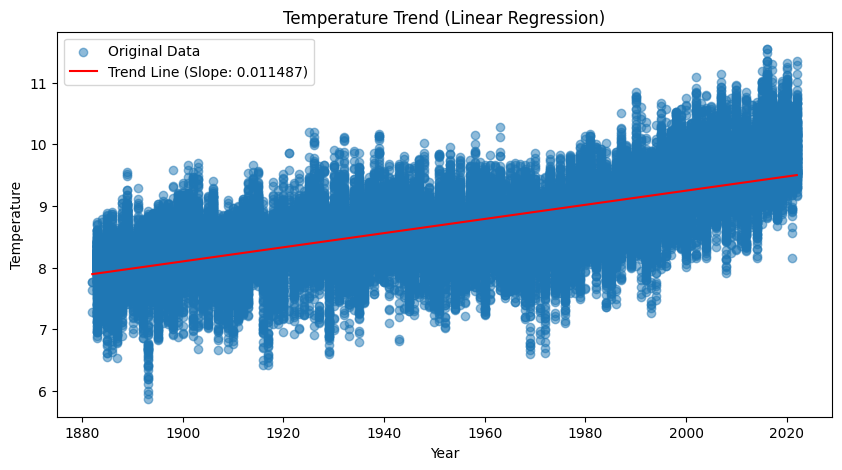

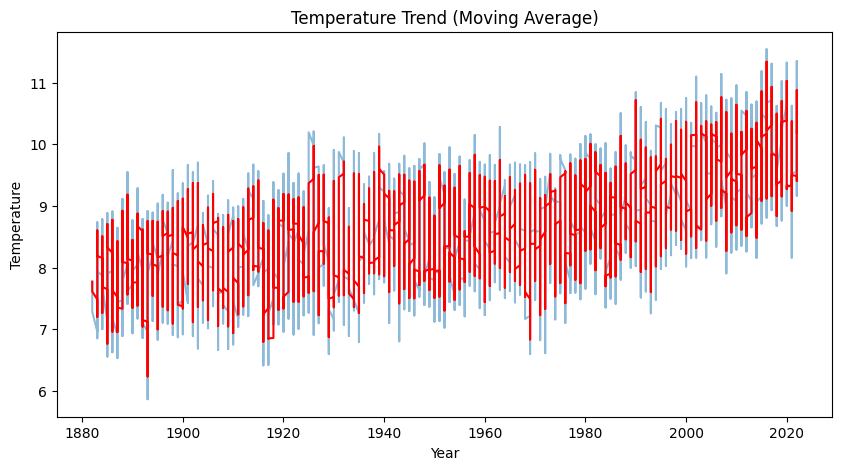

ADF Statistic: -9.437660805688283
p-value: 4.991882507815218e-16
Linear Regression Slope: 0.011487
ADF Test p-value: 0.000000


In [15]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import theilslopes
from sklearn.linear_model import LinearRegression
from statsmodels.tsa.stattools import adfuller
import pymannkendall as mk

X = df[['Year']].values.reshape(-1, 1)
y = df['Temperature'].values

model = LinearRegression()
model.fit(X, y)

trend_slope = model.coef_[0]
intercept = model.intercept_
print(f"Linear Regression Trend Slope: {trend_slope:.6f}")

# Plot the trend line
plt.figure(figsize=(10, 5))
plt.scatter(df['Year'], df['Temperature'], label="Original Data", alpha=0.5)
plt.plot(df['Year'], model.predict(X), color='red', label=f"Trend Line (Slope: {trend_slope:.6f})")
plt.xlabel("Year")
plt.ylabel("Temperature")
plt.title("Temperature Trend (Linear Regression)")
plt.legend()
plt.show()




df['Rolling_Mean'] = df['Temperature'].rolling(window=10, min_periods=1).mean()

plt.figure(figsize=(10, 5))
plt.plot(df['Year'], df['Temperature'], label="Original Data", alpha=0.5)
plt.plot(df['Year'], df['Rolling_Mean'], label="10-Year Moving Average", color='red')
plt.xlabel("Year")
plt.ylabel("Temperature")
plt.title("Temperature Trend (Moving Average)")
plt.show()



adf_test = adfuller(df['Temperature'])
print(f"ADF Statistic: {adf_test[0]}")
print(f"p-value: {adf_test[1]}")


methods = {
    "Linear Regression Slope": trend_slope,
    "ADF Test p-value": adf_test[1]
}

for method, value in methods.items():
    print(f"{method}: {value:.6f}")


Analyzing period: 1880-1890
Number of Outliers: 69


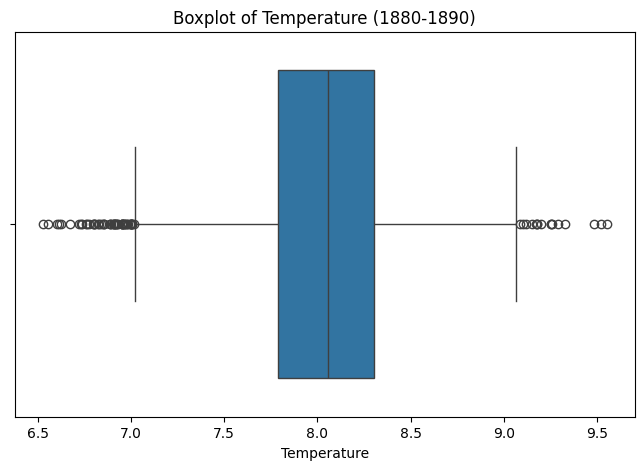

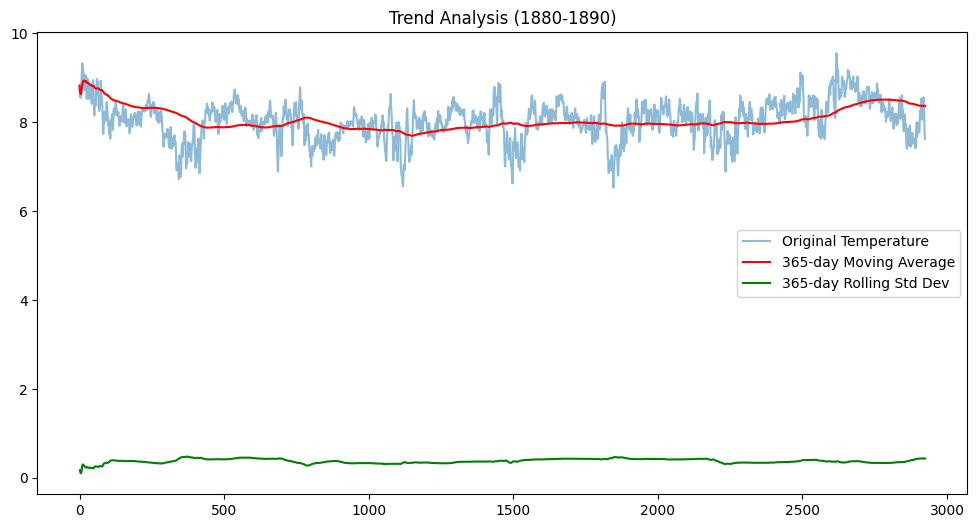

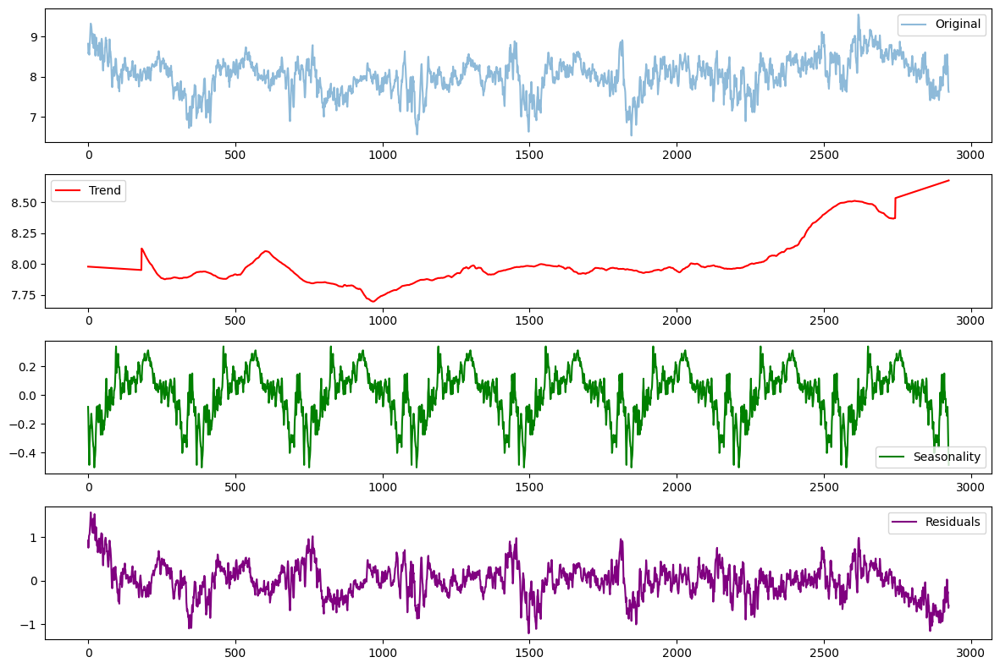

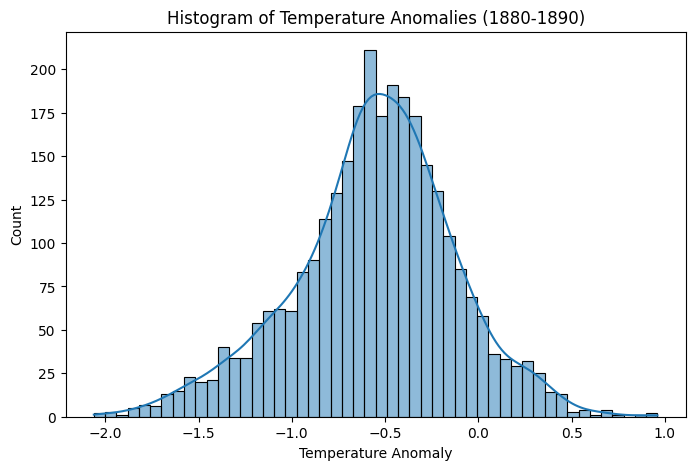

Analyzing period: 1890-1900
Number of Outliers: 137


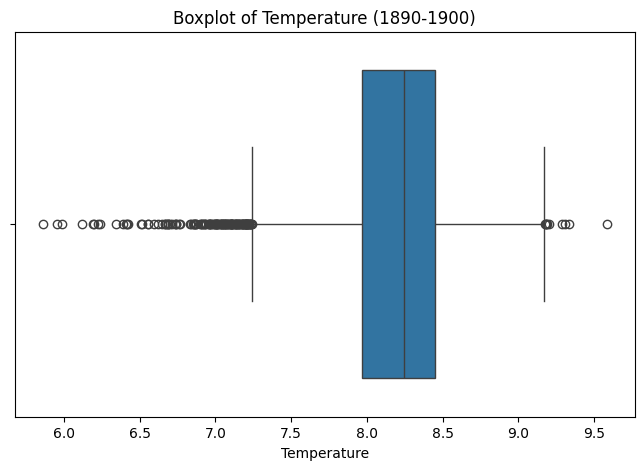

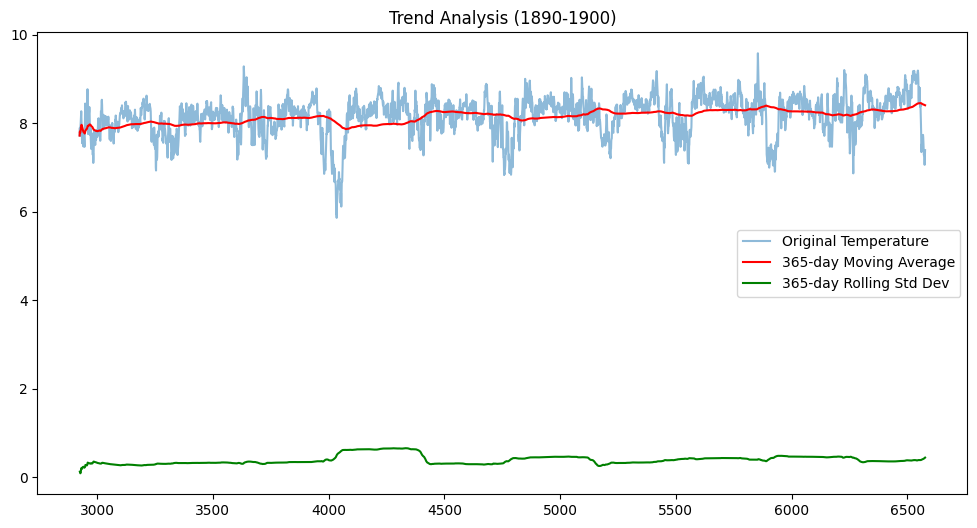

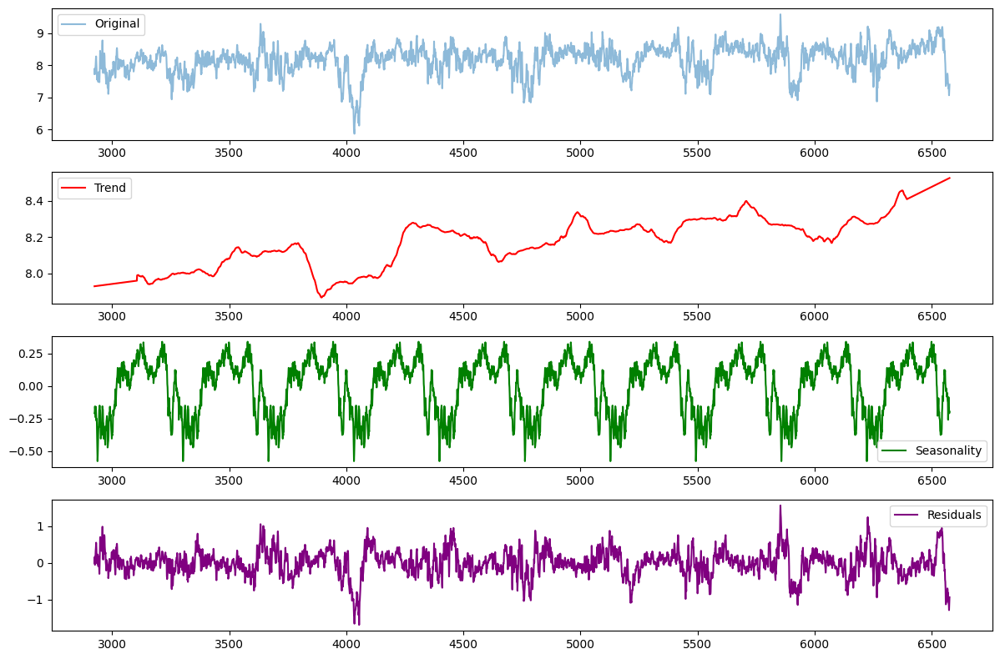

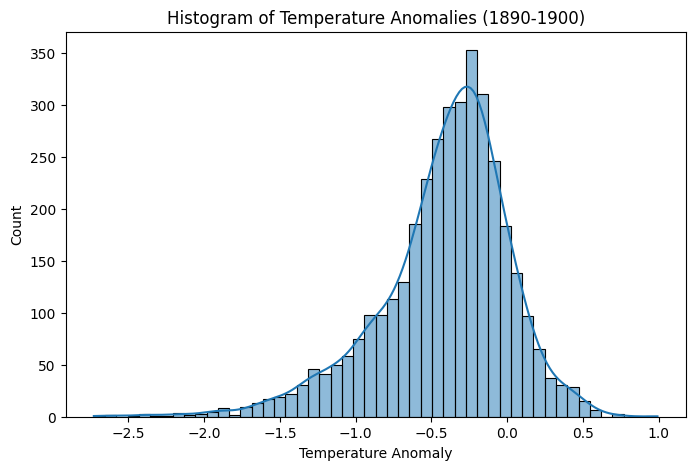

Analyzing period: 1900-1910
Number of Outliers: 105


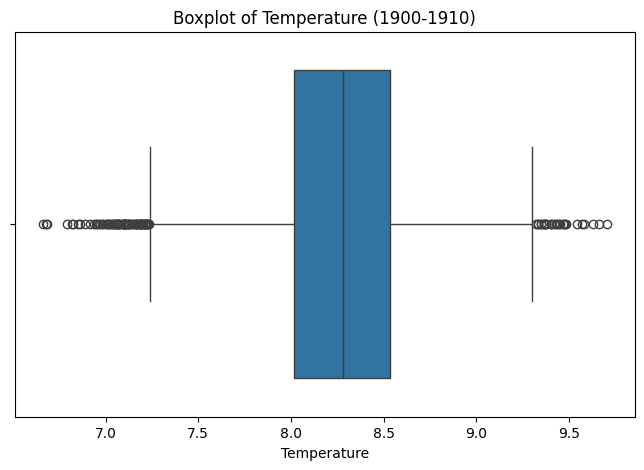

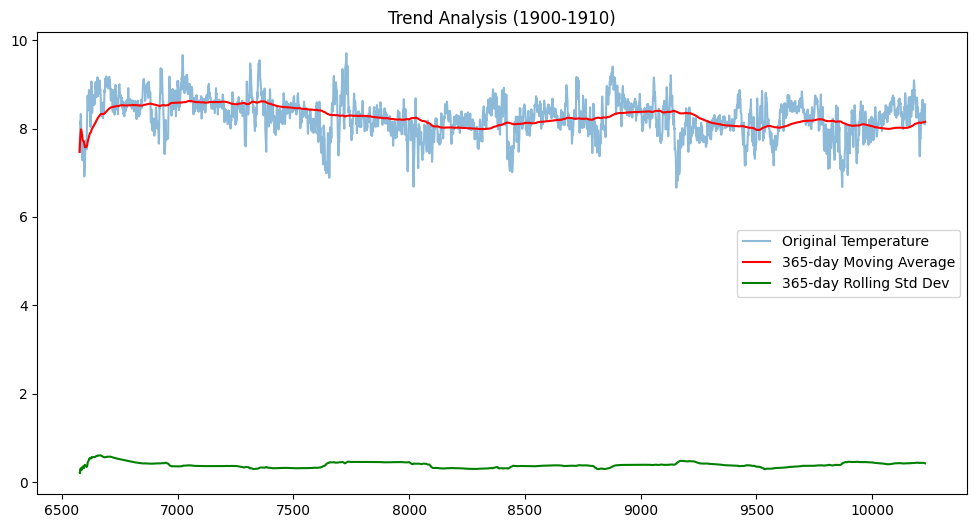

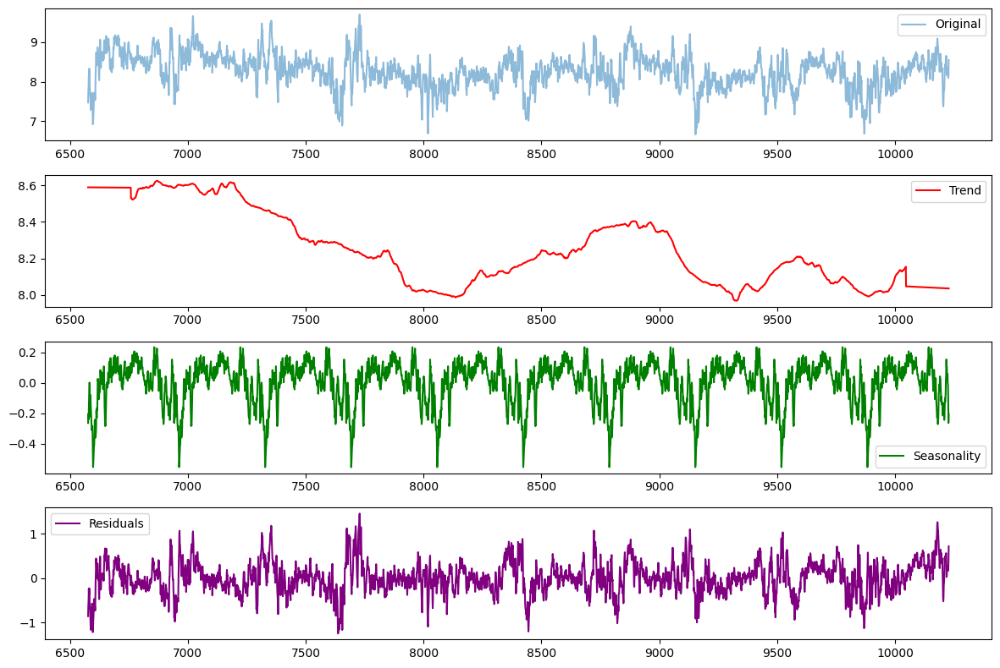

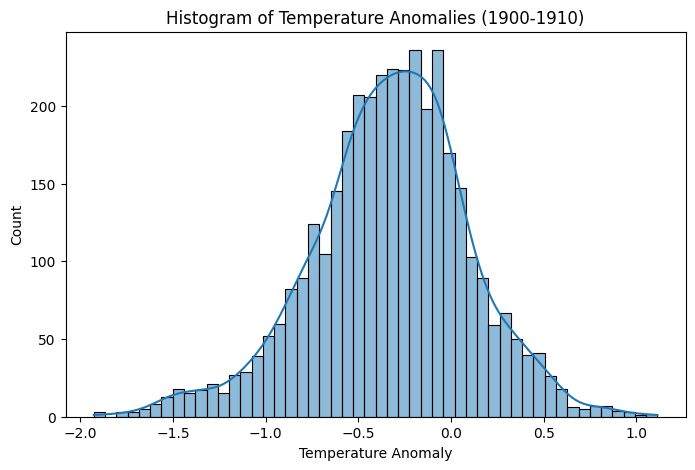

Analyzing period: 1910-1920
Number of Outliers: 88


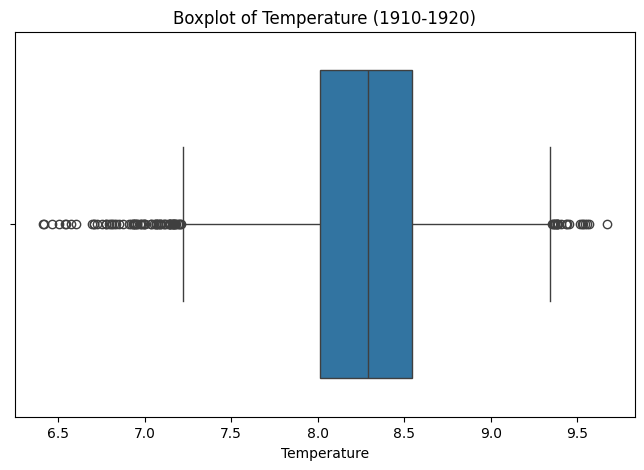

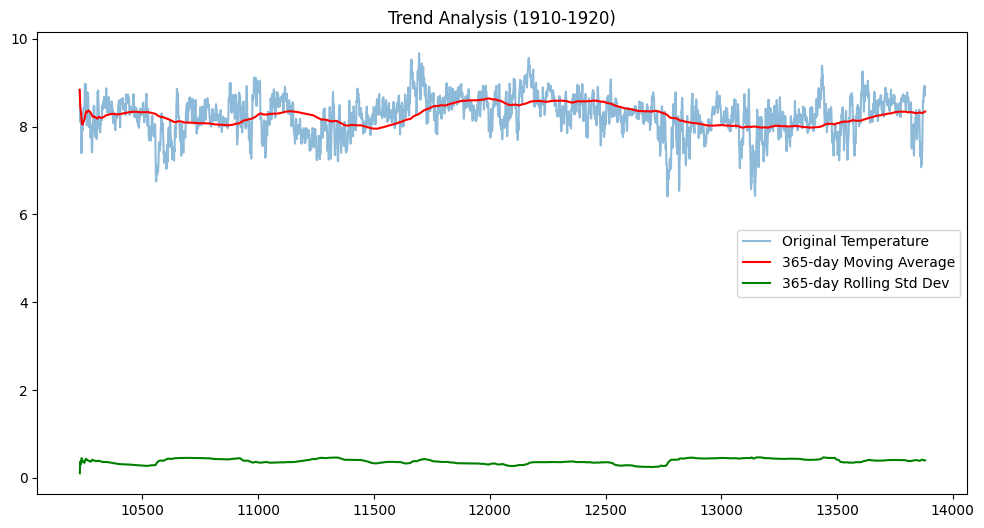

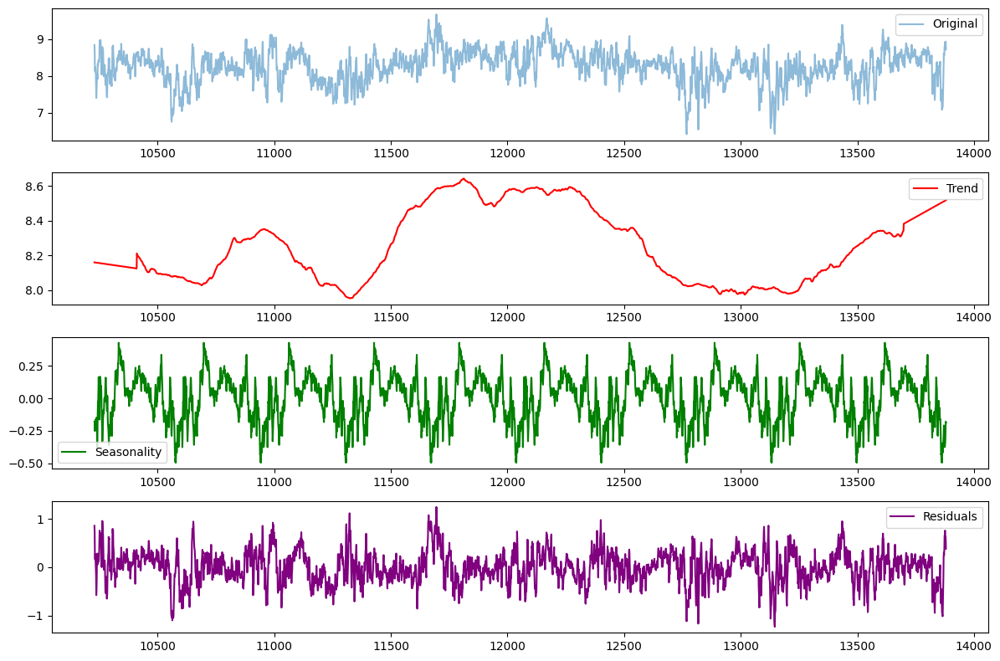

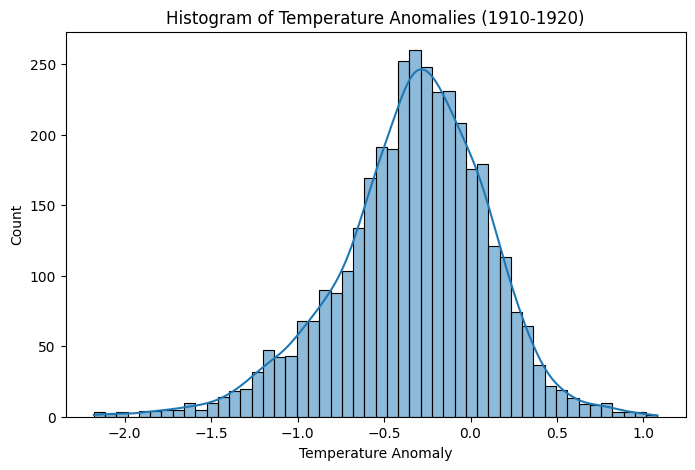

Analyzing period: 1920-1930
Number of Outliers: 236


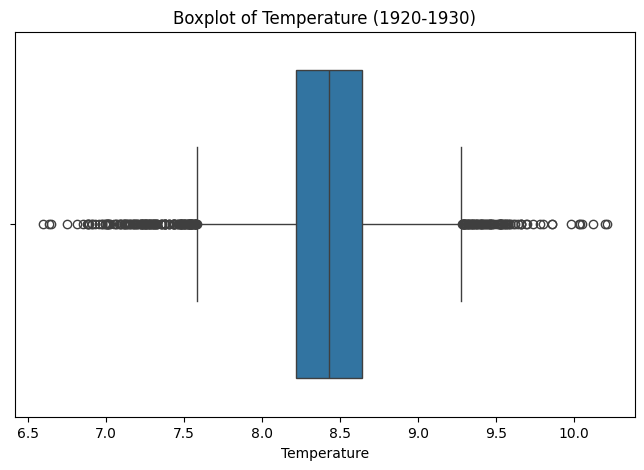

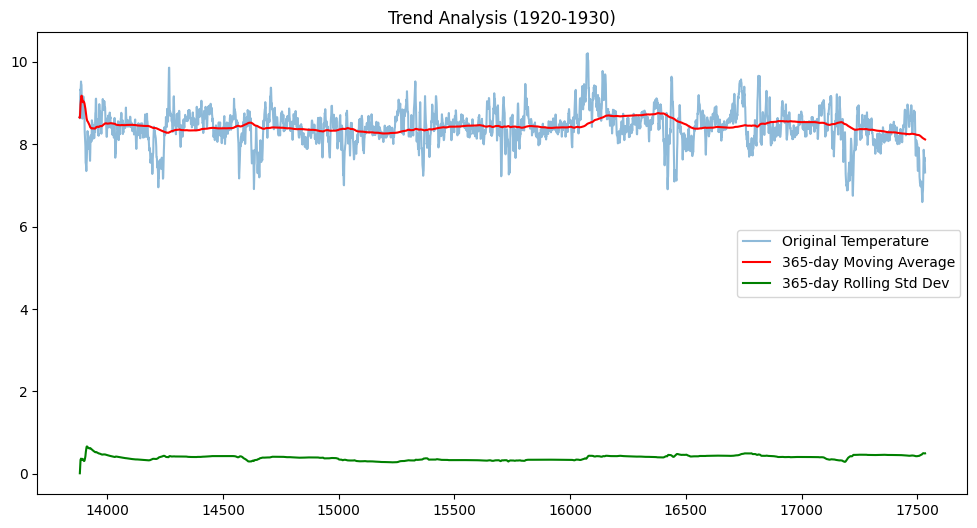

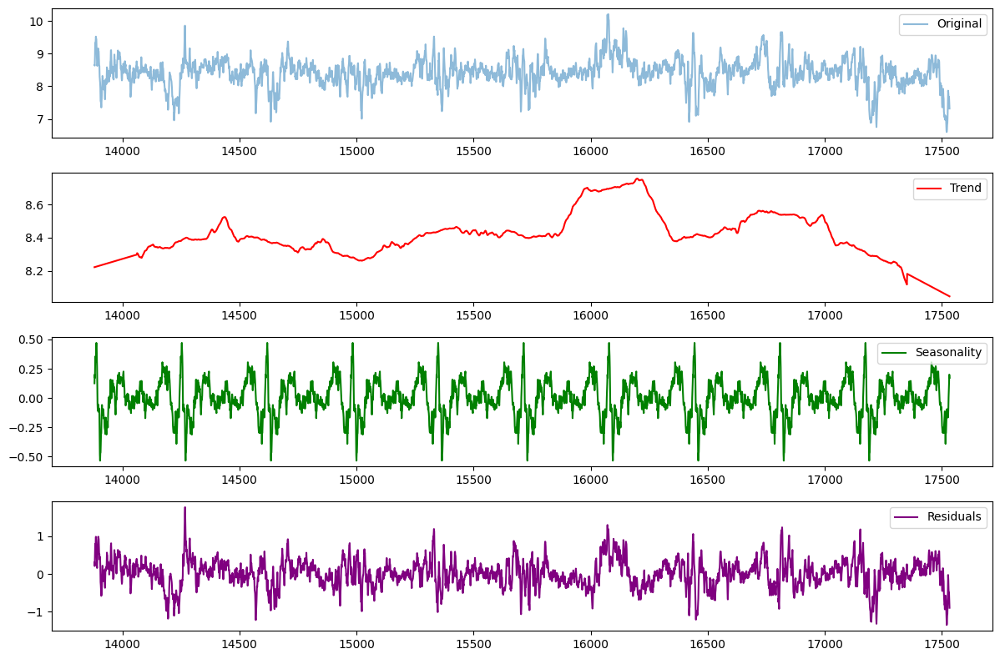

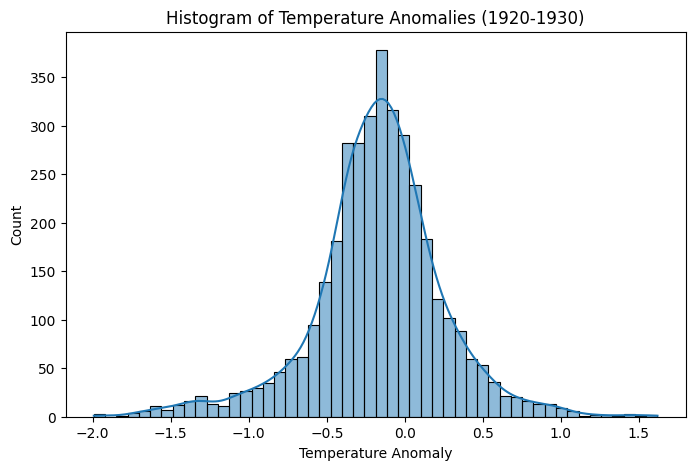

Analyzing period: 1930-1940
Number of Outliers: 121


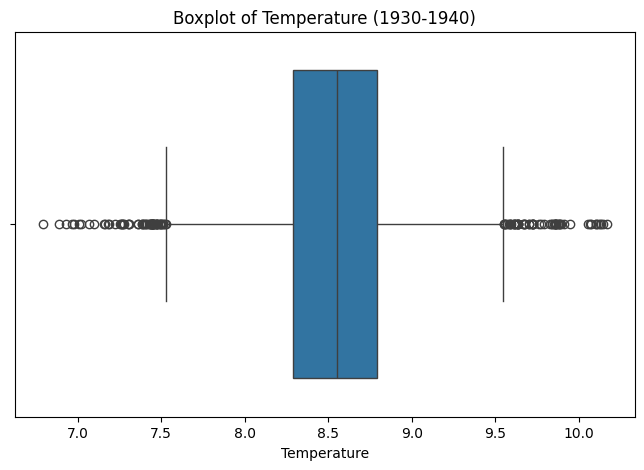

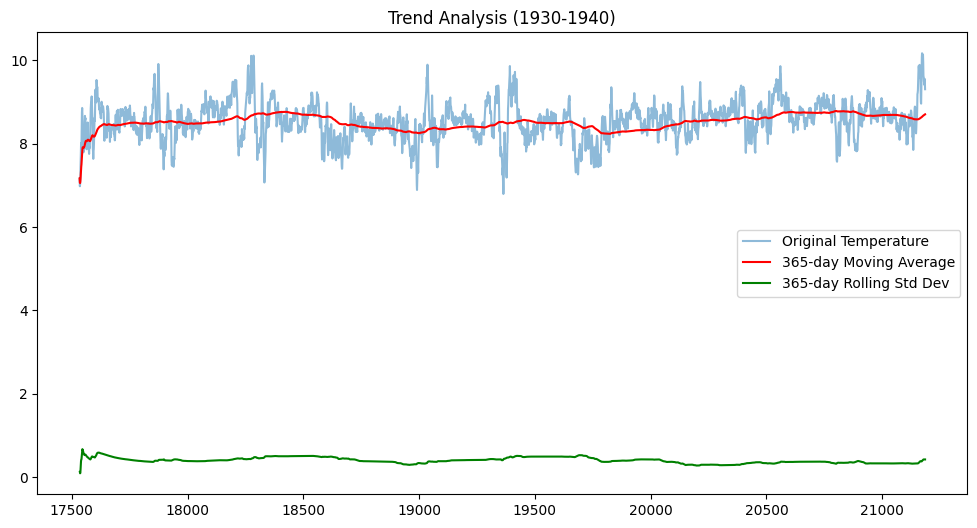

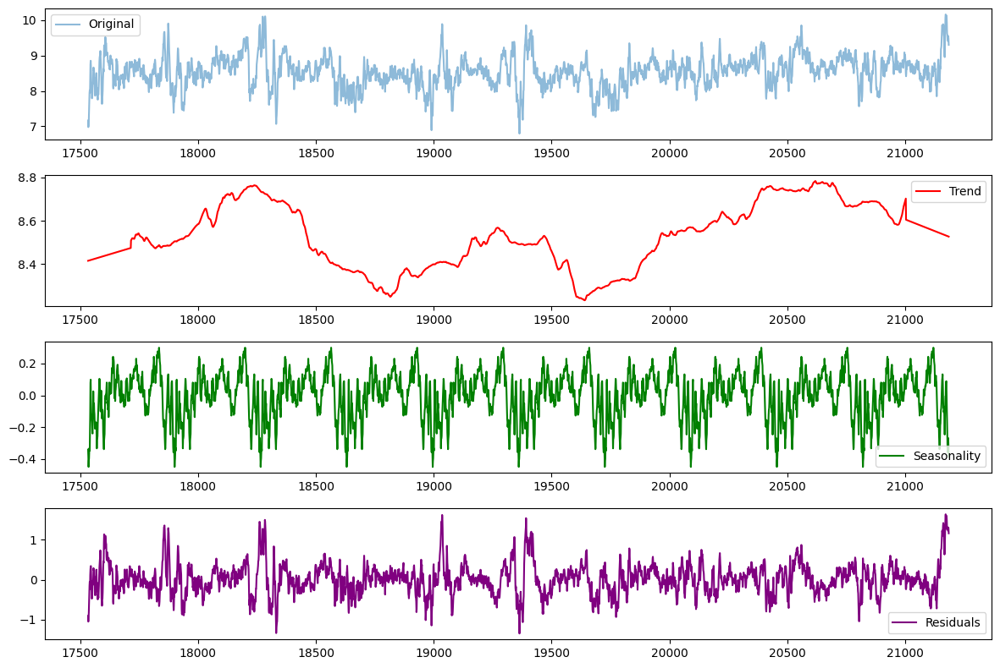

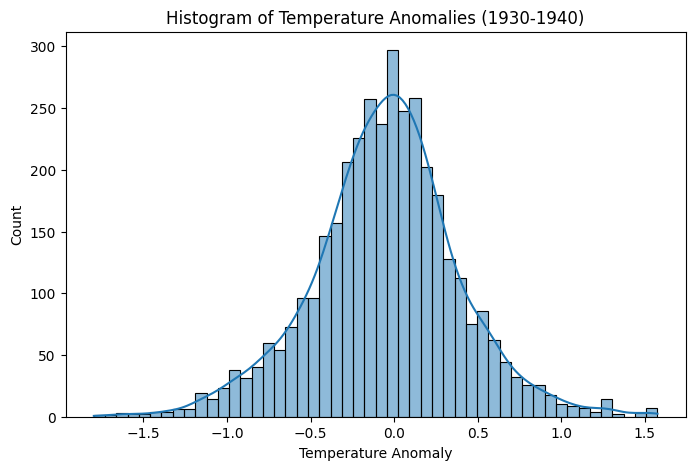

Analyzing period: 1940-1950
Number of Outliers: 120


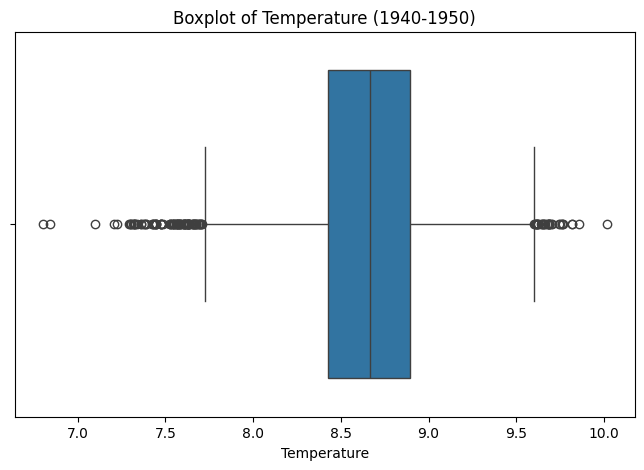

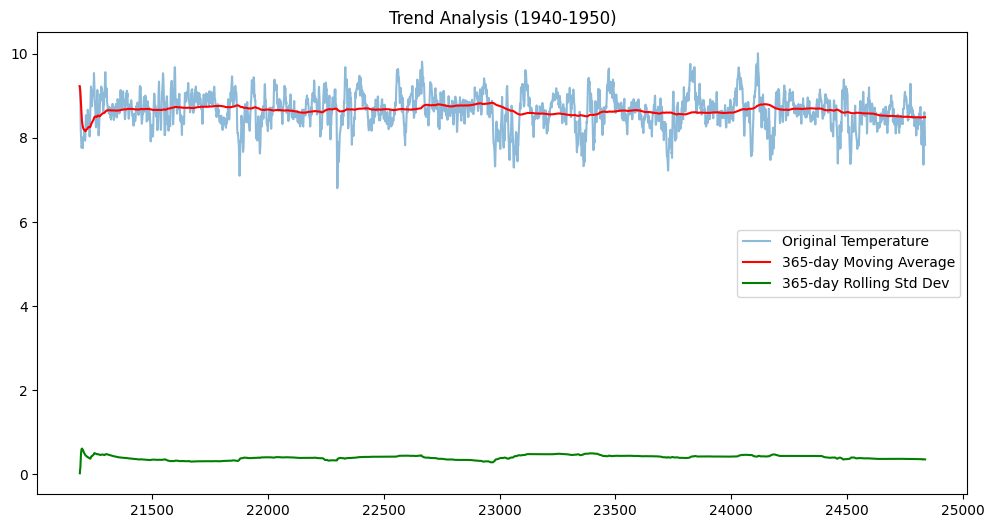

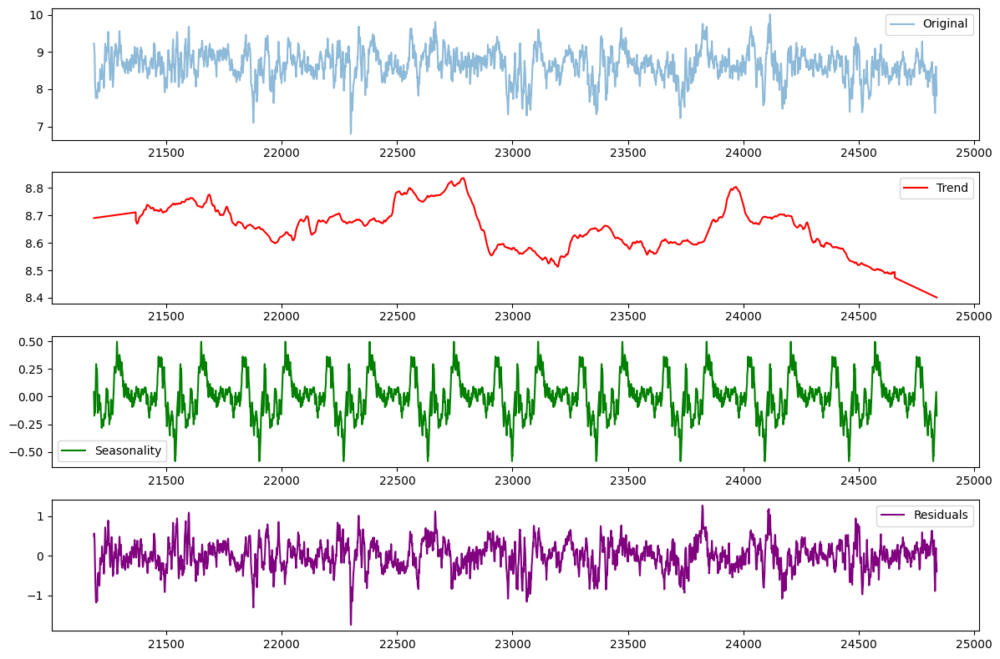

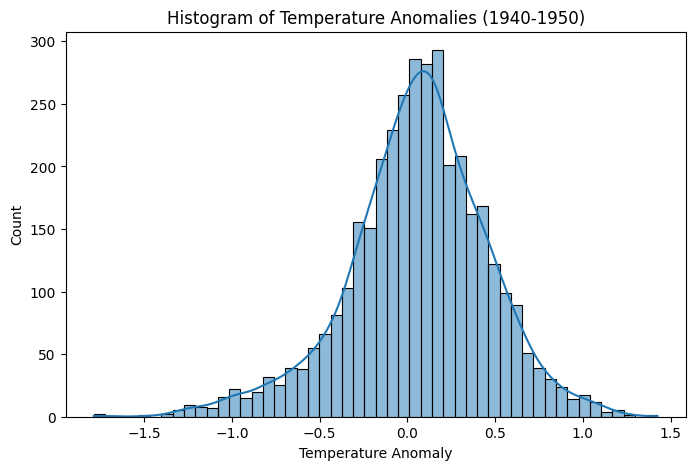

Analyzing period: 1950-1960
Number of Outliers: 52


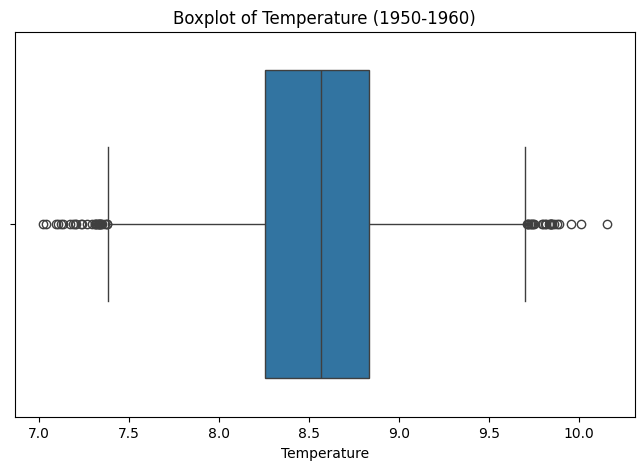

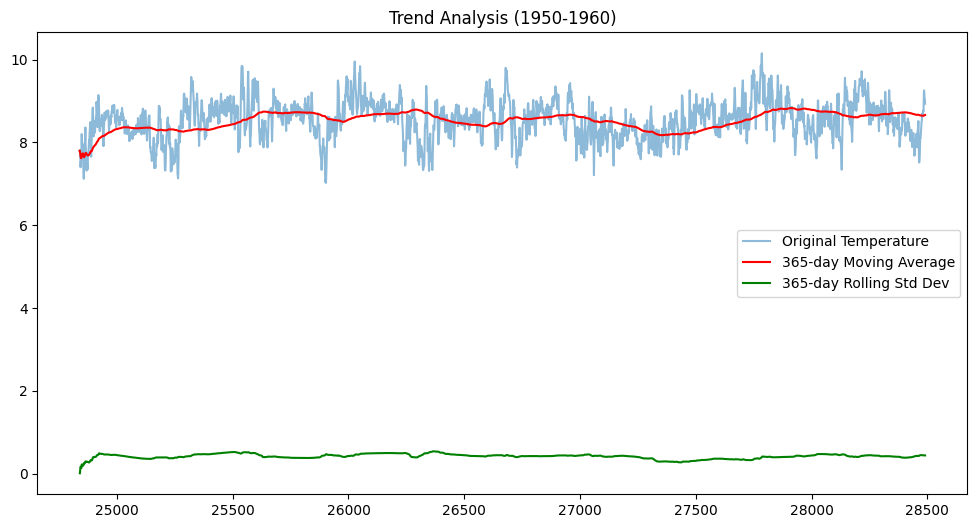

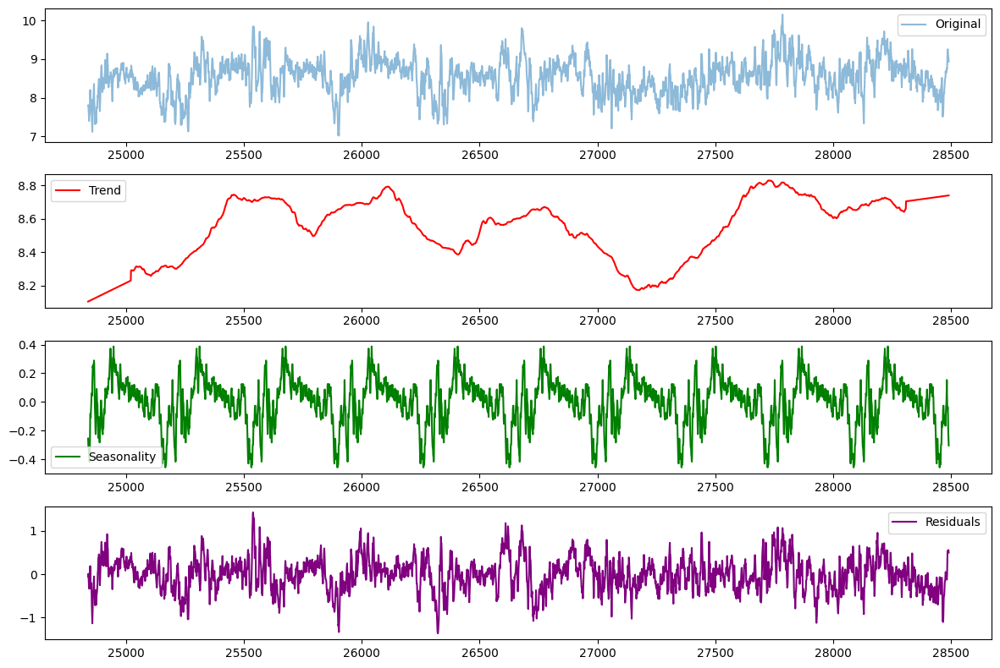

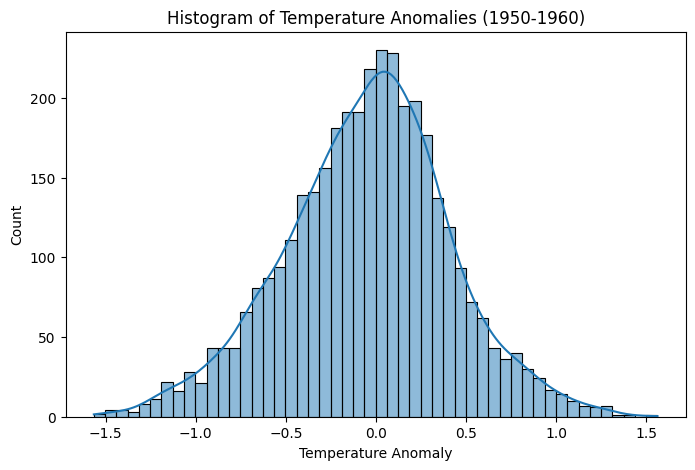

Analyzing period: 1960-1970
Number of Outliers: 33


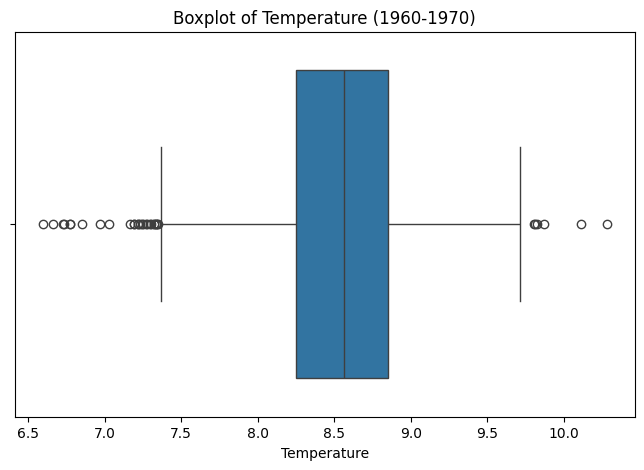

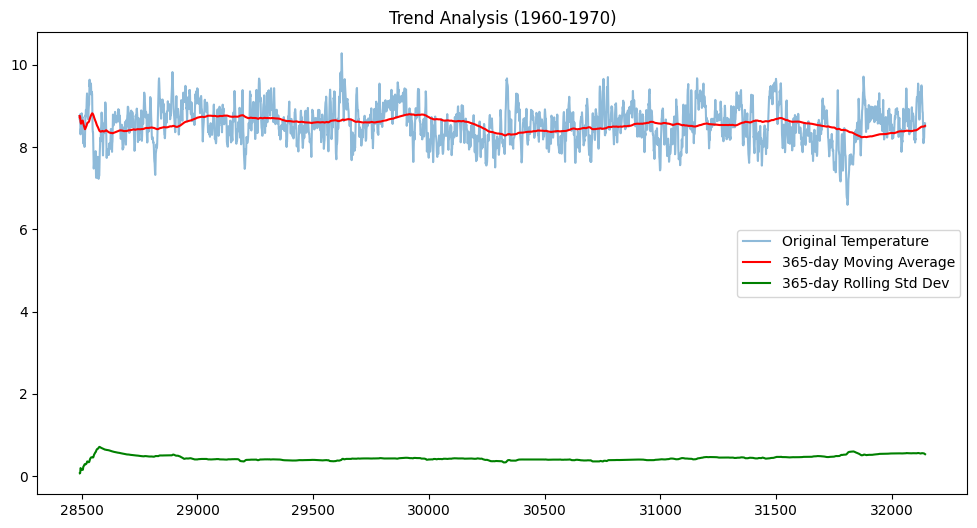

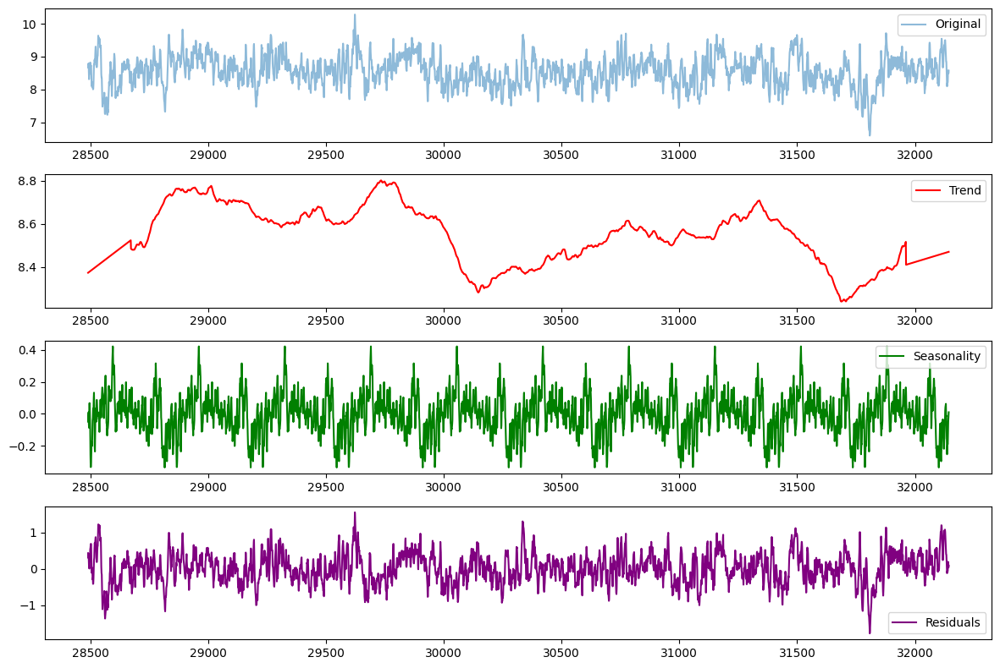

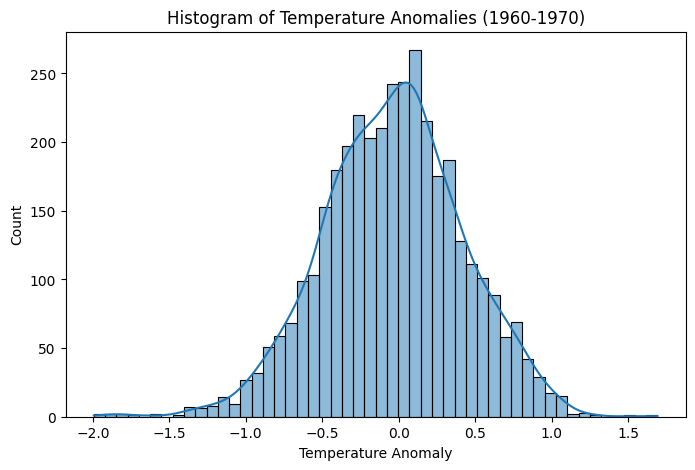

Analyzing period: 1970-1980
Number of Outliers: 50


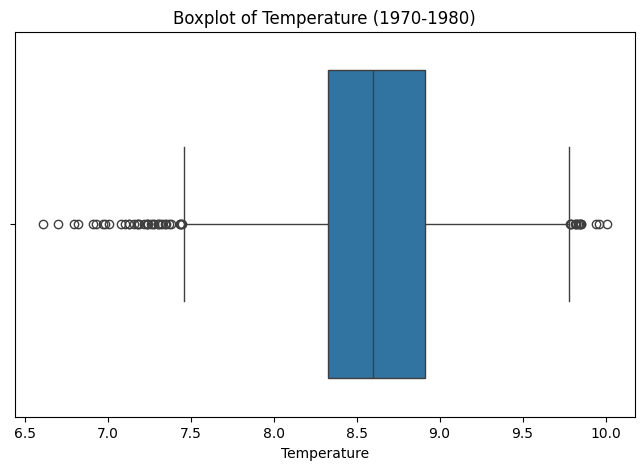

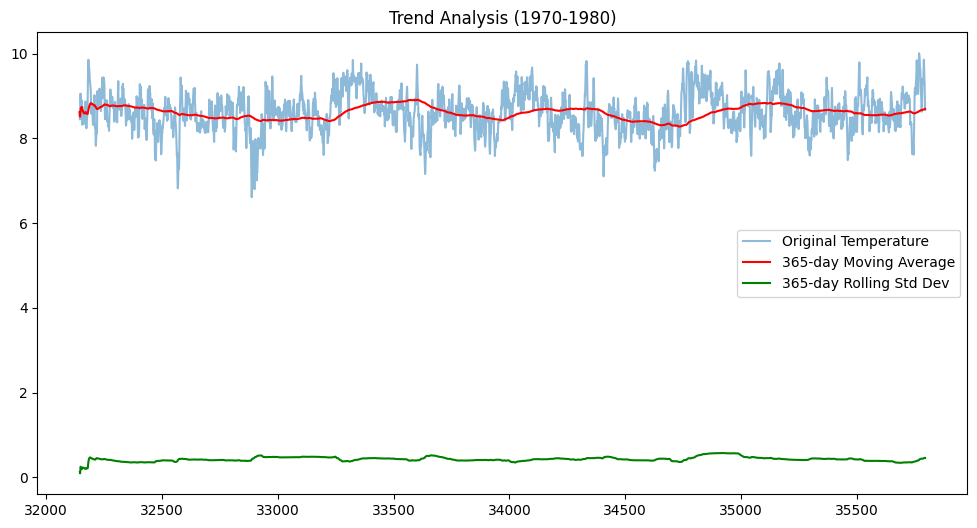

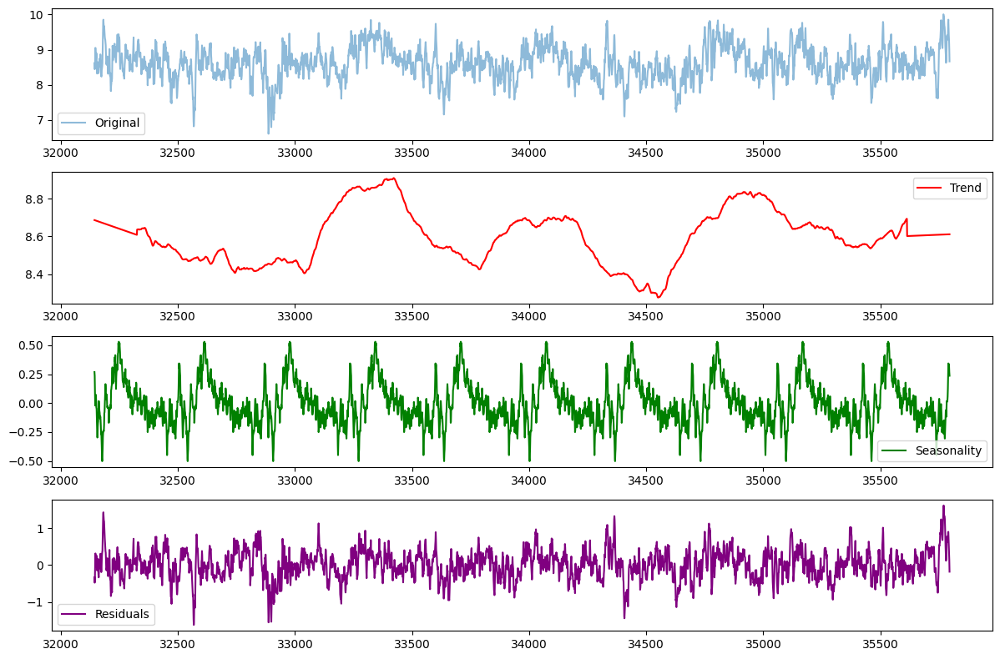

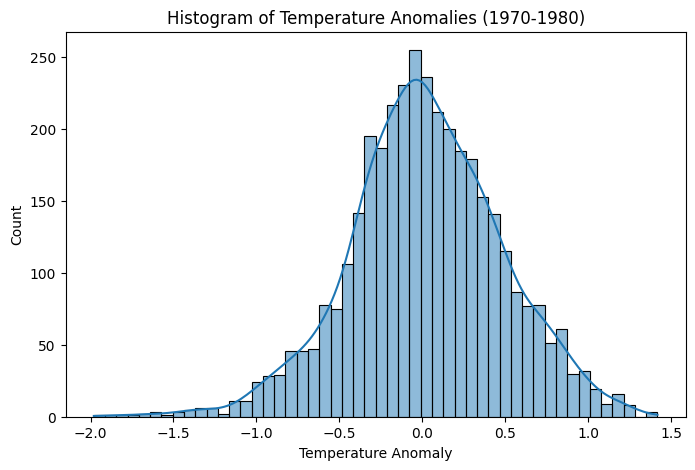

Analyzing period: 1980-1990
Number of Outliers: 17


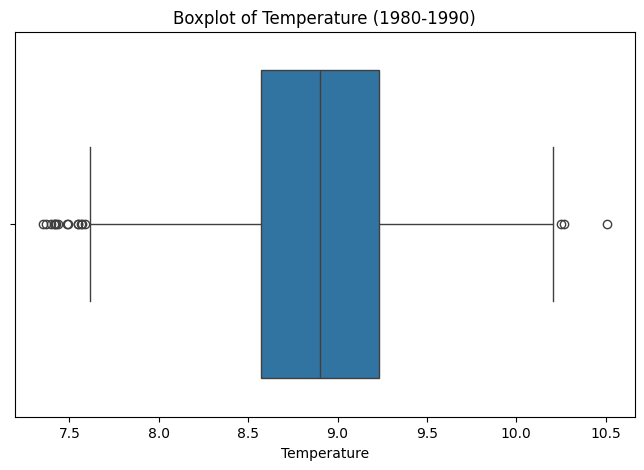

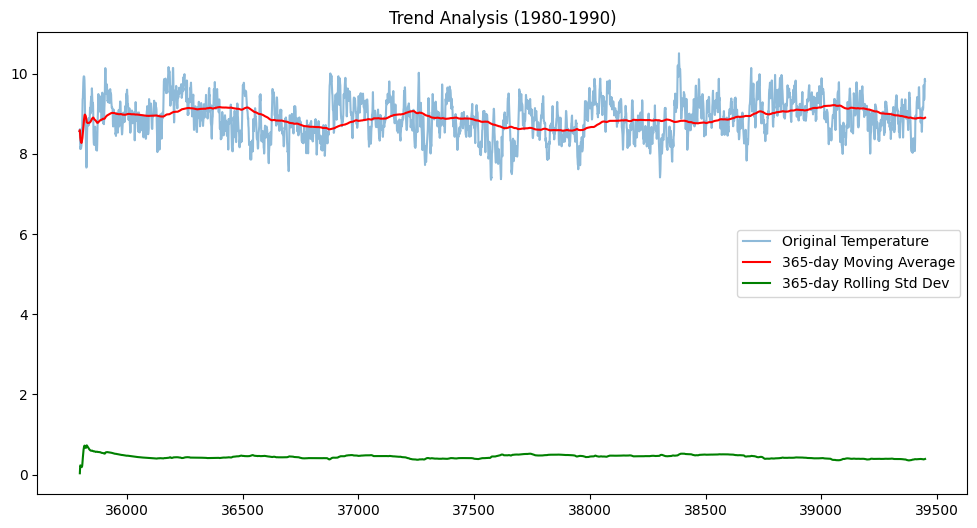

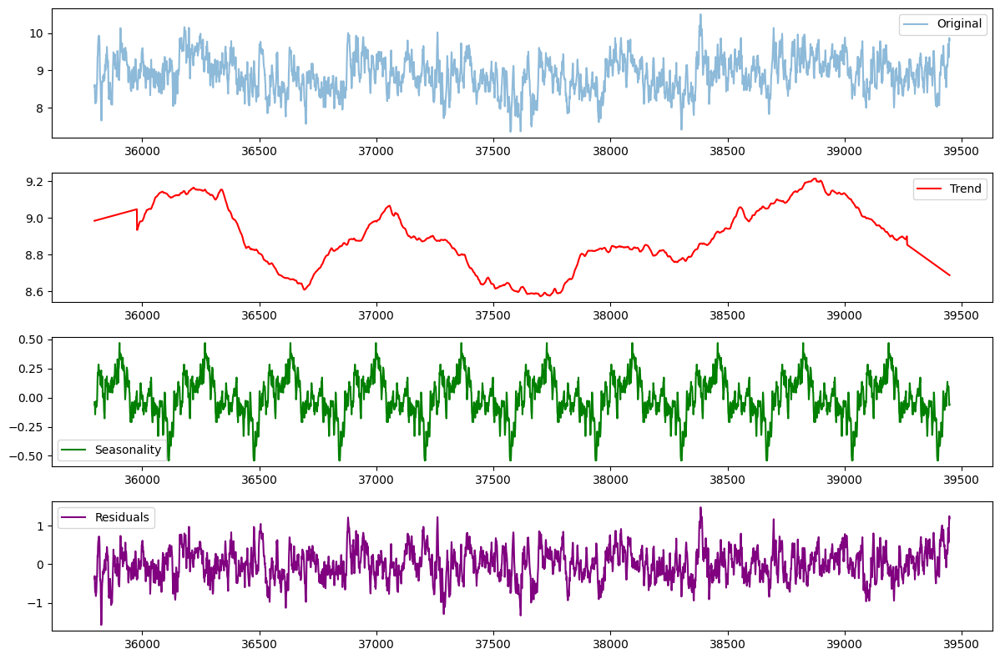

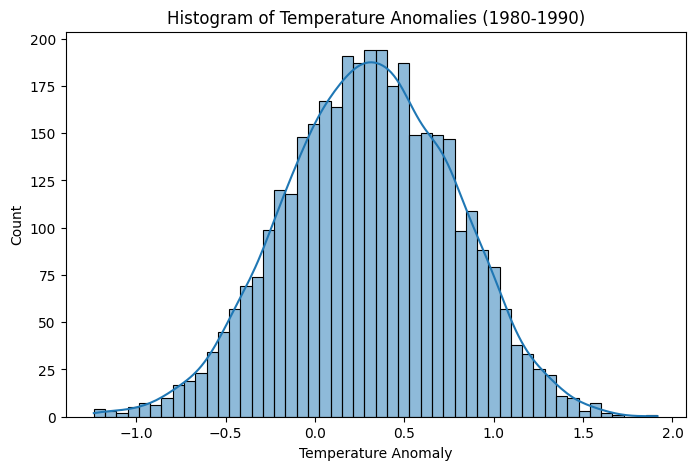

Analyzing period: 1990-2000
Number of Outliers: 72


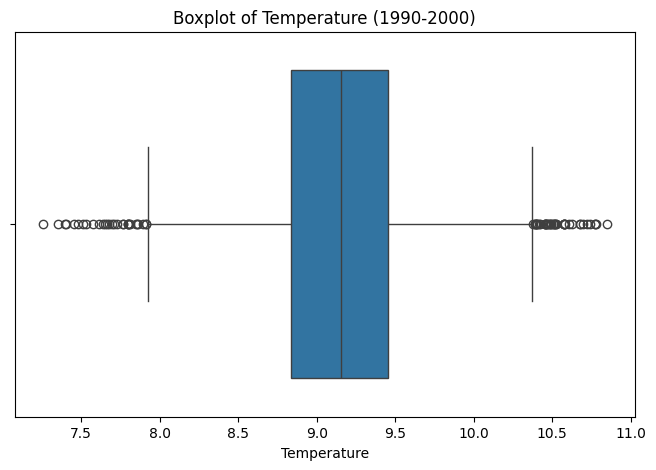

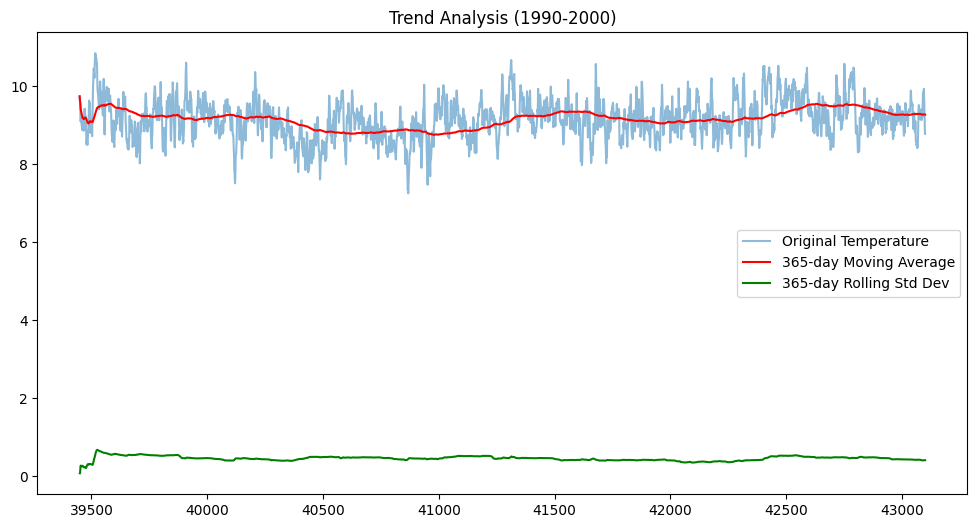

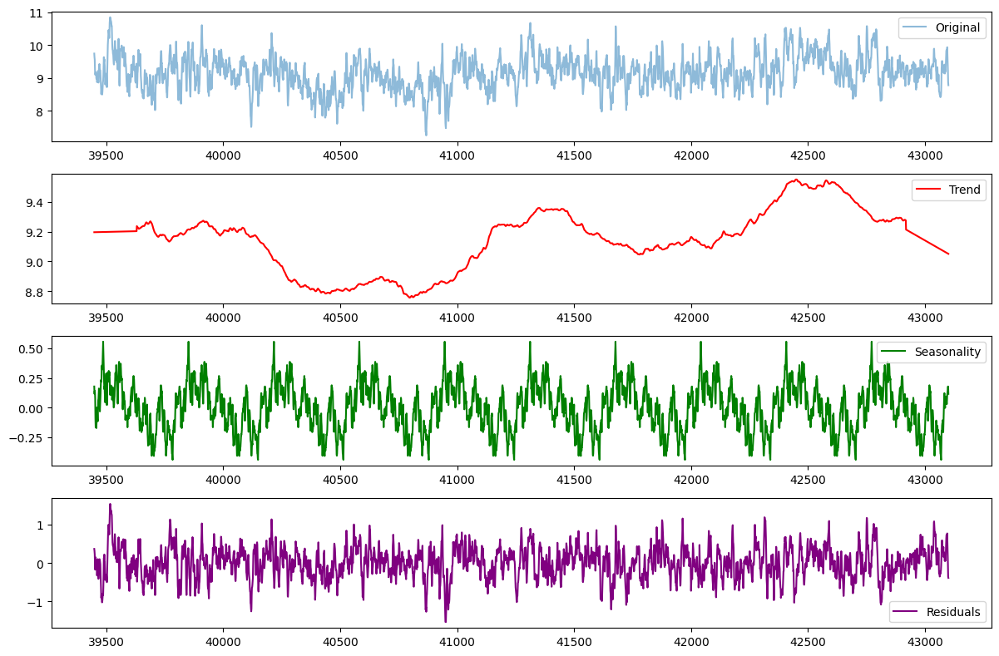

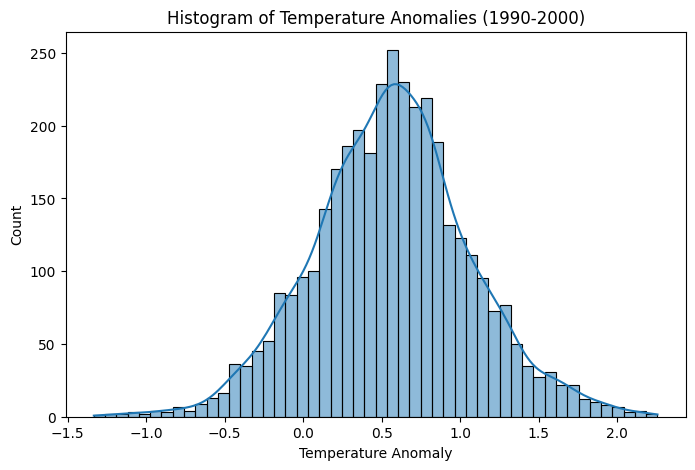

Analyzing period: 2000-2010
Number of Outliers: 48


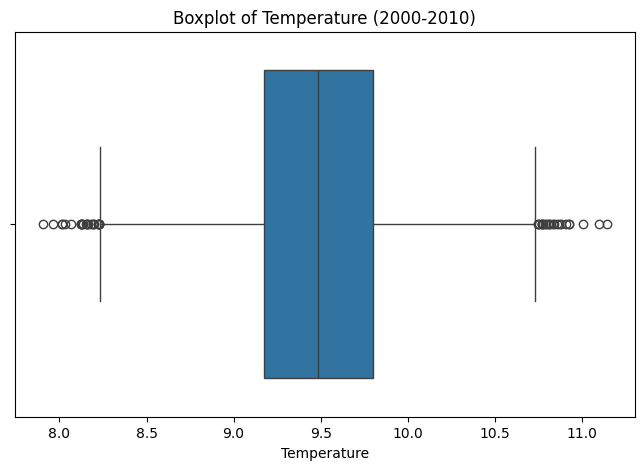

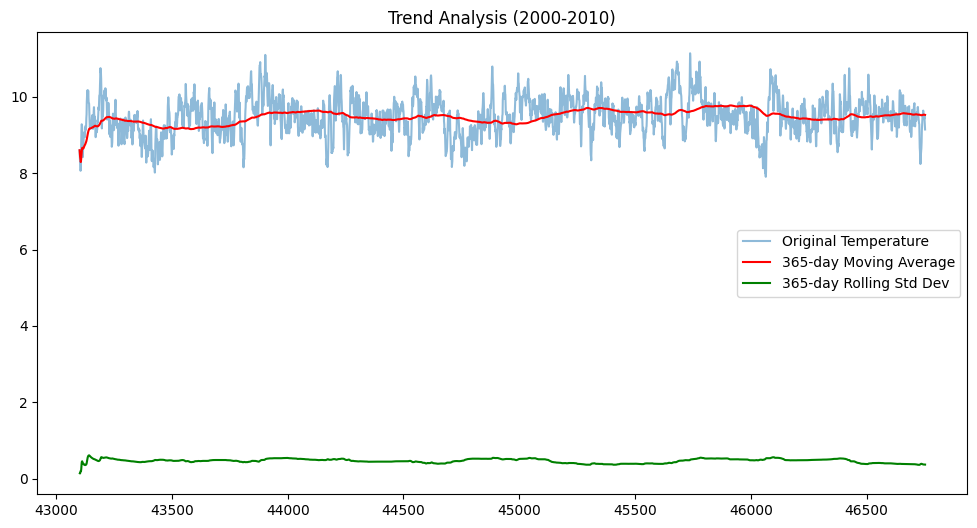

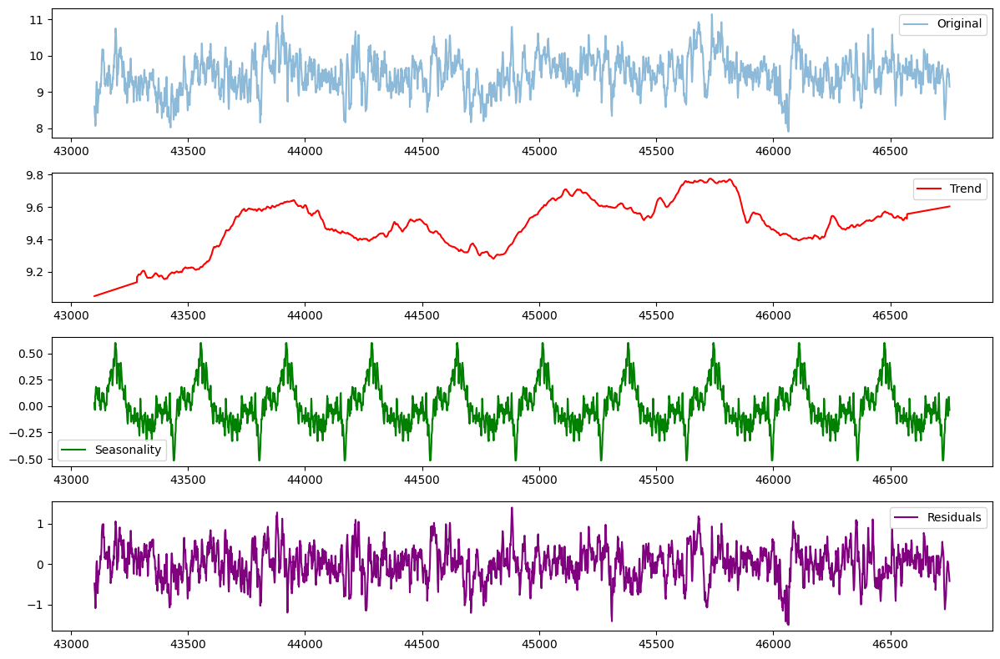

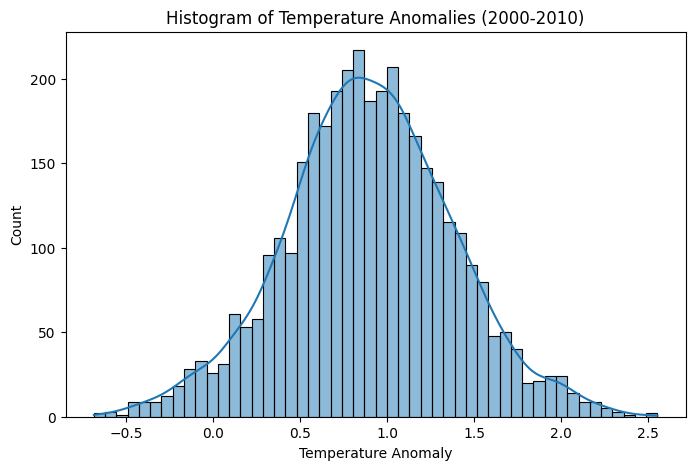

Analyzing period: 2010-2020
Number of Outliers: 67


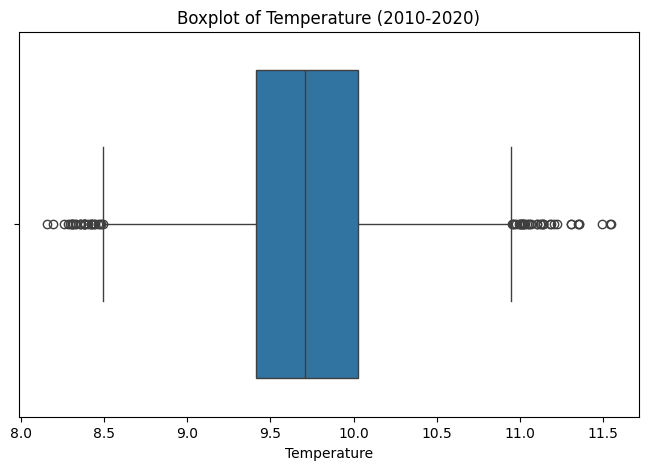

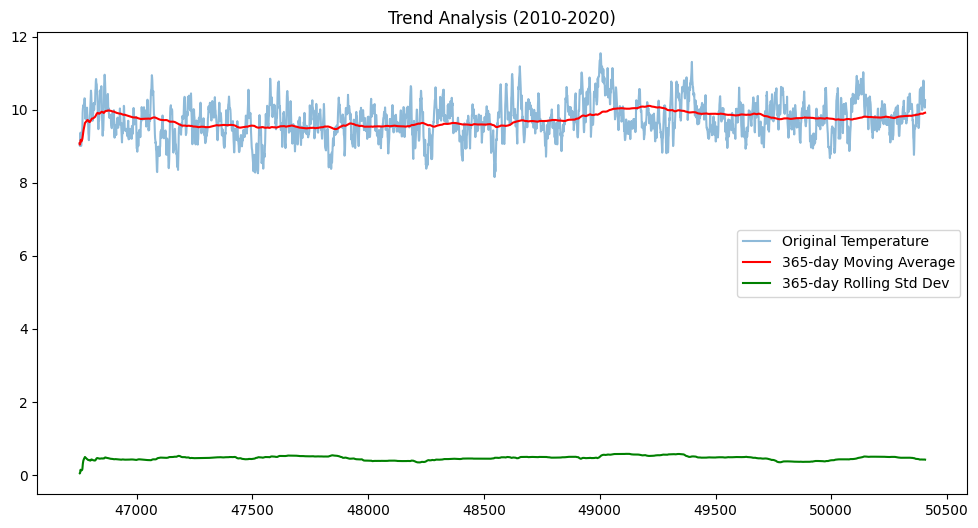

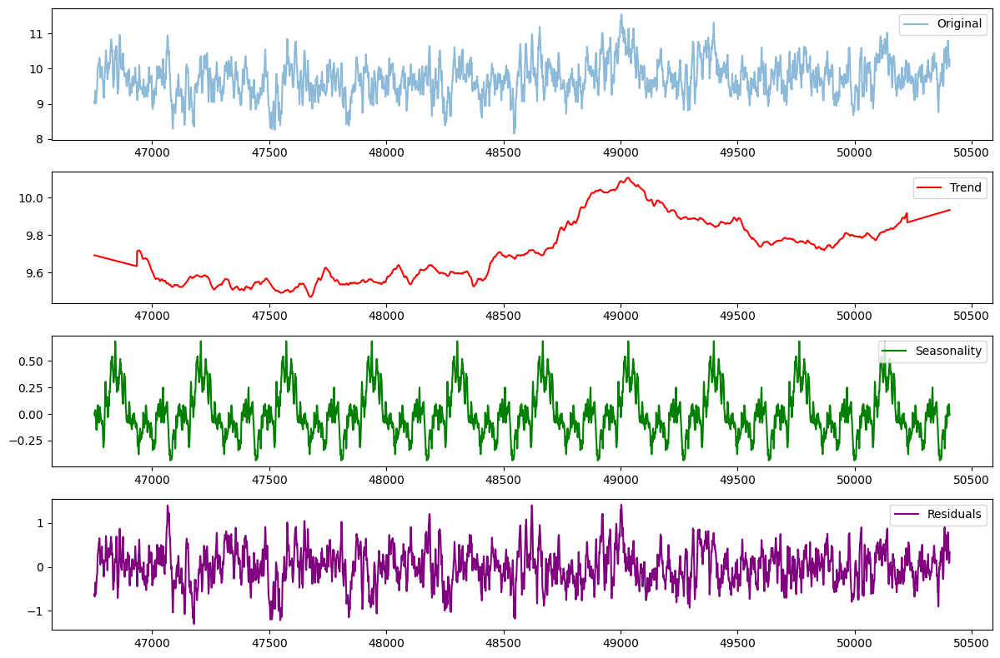

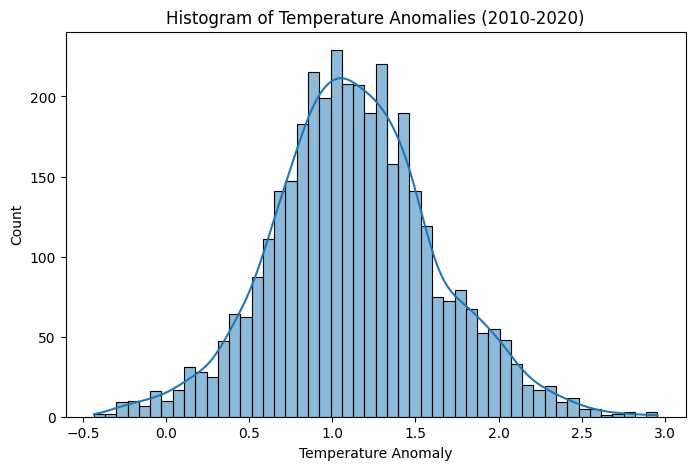

In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose

# Assuming df contains the dataset with 'Year', 'Temperature', and 'Anomaly' columns
group_size = 10
start_year = 1880
end_year = 2020

for start in range(start_year, end_year, group_size):
    df_group = df[(df['Year'] >= start) & (df['Year'] < start + group_size)].copy()
    print(f"Analyzing period: {start}-{start + group_size}")
    
    # Outlier Detection using IQR
    Q1 = df_group['Temperature'].quantile(0.25)
    Q3 = df_group['Temperature'].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df_group[(df_group['Temperature'] < lower_bound) | (df_group['Temperature'] > upper_bound)]
    print(f"Number of Outliers: {len(outliers)}")
    
    # Boxplot for Outliers
    plt.figure(figsize=(8, 5))
    sns.boxplot(x=df_group['Temperature'])
    plt.title(f"Boxplot of Temperature ({start}-{start + group_size})")
    plt.show()
    
    # Trend Analysis using Moving Average
    df_group['Rolling_Mean'] = df_group['Temperature'].rolling(window=365, min_periods=1).mean()
    df_group['Rolling_Std'] = df_group['Temperature'].rolling(window=365, min_periods=1).std()
    
    plt.figure(figsize=(12, 6))
    plt.plot(df_group['Temperature'], label="Original Temperature", alpha=0.5)
    plt.plot(df_group['Rolling_Mean'], label="365-day Moving Average", color='red')
    plt.plot(df_group['Rolling_Std'], label="365-day Rolling Std Dev", color='green')
    plt.title(f"Trend Analysis ({start}-{start + group_size})")
    plt.legend()
    plt.show()
    
    # Seasonal Decomposition
    decomposition = seasonal_decompose(df_group['Temperature'], period=365, model='additive', extrapolate_trend='freq')
    
    plt.figure(figsize=(12, 8))
    plt.subplot(411)
    plt.plot(df_group['Temperature'], label="Original", alpha=0.5)
    plt.legend()
    
    plt.subplot(412)
    plt.plot(decomposition.trend, label="Trend", color='red')
    plt.legend()
    
    plt.subplot(413)
    plt.plot(decomposition.seasonal, label="Seasonality", color='green')
    plt.legend()
    
    plt.subplot(414)
    plt.plot(decomposition.resid, label="Residuals", color='purple')
    plt.legend()
    
    plt.tight_layout()
    plt.show()
    
    # Histogram of Temperature Anomalies
    plt.figure(figsize=(8, 5))
    sns.histplot(df_group['Anomaly'], bins=50, kde=True)
    plt.title(f"Histogram of Temperature Anomalies ({start}-{start + group_size})")
    plt.xlabel("Temperature Anomaly")
    plt.show()


# Mean significance tests 

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind, f_oneway, shapiro
import scipy.stats as stats

# Convert 'Date' column to datetime (modify column name if needed)
if 'Date' in df.columns:
    df['Date'] = pd.to_datetime(df['Date'])
    df.set_index('Date', inplace=True)

# Drop missing values
df.dropna(subset=['Temperature'], inplace=True)
print(df.head())
### ---- 1. Hypothesis Testing ---- ###

# Splitting the data into two periods for t-test
early_period = df[df.index.year < 1950]['Temperature']
recent_period = df[df.index.year >= 2000]['Temperature']

# Independent t-test (assumes normality)
t_stat, p_value = ttest_ind(early_period, recent_period, equal_var=False)
print(f"T-test results: t-statistic={t_stat:.4f}, p-value={p_value:.4f}")

if p_value < 0.05:
    print("Reject H0: The mean temperature has significantly changed over time.")
else:
    print("Fail to reject H0: No significant change in mean temperature.")

# ANOVA test for multiple time periods (dividing data into 50-year bins)
df['Year'] = df.index.year
df['Period'] = pd.cut(df['Year'], bins=[1880, 1930, 1980, 2020], labels=['1880-1930', '1930-1980', '1980-2020'])

# Perform ANOVA
anova_groups = [df[df['Period'] == period]['Temperature'] for period in df['Period'].unique()]
anova_stat, anova_p = f_oneway(*anova_groups)
print(f"ANOVA results: F-statistic={anova_stat:.4f}, p-value={anova_p:.4f}")

if anova_p < 0.05:
    print("Reject H0: Mean temperatures differ significantly across time periods.")
else:
    print("Fail to reject H0: No significant difference in mean temperatures across periods.")

### ---- 2. Fitting a Multivariate Normal Distribution ---- ###

# Check normality assumption (Shapiro-Wilk Test on a sample)
sample = df['Temperature'].sample(500, random_state=42)  # Take a sample for normality check
shapiro_stat, shapiro_p = shapiro(sample)
print(f"Shapiro-Wilk Test: Statistic={shapiro_stat:.4f}, p-value={shapiro_p:.4f}")

if shapiro_p < 0.05:
    print("Data is not normally distributed (p < 0.05). Consider transformations.")
else:
    print("Data follows normal distribution (p >= 0.05).")

# QQ Plot for normality check
plt.figure(figsize=(6, 6))
stats.probplot(sample, dist="norm", plot=plt)
plt.title("QQ Plot of Temperature")
plt.show()

# Compute Covariance Matrix
cov_matrix = np.cov(df[['Temperature', 'Anomaly']].dropna().T)
print("Covariance Matrix:\n", cov_matrix)



   Year  Month  Day  Day of Year  Anomaly  Temperature  Rolling_Mean  \
0  1880      1    1            1   -0.692        7.898      7.898000   
1  1880      1    2            2   -0.592        7.998      7.948000   
2  1880      1    3            3   -0.673        7.917      7.937667   
3  1880      1    4            4   -0.615        7.975      7.947000   
4  1880      1    5            5   -0.681        7.909      7.939400   

   Rolling_Std  
0          NaN  
1          NaN  
2          NaN  
3          NaN  
4          NaN  


AttributeError: 'RangeIndex' object has no attribute 'year'

# 10 years group study and 35 years group study

In [ ]:
# Extract Year and compute yearly average temperature
df["Year"] = df.index.year
yearly_avg_temp = df.groupby("Year")["Temperature"].mean().reset_index()

# Define group configurations
group_configs = {
    "10-Year Groups": (14, 10),
    "35-Year Groups": (4, 35),
}

# Dictionary to store all results
all_distribution_stats = {}

# Perform analysis for each group size
for group_name, (num_groups, group_size) in group_configs.items():
    
    # Create figure for subplots
    fig, axes = plt.subplots(num_groups, 2, figsize=(12, 5 * num_groups))

    # Dictionary to store statistics for the current group
    distribution_stats = {}

    # Perform distribution analysis for each group
    for i in range(num_groups):
        start_index = i * group_size
        end_index = start_index + group_size

        if end_index > len(yearly_avg_temp):
            break  # Stop if out of range

        # Extract temperature data for the group
        group_data = yearly_avg_temp.iloc[start_index:end_index]["Temperature"]
        start_year = yearly_avg_temp.iloc[start_index]["Year"]
        end_year = yearly_avg_temp.iloc[end_index - 1]["Year"]
        group_label = f"{start_year}-{end_year}"

        # Compute statistical metrics
        stats_dict = {
            "Mean": np.mean(group_data),
            "Median": np.median(group_data),
            "Variance": np.var(group_data, ddof=1),
            "Skewness": stats.skew(group_data),
            "Kurtosis": stats.kurtosis(group_data),
        }
        distribution_stats[group_label] = stats_dict

        # Plot Histogram & KDE
        sns.histplot(group_data, bins=10, kde=True, ax=axes[i, 0], color="skyblue")
        axes[i, 0].set_title(f"Histogram & KDE: {group_label}")
        axes[i, 0].set_xlabel("Temperature")

        # Q-Q Plot (Normality Check)
        stats.probplot(group_data, dist="norm", plot=axes[i, 1])
        axes[i, 1].set_title(f"Q-Q Plot: {group_label}")

    # Convert dictionary to DataFrame and store results
    distribution_df = pd.DataFrame.from_dict(distribution_stats, orient="index")
    all_distribution_stats[group_name] = distribution_df

    # Save statistics to CSV
    filename = f"temperature_distribution_{group_name.replace(' ', '_').lower()}.csv"
    distribution_df.to_csv(filename)

    # Show plots
    plt.tight_layout()
    plt.show()

    # Print DataFrame
    print(f"📊 Distribution Statistics for {group_name}:")
    print(distribution_df)
    print("\n" + "=" * 80 + "\n")

In [ ]:
df["Year"] = df.index.year
yearly_avg_temp = df.groupby("Year")["Temperature"].mean().reset_index()

# Define the number of groups and group size
num_groups = 14
group_size = 10

# Plot KDE curves for each group
plt.figure(figsize=(12, 6))

for i in range(num_groups):
    start_index = i * group_size
    end_index = start_index + group_size

    if end_index > len(yearly_avg_temp):
        break  # Stop if out of range

    # Extract temperature data for the group
    group_data = yearly_avg_temp.iloc[start_index:end_index]["Temperature"]
    start_year = yearly_avg_temp.iloc[start_index]["Year"]
    end_year = yearly_avg_temp.iloc[end_index - 1]["Year"]

    # Plot KDE for the group
    sns.kdeplot(group_data, label=f"{start_year}-{end_year}", linewidth=2)

# Add labels and title
plt.xlabel("Temperature", fontsize=12)
plt.ylabel("Density", fontsize=12)
plt.title("Kernel Density Estimation (KDE) of Temperature Distributions (14 Groups of 10 Years)", fontsize=14)
plt.legend(title="Year Ranges", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)

# Show plot
plt.show()

# 20 years group study 

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats

# Extract Year, Month, and Day
df["Year"] = df.index.year
df["Month"] = df.index.month
df["Day"] = df.index.day


# Define the number of groups and group size
num_groups = 7
group_size = 20

# Create an empty dictionary to store statistics
distribution_stats = {}

# Create plots
fig, axes = plt.subplots(num_groups, 3, figsize=(18, 5 * num_groups))  # Added an extra column for log-normality

# Perform distribution analysis for each group
for i in range(num_groups):
    start_index = i * group_size
    end_index = start_index + group_size

    if end_index > len(df):
        break  # Stop if out of range

    # Extract daily temperature data for the group
    group_data = df.iloc[start_index:end_index]["Temperature"]
    group_label = f"Group {i+1} ({df.iloc[start_index]['Year']}-{df.iloc[start_index]['Month']}-{df.iloc[start_index]['Day']} to {df.iloc[end_index-1]['Year']}-{df.iloc[end_index-1]['Month']}-{df.iloc[end_index-1]['Day']})"

    # Compute descriptive statistics
    stats_dict = {
        "Mean": np.mean(group_data),
        "Median": np.median(group_data),
        "Variance": np.var(group_data, ddof=1),
        "Skewness": stats.skew(group_data),
        "Kurtosis": stats.kurtosis(group_data),
    }

    # **Normality Test** (Shapiro-Wilk)
    shapiro_test = stats.shapiro(group_data)
    stats_dict["Normality (Shapiro-Wilk) p-value"] = shapiro_test.pvalue

    # **Log-Normality Test** (Kolmogorov-Smirnov Test)
    log_data = np.log(group_data[group_data > 0])  # Take log, avoid log(0) issues
    ks_test = stats.kstest(log_data, 'norm', args=(np.mean(log_data), np.std(log_data)))
    stats_dict["Log-Normality (KS test) p-value"] = ks_test.pvalue

    distribution_stats[group_label] = stats_dict

    # **Histogram & KDE plot**
    sns.histplot(group_data, bins=10, kde=True, ax=axes[i, 0], color="skyblue")
    axes[i, 0].set_title(f"Histogram & KDE: {group_label}")
    axes[i, 0].set_xlabel("Temperature")

    # **Q-Q Plot for Normality**
    stats.probplot(group_data, dist="norm", plot=axes[i, 1])
    axes[i, 1].set_title(f"Q-Q Plot: {group_label}")

    # **Q-Q Plot for Log-Normality**
    stats.probplot(log_data, dist="norm", plot=axes[i, 2])
    axes[i, 2].set_title(f"Log-Normal Q-Q Plot: {group_label}")

# Save distribution statistics to a DataFrame
distribution_df = pd.DataFrame.from_dict(distribution_stats, orient="index")

# Show plots
plt.tight_layout()
plt.show()

# Save statistics to CSV
distribution_df.to_csv("daily_temperature_distribution_study_with_normality.csv")

# Print results
print(distribution_df)


In [ ]:
# Define the number of groups and group size
num_groups = 7
group_size = 20

# Plot KDE curves for each group
plt.figure(figsize=(12, 6))

for i in range(num_groups):
    start_index = i * group_size
    end_index = start_index + group_size

    if end_index > len(yearly_avg_temp):
        break  # Stop if out of range

    # Extract temperature data for the group
    group_data = yearly_avg_temp.iloc[start_index:end_index]["Temperature"]
    start_year = yearly_avg_temp.iloc[start_index]["Year"]
    end_year = yearly_avg_temp.iloc[end_index - 1]["Year"]

    # Plot KDE for the group
    sns.kdeplot(group_data, label=f"{start_year}-{end_year}", linewidth=2)

# Add labels and title
plt.xlabel("Temperature", fontsize=12)
plt.ylabel("Density", fontsize=12)
plt.title("Kernel Density Estimation (KDE) of Temperature Distributions (7 Groups of 20 Years)", fontsize=14)
plt.legend(title="Year Ranges")
plt.grid(True)

# Show plot
plt.show()

# Growth Rate calculations 
Annual growth rate and n- yearly growth rates (n=10,20,35,70)

In [ ]:
import pandas as pd
import numpy as np

# Load data (Assuming df is already loaded and indexed by Date)

# Extract Year and calculate yearly average temperature
df["Year"] = df.index.year
yearly_avg_temp = df.groupby("Year")["Temperature"].mean().reset_index()

# Function to calculate CAGR using two formulas
def calculate_cagr1(initial, final, years):
    return ((final / initial) ** (1 / years)) - 1 if years > 0 else np.nan

def calculate_cagr2(initial, final, years):
    return ((final / initial)) - 1 if years > 0 else np.nan

# Define the group sizes and names
group_sizes = [10, 20, 35, 70]  # Groups of 10, 20, 35, and 70 years
group_labels = ["10-Year Growth", "20-Year Growth", "35-Year Growth", "70-Year Growth"]

all_growth_data = {}

# Loop through each group size and compute CAGR using both formulas
for group_size, label in zip(group_sizes, group_labels):
    num_groups = len(yearly_avg_temp) // group_size  # Number of full groups
    growth_list1, growth_list2 = [], []

    for i in range(num_groups):
        start_index = i * group_size
        end_index = start_index + group_size - 1

        if end_index < len(yearly_avg_temp):
            temp_initial = yearly_avg_temp.iloc[start_index]["Temperature"]
            temp_final = yearly_avg_temp.iloc[end_index]["Temperature"]
            growth_list1.append(calculate_cagr1(temp_initial, temp_final, group_size))
            growth_list2.append(calculate_cagr2(temp_initial, temp_final, group_size))
        else:
            break  # Stop if the range goes out of bounds

    # Store results
    all_growth_data[f"{label} - CAGR1"] = growth_list1
    all_growth_data[f"{label} - CAGR2"] = growth_list2

# Find the maximum length among the lists
max_length = max(map(len, all_growth_data.values()))

# Pad shorter lists with NaN to match the maximum length
for key in all_growth_data:
    all_growth_data[key] += [np.nan] * (max_length - len(all_growth_data[key]))

# Convert to DataFrame
growth_df = pd.DataFrame.from_dict(all_growth_data)

growth_df.index = [f"Group {i+1}" for i in range(len(growth_df))]

# Save to CSV
growth_df.to_csv("temperature1_growth_analysis.csv")

# Display results
print(growth_df)


# Time Series Modelling

In [20]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error
from pmdarima import auto_arima

# Exploratory Analysis
plt.figure(figsize=(14,6))
plt.plot(df['Temperature'], label='Daily Temperature')
plt.title('Daily Global Temperature Over Time')
plt.xlabel('Index')
plt.ylabel('Temperature')
plt.legend()
plt.savefig("daily_global_temperature.png")  # Save with a meaningful filename
plt.close()

# ADF Test for Stationarity
def adf_test(series):
    result = adfuller(series.dropna())
    print(f"ADF Statistic: {result[0]}")
    print(f"p-value: {result[1]}")
    if result[1] > 0.05:
        print("Non-stationary series (p > 0.05)")
    else:
        print("Stationary series (p <= 0.05)")

print("ADF Test (Original Series):")
adf_test(df['Temperature'])

# Differencing
df['Temperature_Diff'] = df['Temperature'].diff()

print("\nADF Test (After Differencing):")
adf_test(df['Temperature_Diff'])

# ACF and PACF
fig, axes = plt.subplots(1, 2, figsize=(14,5))
plot_acf(df['Temperature_Diff'].dropna(), ax=axes[0])
plot_pacf(df['Temperature_Diff'].dropna(), ax=axes[1])
plt.savefig("acf_pacf_analysis.png")  # Save with an appropriate filename
plt.close() 

# Automatically select best ARIMA order
auto_model = auto_arima(
    df['Temperature'],
    seasonal=False,
    stepwise=True,
    suppress_warnings=True,
    error_action='ignore',
    trace=True,
    max_p=6,
    max_q=6
)

print(f"\nBest ARIMA Order Found: {auto_model.order}")

# Fit ARIMA Model
model = ARIMA(df['Temperature'], order=auto_model.order)
arima_result = model.fit()
print(arima_result.summary())

# Forecast next 365 days
forecast = arima_result.forecast(steps=365)

# Plot
plt.figure(figsize=(14,6))
plt.plot(df['Temperature'][-365:], label='Actual')
plt.plot(np.arange(len(df), len(df) + 365), forecast, label='Forecast', linestyle='dashed')
plt.title('ARIMA Forecast vs Actual (Last 365 Days)')
plt.xlabel('Index')
plt.ylabel('Temperature')
plt.legend()
plt.savefig("arima_forecast_vs_actual.png")  # Save with an appropriate filename
plt.close()  


# Evaluation
y_actual = df['Temperature'][-365:]
y_pred = forecast[:365]
mae = mean_absolute_error(y_actual, y_pred)
rmse = np.sqrt(mean_squared_error(y_actual, y_pred))
print(f"\nARIMA Performance on Full Dataset:")
print(f"MAE: {mae:.4f}")
print(f"RMSE: {rmse:.4f}")


ADF Test (Original Series):
ADF Statistic: -9.437660805688283
p-value: 4.991882507815218e-16
Stationary series (p <= 0.05)

ADF Test (After Differencing):
ADF Statistic: -43.762296113685935
p-value: 0.0
Stationary series (p <= 0.05)
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=-57163.089, Time=29.44 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-48399.827, Time=2.20 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-53767.450, Time=1.42 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-54586.133, Time=3.08 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-48401.822, Time=1.34 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=-54582.434, Time=8.30 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=-56872.395, Time=29.94 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=33.32 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=38.43 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-54594.783, Time=3.82 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=-57204.109, 


Analyzing period: 1880-1900


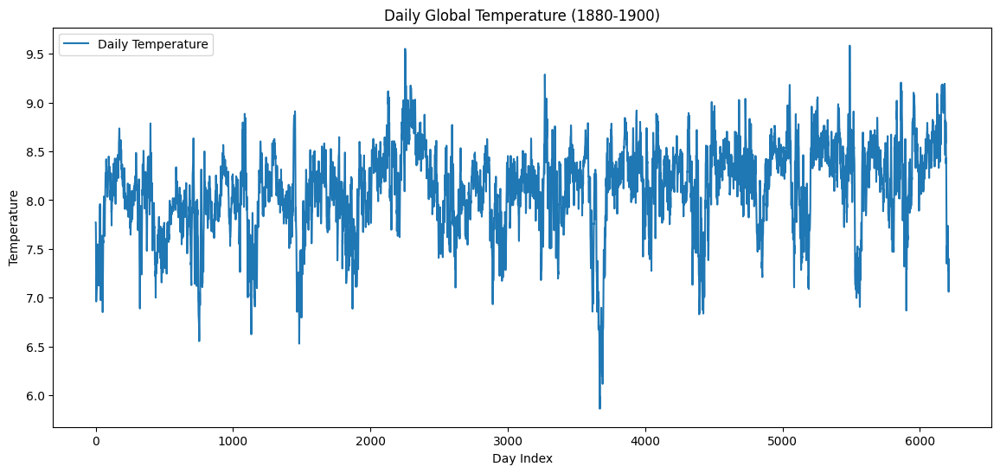

ADF Statistic: -9.505999565937447
p-value: 3.3461405645231796e-16
Stationary series (p <= 0.05)
ADF Statistic: -24.730374567814753
p-value: 0.0
Stationary series (p <= 0.05)


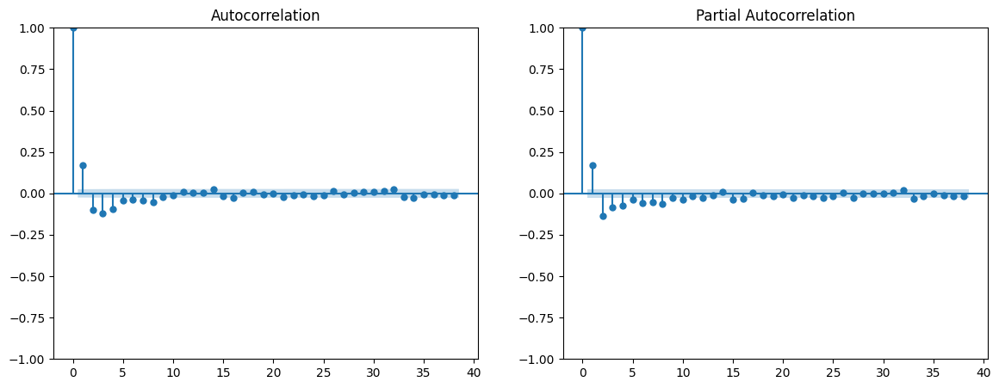

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=-7356.225, Time=4.08 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-6890.814, Time=0.34 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-7074.713, Time=0.51 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-7120.486, Time=0.57 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-6892.813, Time=0.16 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=-7360.900, Time=3.05 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=-7150.586, Time=1.63 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-7134.081, Time=1.28 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=-7362.650, Time=4.74 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=-7222.532, Time=1.04 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=-7357.826, Time=2.19 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=-7361.274, Time=4.74 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=-7295.500, Time=1.42 sec
 ARIMA(2,1,4)(0,0,0)[0] intercept   : AIC=-7359.212, Time=5.32 sec
 ARIMA(1,1,3)(0,0,0

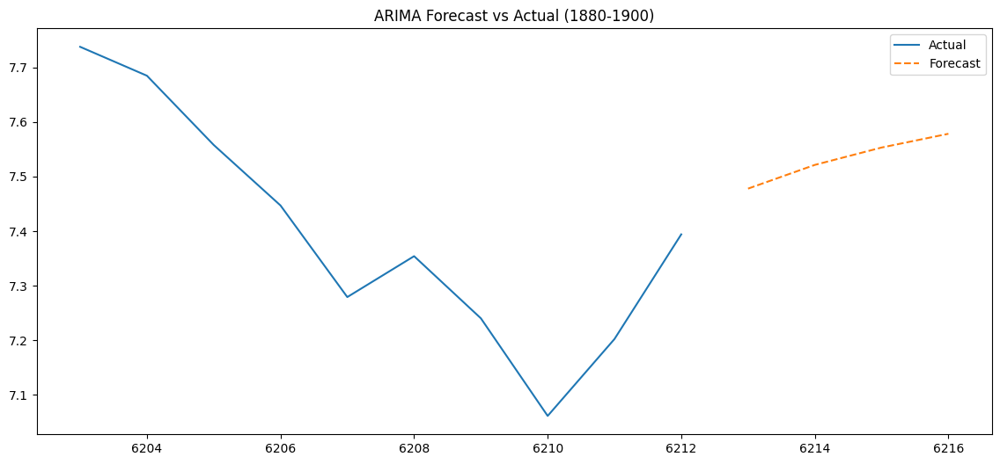

ARIMA MAE (1880-1900): 0.3085, RMSE: 0.3264

Analyzing period: 1900-1920


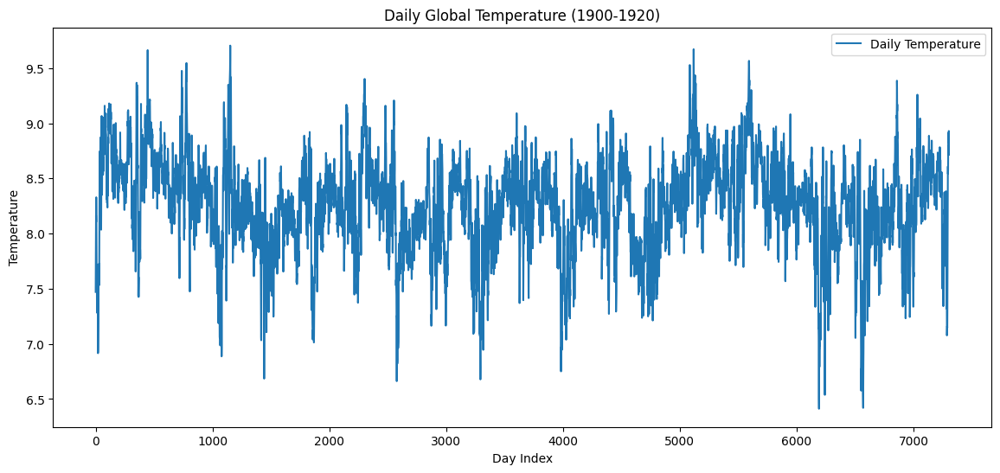

ADF Statistic: -11.319604391380265
p-value: 1.1830963854949672e-20
Stationary series (p <= 0.05)
ADF Statistic: -21.167372868090293
p-value: 0.0
Stationary series (p <= 0.05)


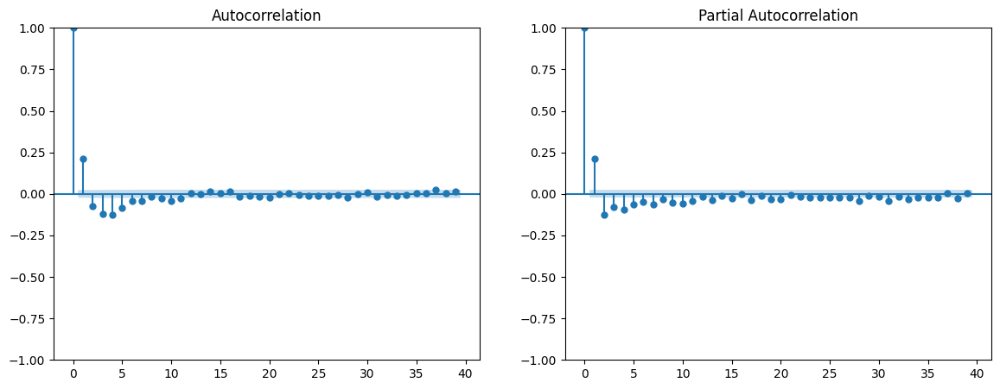

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=-7798.864, Time=4.07 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-7008.392, Time=0.44 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-7349.110, Time=0.31 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-7415.822, Time=0.58 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-7010.382, Time=0.15 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=5.81 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=-7789.314, Time=5.10 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=-7791.952, Time=4.65 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=-7789.912, Time=4.96 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-7420.823, Time=1.64 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=-7794.653, Time=4.56 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=-7804.966, Time=5.13 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=-7511.321, Time=0.74 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=-7804.548, Time=5.47 sec
 ARIMA(2,1,0)(0,0,0)[0] i

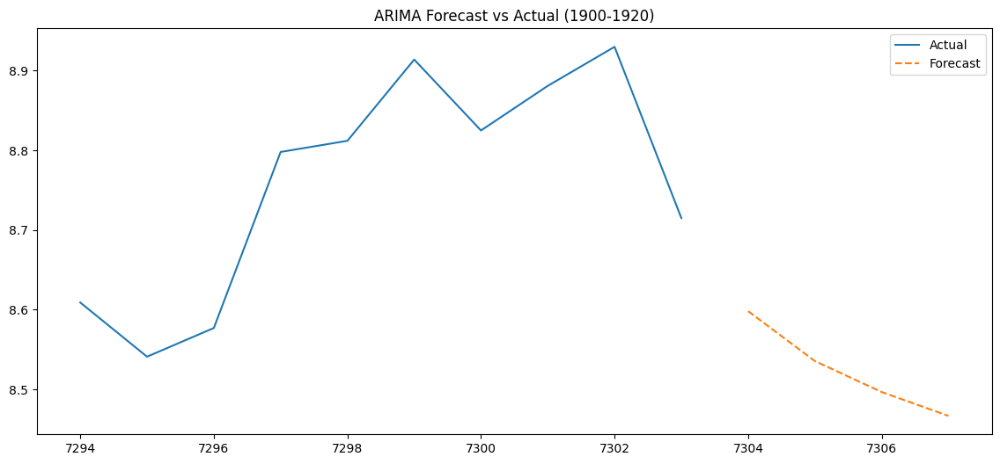

ARIMA MAE (1900-1920): 0.3136, RMSE: 0.3242

Analyzing period: 1920-1940


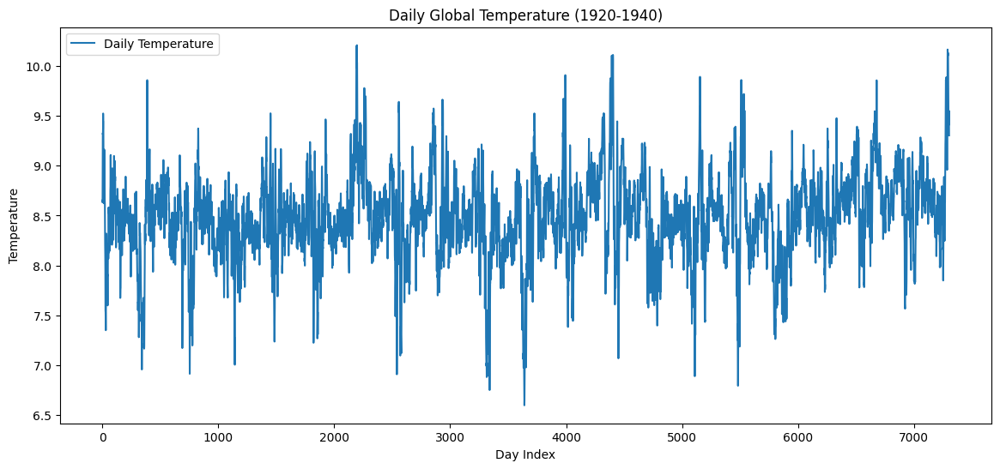

ADF Statistic: -13.478767214028714
p-value: 3.2724619072701088e-25
Stationary series (p <= 0.05)
ADF Statistic: -22.837800799250253
p-value: 0.0
Stationary series (p <= 0.05)


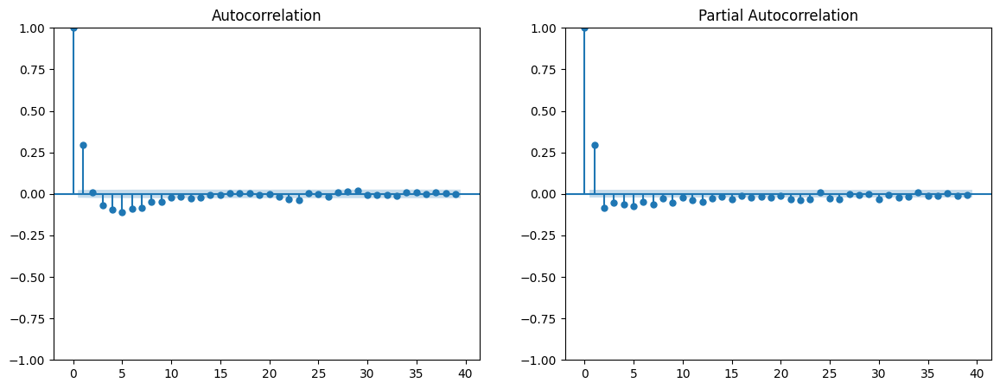

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=-9226.554, Time=4.12 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-8286.312, Time=0.30 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-8955.796, Time=1.40 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-8989.146, Time=0.54 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-8288.309, Time=0.14 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=-8999.913, Time=3.03 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=-9268.339, Time=3.10 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-8995.692, Time=0.78 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=-9009.027, Time=0.29 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=4.15 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=-9025.861, Time=0.77 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=6.89 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=inf, Time=1.32 sec

Best model:  ARIMA(2,1,1)(0,0,0)[0] intercept
Total fit time: 26.883 seconds
Selected Order (p,d,q): (2

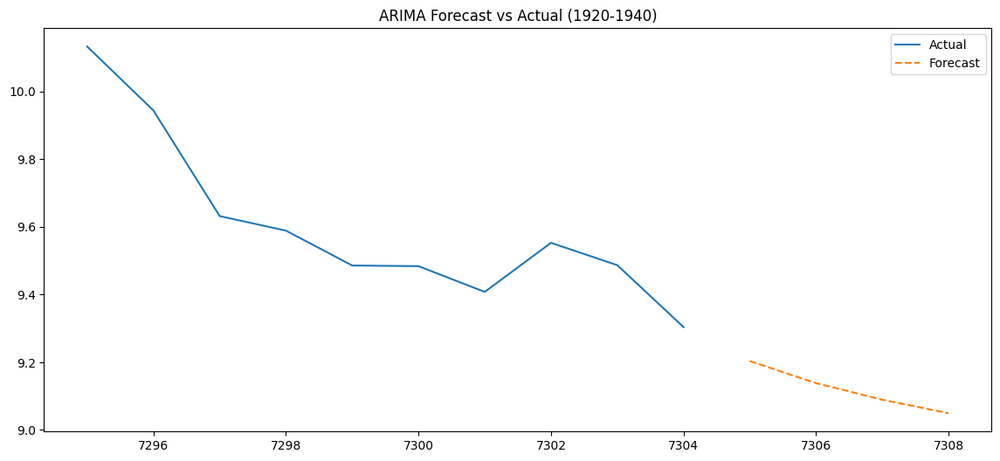

ARIMA MAE (1920-1940): 0.3177, RMSE: 0.3303

Analyzing period: 1940-1960


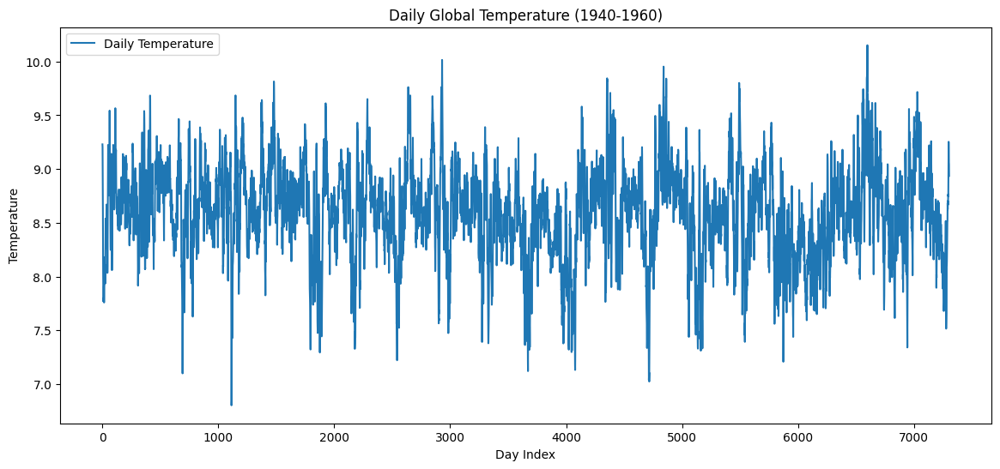

ADF Statistic: -12.27529371649404
p-value: 8.459582293576229e-23
Stationary series (p <= 0.05)
ADF Statistic: -20.324966838133054
p-value: 0.0
Stationary series (p <= 0.05)


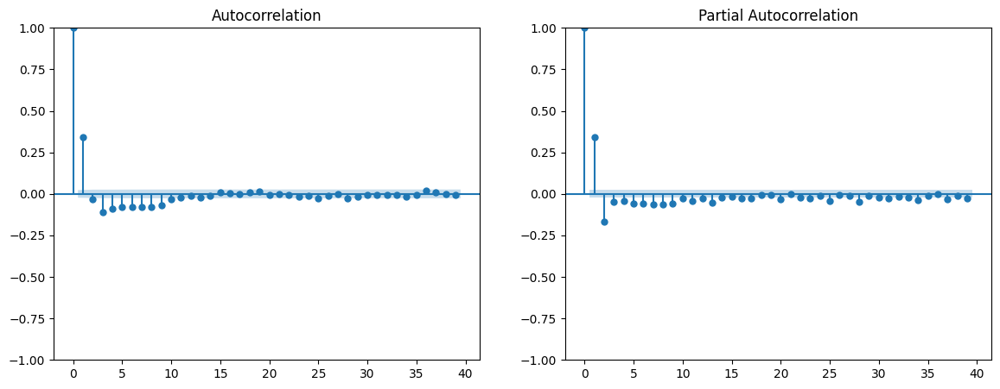

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=-9197.336, Time=3.74 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-7804.979, Time=0.31 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-8696.580, Time=0.67 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-8841.272, Time=0.58 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-7806.978, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=-9110.173, Time=2.61 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=-9131.656, Time=2.43 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=-9165.646, Time=4.32 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=5.45 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-8843.897, Time=0.91 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=5.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=-9201.021, Time=4.94 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=-8910.869, Time=0.38 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=-9186.042, Time=4.95 sec
 ARIMA(2,1,0)(0,0,0)[0] interce

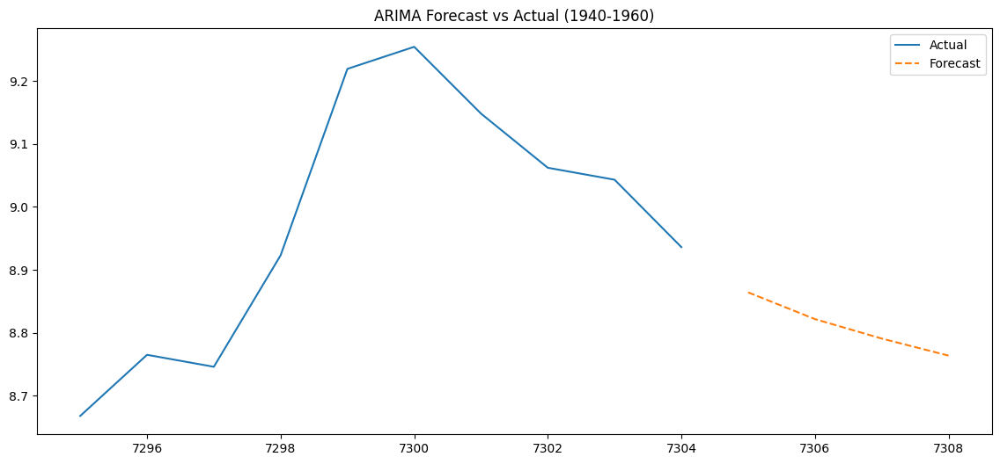

ARIMA MAE (1940-1960): 0.2372, RMSE: 0.2406

Analyzing period: 1960-1980


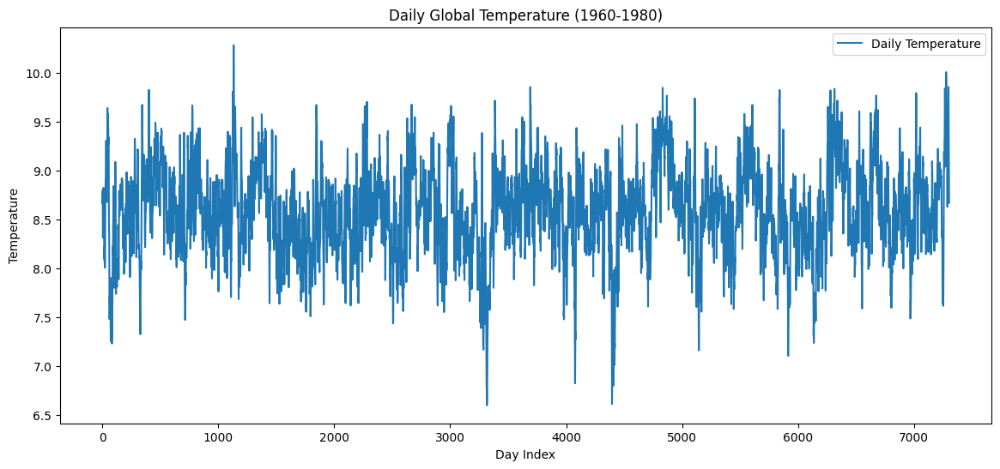

ADF Statistic: -11.993721933526885
p-value: 3.4729483329151113e-22
Stationary series (p <= 0.05)
ADF Statistic: -20.037106267414817
p-value: 0.0
Stationary series (p <= 0.05)


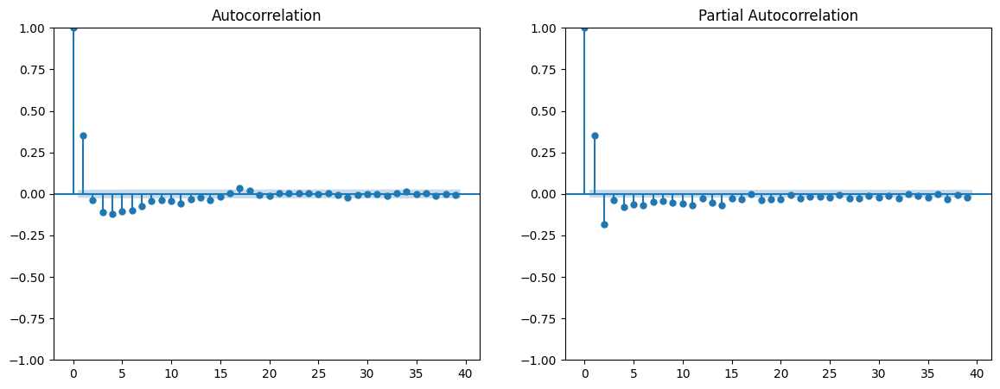

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=-7113.495, Time=2.74 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=52160.627, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=inf, Time=0.32 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=-7118.198, Time=0.73 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=32969.431, Time=0.49 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-7117.974, Time=0.23 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=-7144.448, Time=0.96 sec
 ARIMA(0,0,3)(0,0,0)[0]             : AIC=25465.631, Time=0.91 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=-7114.261, Time=2.36 sec
 ARIMA(1,0,4)(0,0,0)[0]             : AIC=-7207.252, Time=0.78 sec
 ARIMA(0,0,4)(0,0,0)[0]             : AIC=19531.028, Time=1.38 sec
 ARIMA(2,0,4)(0,0,0)[0]             : AIC=-7140.346, Time=3.28 sec
 ARIMA(1,0,5)(0,0,0)[0]             : AIC=-7270.931, Time=1.07 sec
 ARIMA(0,0,5)(0,0,0)[0]        

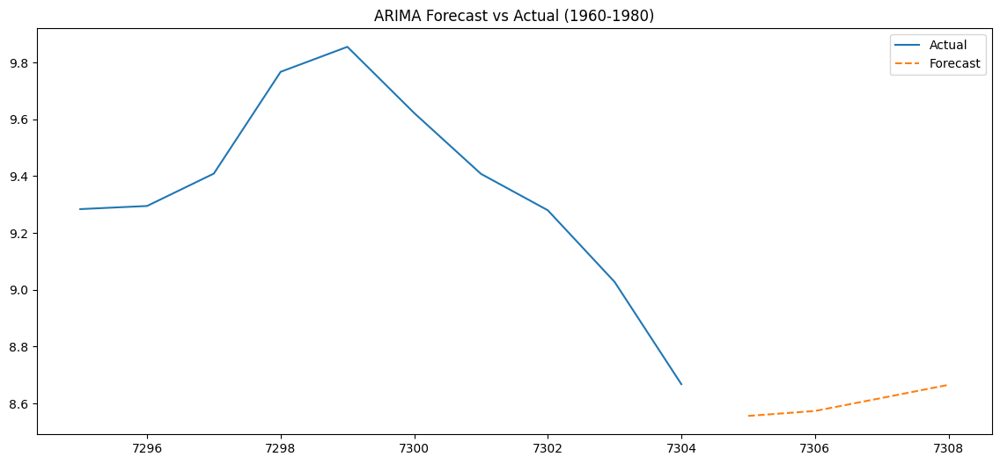

ARIMA MAE (1960-1980): 0.4921, RMSE: 0.5897

Analyzing period: 1980-2000


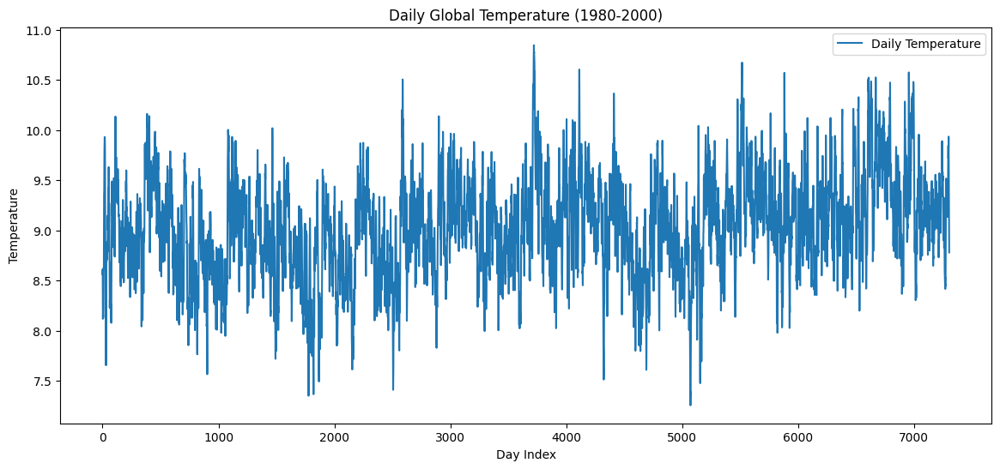

ADF Statistic: -7.820413456227168
p-value: 6.693545479622451e-12
Stationary series (p <= 0.05)
ADF Statistic: -21.99891719650499
p-value: 0.0
Stationary series (p <= 0.05)


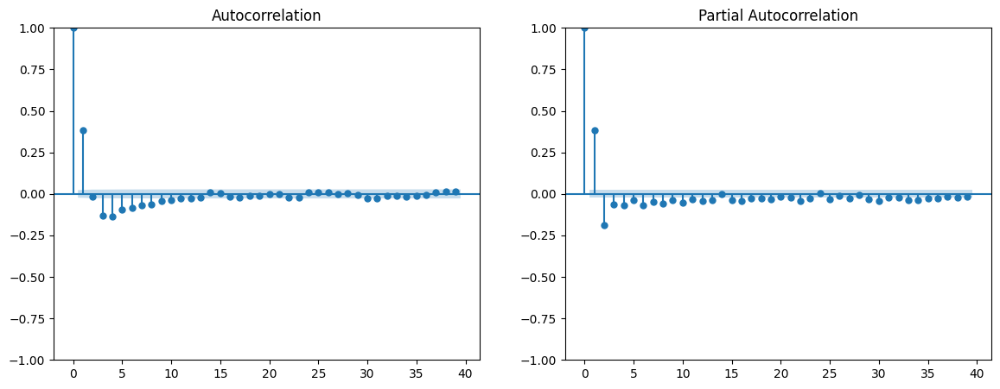

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=-7568.907, Time=3.75 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-5799.393, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-6941.991, Time=0.76 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-7123.404, Time=0.53 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-5801.392, Time=0.15 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=3.84 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=-7483.240, Time=3.38 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=-7505.095, Time=4.59 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=-7550.989, Time=5.04 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-7136.362, Time=1.01 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=3.21 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=-7572.700, Time=4.65 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=-7229.854, Time=0.45 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=-7551.042, Time=4.83 sec
 ARIMA(2,1,0)(0,0,0)[0] interce

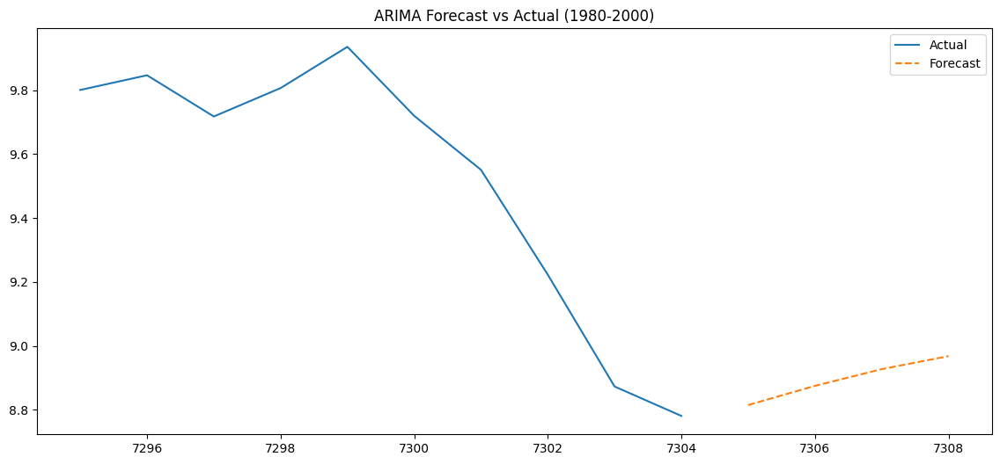

ARIMA MAE (1980-2000): 0.3313, RMSE: 0.4185

Analyzing period: 2000-2020


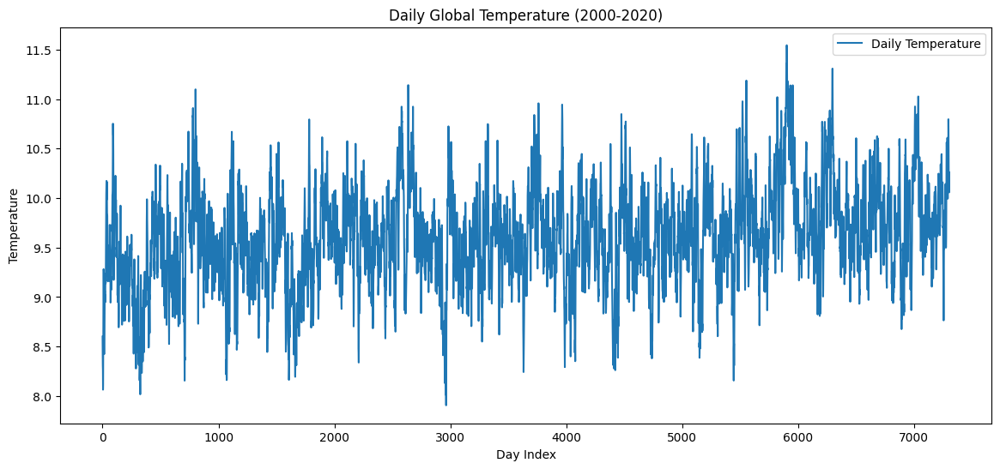

ADF Statistic: -14.245515559630434
p-value: 1.5119106986016173e-26
Stationary series (p <= 0.05)
ADF Statistic: -20.557143402726886
p-value: 0.0
Stationary series (p <= 0.05)


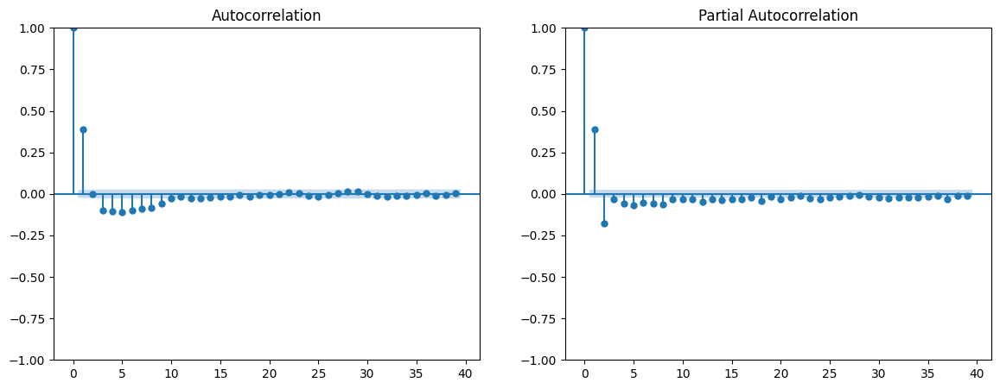

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=6.59 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-6194.864, Time=0.32 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-7387.833, Time=0.18 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-7558.217, Time=0.52 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-6196.849, Time=0.19 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-7577.079, Time=0.91 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=-7864.979, Time=3.34 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=-7624.647, Time=0.75 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=4.58 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=3.46 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=-7630.980, Time=0.45 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=-7880.396, Time=4.77 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=-7927.260, Time=6.13 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=-7879.431, Time=6.29 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   :

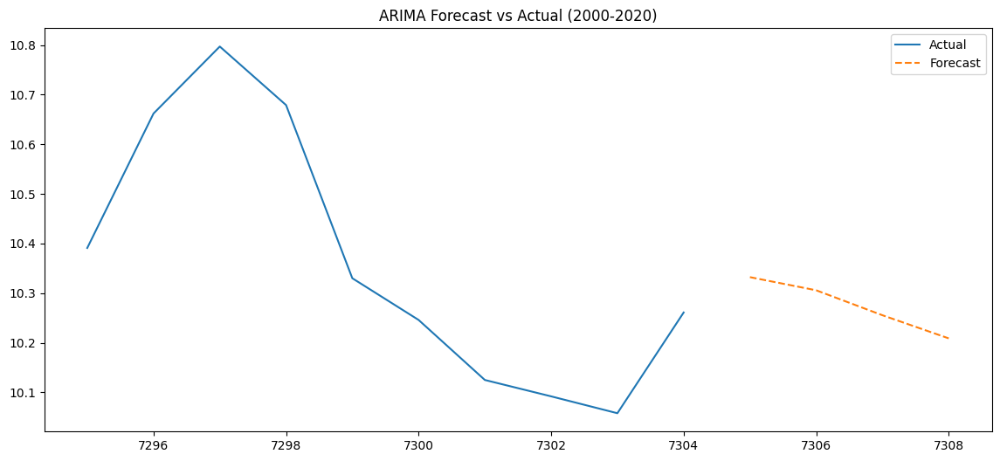

ARIMA MAE (2000-2020): 0.1676, RMSE: 0.1805

ARIMA Performance Summary:
  Time Period      Order       MAE      RMSE
0   1880-1900  (1, 1, 3)  0.308529  0.326355
1   1900-1920  (3, 1, 2)  0.313560  0.324202
2   1920-1940  (2, 1, 1)  0.317736  0.330327
3   1940-1960  (3, 1, 1)  0.237159  0.240629
4   1960-1980  (4, 0, 6)  0.492115  0.589666
5   1980-2000  (3, 1, 1)  0.331345  0.418542
6   2000-2020  (1, 1, 4)  0.167644  0.180514


In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.metrics import mean_absolute_error, mean_squared_error
from pmdarima import auto_arima

group_size = 20
start_year = 1880
end_year = 2020

def adf_test(series):
    result = adfuller(series.dropna())
    print(f"ADF Statistic: {result[0]}")
    print(f"p-value: {result[1]}")
    if result[1] > 0.05:
        print("Non-stationary series (p > 0.05)")
    else:
        print("Stationary series (p <= 0.05)")

results_list = []

for start in range(start_year, end_year, group_size):
    df_group = df[(df['Year'] >= start) & (df['Year'] < start + group_size)].copy()
    df_group.reset_index(drop=True, inplace=True)
    
    print(f"\nAnalyzing period: {start}-{start + group_size}")
    
    # Plot original temperature
    plt.figure(figsize=(14,6))
    plt.plot(df_group['Temperature'], label='Daily Temperature')
    plt.title(f'Daily Global Temperature ({start}-{start + group_size})')
    plt.xlabel('Day Index')
    plt.ylabel('Temperature')
    plt.legend()
    plt.show()
    
    # ADF Test
    adf_test(df_group['Temperature'])

    # Differencing
    df_group['Temperature_Diff'] = df_group['Temperature'].diff()
    adf_test(df_group['Temperature_Diff'].dropna())

    # ACF and PACF
    fig, axes = plt.subplots(1, 2, figsize=(14,5))
    plot_acf(df_group['Temperature_Diff'].dropna(), ax=axes[0])
    plot_pacf(df_group['Temperature_Diff'].dropna(), ax=axes[1])
    plt.show()

    # Auto ARIMA Order Selection
    auto_model = auto_arima(
        df_group['Temperature'],
        seasonal=False,
        stepwise=True,
        suppress_warnings=True,
        error_action='ignore',
        trace=True,
        max_p=6,
        max_q=6
    )

    print(f"Selected Order (p,d,q): {auto_model.order}")
    
    # Fit ARIMA using selected order
    model = ARIMA(df_group['Temperature'], order=auto_model.order)
    model_fit = model.fit()
    print(model_fit.summary())

    # Forecast next 4 values
    forecast = model_fit.forecast(steps=4)

    # Plot actual and forecast
    plt.figure(figsize=(14,6))
    plt.plot(df_group['Temperature'][-10:], label='Actual')
    plt.plot(
        np.arange(len(df_group), len(df_group)+4),
        forecast,
        label='Forecast',
        linestyle='dashed'
    )
    plt.title(f'ARIMA Forecast vs Actual ({start}-{start + group_size})')
    plt.legend()
    plt.show()

    # Performance metrics using actual last 4 values
    y_actual = df_group['Temperature'][-4:].values
    y_pred = forecast[:4]
    mae = mean_absolute_error(y_actual, y_pred)
    rmse = np.sqrt(mean_squared_error(y_actual, y_pred))
    print(f'ARIMA MAE ({start}-{start + group_size}): {mae:.4f}, RMSE: {rmse:.4f}')
    
    results_list.append({
        "Time Period": f"{start}-{start + group_size}",
        "Order": auto_model.order,
        "MAE": mae,
        "RMSE": rmse
    })

# Final DataFrame of results
results_df = pd.DataFrame(results_list)
print("\nARIMA Performance Summary:")
print(results_df)


Annual Temperature Summary:
   Year  MinTemp  MaxTemp  MeanTemp
0  1880    6.945    8.666  7.995557
1  1881    7.213    9.006  8.255378
2  1882    6.720    9.325  8.116529
3  1883    6.852    8.735  7.995145
4  1884    7.001    8.786  7.801880

=== Annual Minimum Temperature ===


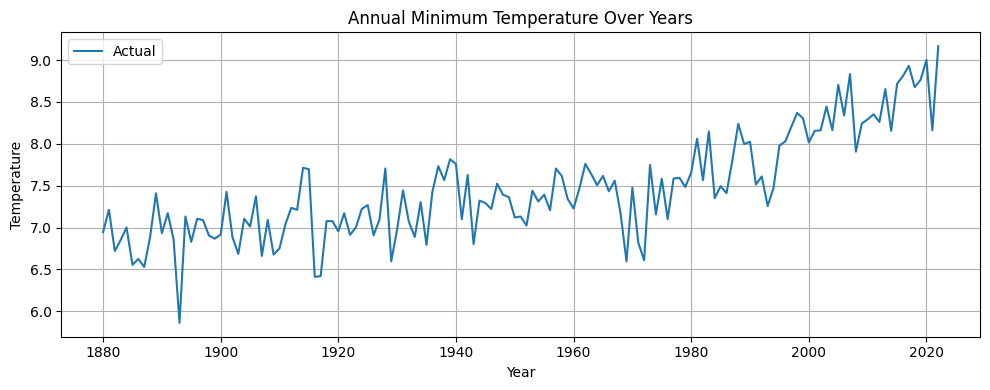


ADF Test - Annual Minimum Temperature
ADF Statistic: 0.1330
p-value: 0.9682
=> Non-stationary (p > 0.05)


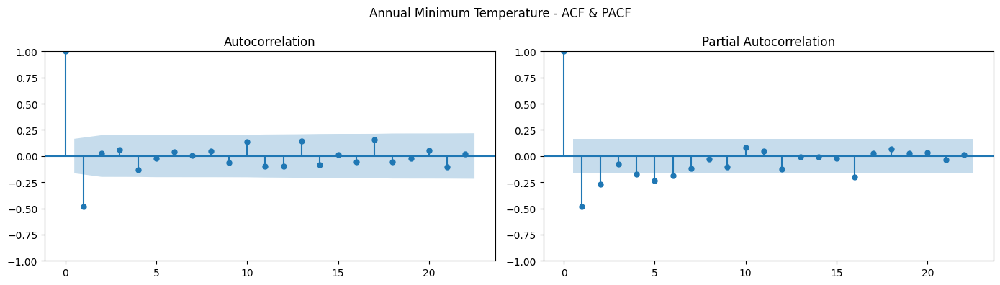

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=104.664, Time=0.53 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=163.981, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=126.994, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=100.377, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=162.173, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=101.663, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=101.781, Time=0.16 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=104.128, Time=0.16 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=103.725, Time=0.07 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.335 seconds
Selected ARIMA Order: (0, 1, 1)
                               SARIMAX Results                                
Dep. Variable:                MinTemp   No. Observations:                  143
Model:                 ARIMA(0, 1, 1)   Log Likelihood                 -49.863
Date:                Thu, 

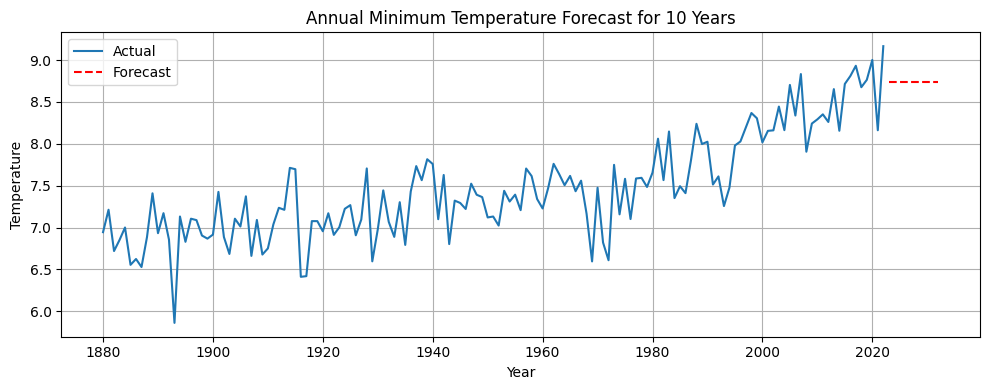


=== Annual Maximum Temperature ===


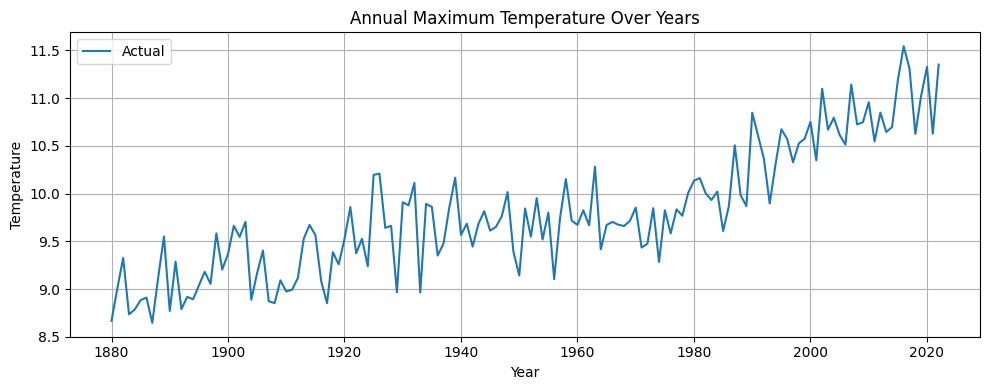


ADF Test - Annual Maximum Temperature
ADF Statistic: 0.8198
p-value: 0.9919
=> Non-stationary (p > 0.05)


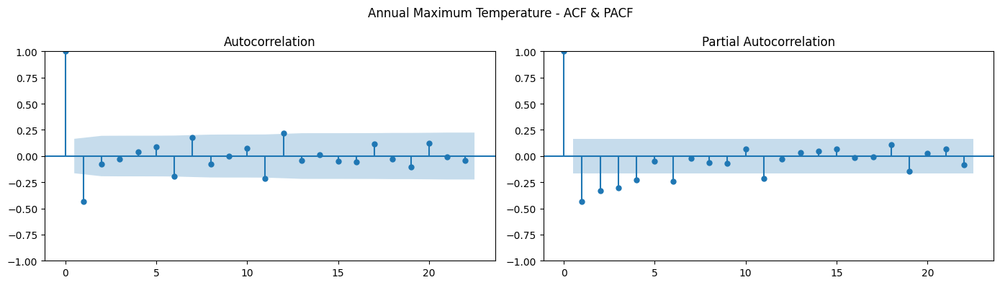

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=82.085, Time=0.92 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=149.246, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=120.757, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=77.889, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=147.557, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=79.858, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=79.849, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=84.407, Time=0.05 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 2.316 seconds
Selected ARIMA Order: (0, 1, 1)
                               SARIMAX Results                                
Dep. Variable:                MaxTemp   No. Observations:                  143
Model:                 ARIMA(0, 1, 1)   Log Likelihood                 -40.204
Date:                Thu, 08 May 20

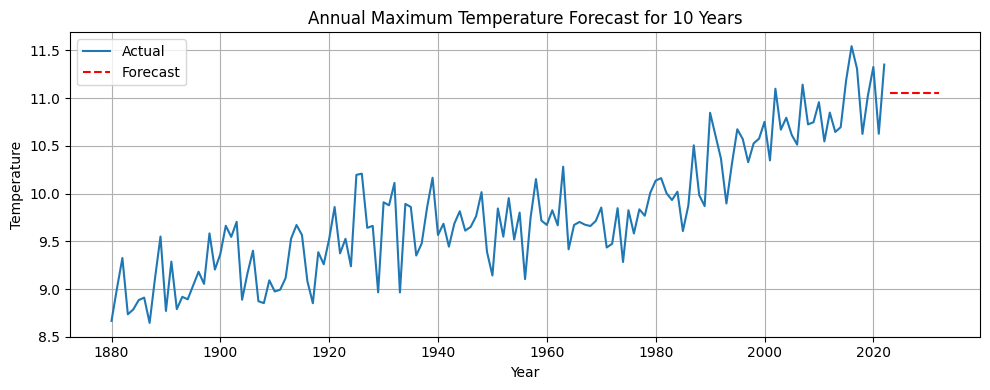


=== Annual Mean Temperature ===


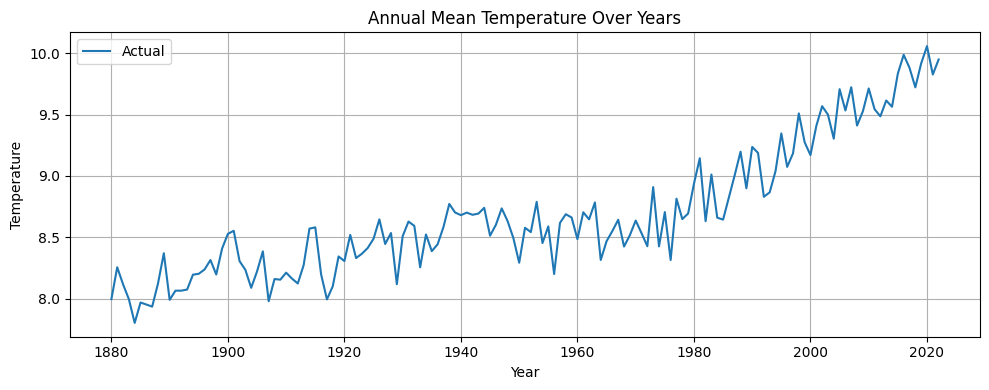


ADF Test - Annual Mean Temperature
ADF Statistic: 1.7800
p-value: 0.9983
=> Non-stationary (p > 0.05)


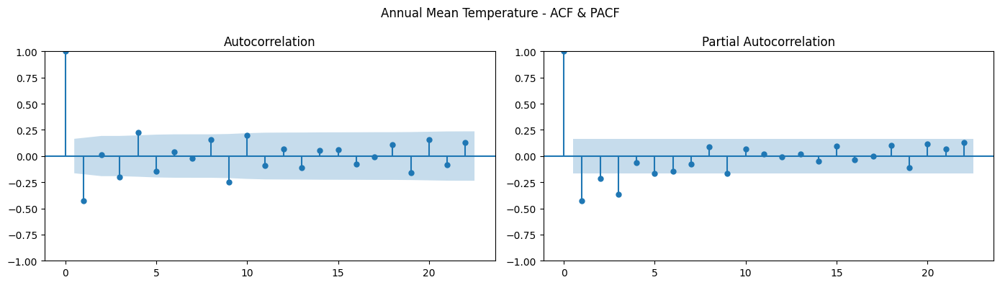

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=-83.595, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-32.737, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-59.463, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-84.205, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-34.143, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-82.957, Time=0.16 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=-82.956, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=-82.726, Time=0.49 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=-78.140, Time=0.05 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.622 seconds
Selected ARIMA Order: (0, 1, 1)
                               SARIMAX Results                                
Dep. Variable:               MeanTemp   No. Observations:                  143
Model:                 ARIMA(0, 1, 1)   Log Likelihood                  41.070
Date:                Thu, 

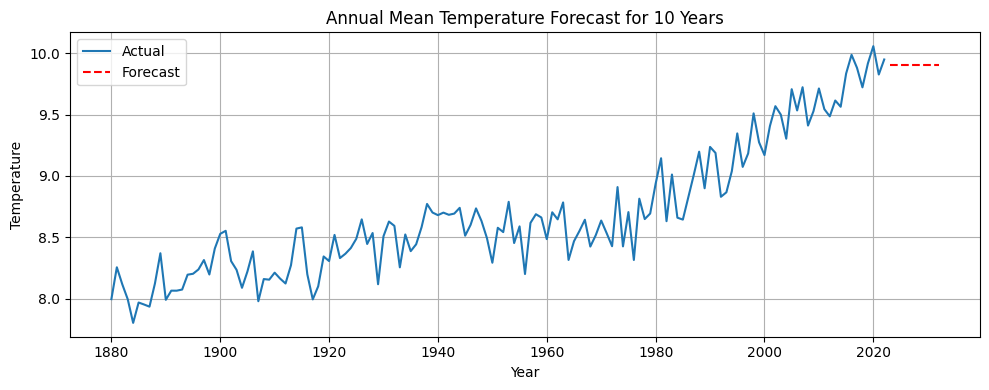

In [16]:
#This model is for 0,1,1 order
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from pmdarima import auto_arima
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error

# === Step 1: Prepare Data ===
# Load dataset
df = pd.read_csv(r"C:\Users\ratne\Reserch Project_Global_Temp\global temperature.csv")

# Convert to datetime and set as index
df['Date'] = pd.to_datetime(df[['Year', 'Month', 'Day']])
df.set_index('Date', inplace=True)

# Retain only needed columns
df = df[['Temperature', 'Anomaly']]

# Add 'Year' column for aggregation
df['Year'] = df.index.year

# === Step 2: Aggregate to Annual Min, Max, Mean ===
# Aggregate temperature statistics per year
annual_stats = df.groupby('Year').agg({'Temperature': ['min', 'max', 'mean']}).reset_index()
annual_stats.columns = ['Year', 'MinTemp', 'MaxTemp', 'MeanTemp']

# Display summary
print("Annual Temperature Summary:")
print(annual_stats.head())

# Create directory to save plots
output_dir = r"C:\Users\ratne\Reserch Project_Global_Temp\plots"
os.makedirs(output_dir, exist_ok=True)

# === Step 3: ADF Test for Stationarity ===
def adf_test(series, title=""):
    result = adfuller(series.dropna())
    print(f"\nADF Test - {title}")
    print(f"ADF Statistic: {result[0]:.4f}")
    print(f"p-value: {result[1]:.4f}")
    if result[1] > 0.05:
        print("=> Non-stationary (p > 0.05)")
    else:
        print("=> Stationary (p <= 0.05)")

# === Step 4: Forecasting Function ===
def model_forecast(series, title, forecast_years=10):
    print(f"\n=== {title} ===")

    # Convert index to PeriodIndex for proper forecasting
    series.index = pd.PeriodIndex(series.index, freq='Y')

    # Plot time series
    plt.figure(figsize=(10, 4))
    plt.plot(series.index.to_timestamp(), series.values, label='Actual')
    plt.title(f'{title} Over Years')
    plt.xlabel('Year')
    plt.ylabel('Temperature')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"{title.replace(' ', '_')}_timeseries.png"))
    plt.show()

    # ADF Test
    adf_test(series, title)

    # Differencing
    series_diff = series.diff().dropna()

    # ACF and PACF
    fig, axes = plt.subplots(1, 2, figsize=(14, 4))
    plot_acf(series_diff, ax=axes[0])
    plot_pacf(series_diff, ax=axes[1])
    fig.suptitle(f'{title} - ACF & PACF')
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"{title.replace(' ', '_')}_ACF_PACF.png"))
    plt.show()

    # Fit Auto ARIMA
    auto_model = auto_arima(series, seasonal=False, trace=True,
                            error_action='ignore', suppress_warnings=True,
                            stepwise=True)
    print(f"Selected ARIMA Order: {auto_model.order}")

    # Fit ARIMA model
    model = ARIMA(series, order=auto_model.order)
    model_fit = model.fit()
    print(model_fit.summary())

    # Forecast
    forecast = model_fit.forecast(steps=forecast_years)

    # Create forecast index
    forecast_index = pd.period_range(start=series.index[-1] + 1, periods=forecast_years, freq='Y')

    # Plot forecast
    plt.figure(figsize=(10, 4))
    plt.plot(series.index.to_timestamp(), series.values, label='Actual')
    plt.plot(forecast_index.to_timestamp(), forecast, label='Forecast', linestyle='--', color='red')
    plt.title(f'{title} Forecast for {forecast_years} Years')
    plt.xlabel('Year')
    plt.ylabel('Temperature')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"{title.replace(' ', '_')}_forecast.png"))
    plt.show()

    return forecast

# === Step 5: Apply Forecasting to Min, Max, and Mean Temperatures ===
min_forecast = model_forecast(annual_stats.set_index('Year')['MinTemp'], "Annual Minimum Temperature")
max_forecast = model_forecast(annual_stats.set_index('Year')['MaxTemp'], "Annual Maximum Temperature")
mean_forecast = model_forecast(annual_stats.set_index('Year')['MeanTemp'], "Annual Mean Temperature")





Annual Temperature Summary:
   Year  MinTemp  MaxTemp  MeanTemp
0  1880    6.945    8.666  7.995557
1  1881    7.213    9.006  8.255378
2  1882    6.720    9.325  8.116529
3  1883    6.852    8.735  7.995145
4  1884    7.001    8.786  7.801880

=== Annual Minimum Temperature ===


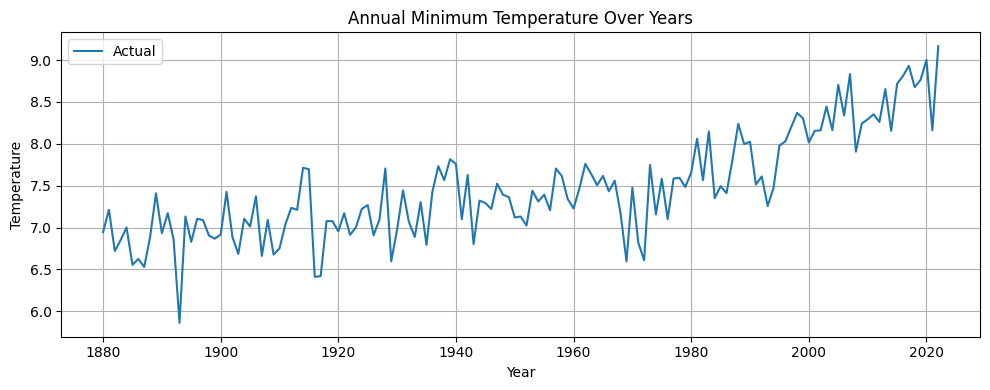


ADF Test - Annual Minimum Temperature
ADF Statistic: 0.1330
p-value: 0.9682
=> Non-stationary (p > 0.05)


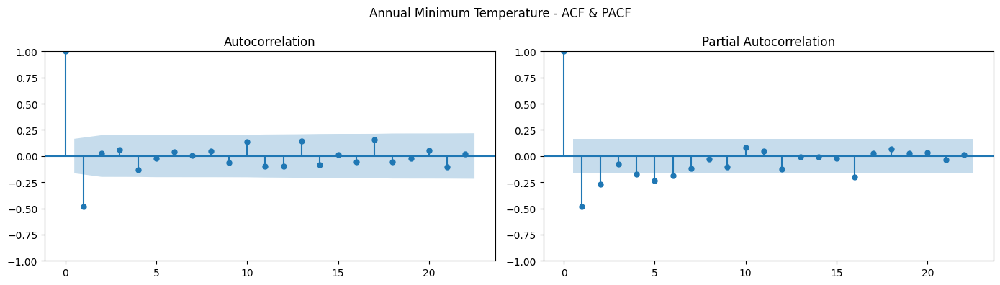

Fitting manual ARIMA(2,1,2) model...
                               SARIMAX Results                                
Dep. Variable:                MinTemp   No. Observations:                  143
Model:                 ARIMA(2, 1, 2)   Log Likelihood                 -49.391
Date:                Thu, 08 May 2025   AIC                            108.783
Time:                        11:52:22   BIC                            123.562
Sample:                    12-31-1880   HQIC                           114.789
                         - 12-31-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1198      1.496      0.080      0.936      -2.812       3.052
ar.L2          0.0839      0.130      0.647      0.518      -0.170       0.338
ma.L1         -

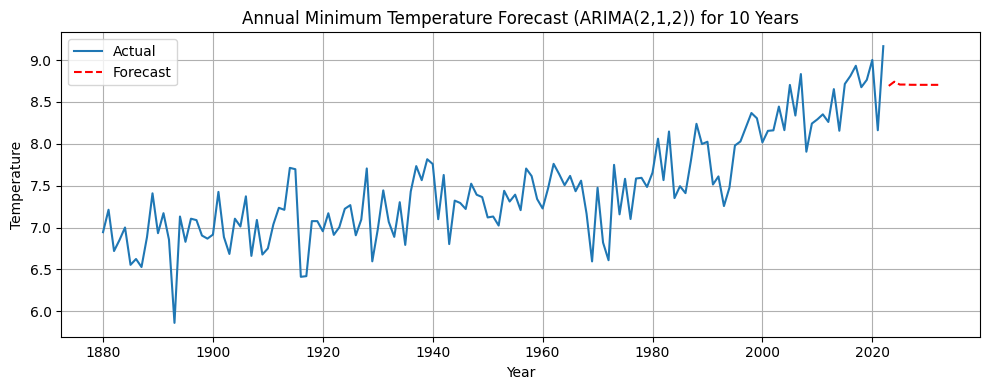


=== Annual Maximum Temperature ===


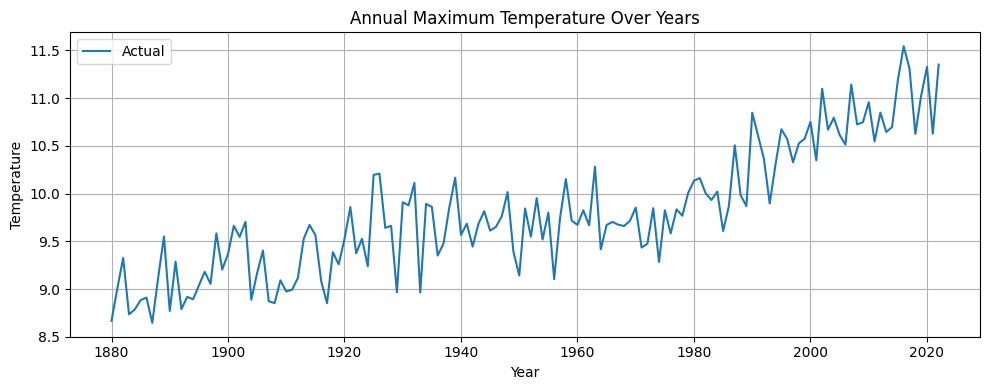


ADF Test - Annual Maximum Temperature
ADF Statistic: 0.8198
p-value: 0.9919
=> Non-stationary (p > 0.05)


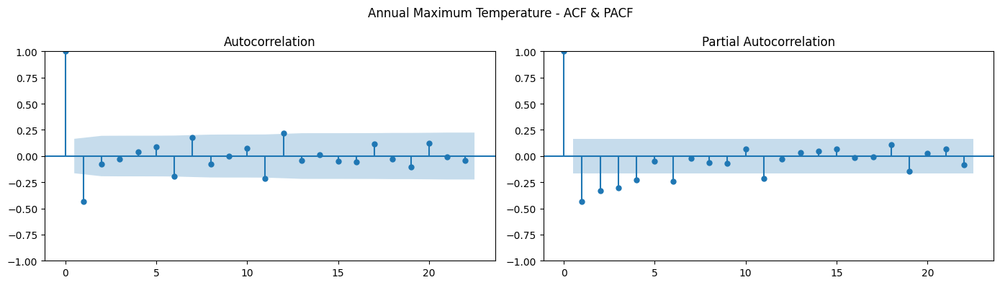

Fitting manual ARIMA(2,1,2) model...
                               SARIMAX Results                                
Dep. Variable:                MaxTemp   No. Observations:                  143
Model:                 ARIMA(2, 1, 2)   Log Likelihood                 -39.942
Date:                Thu, 08 May 2025   AIC                             89.883
Time:                        11:52:25   BIC                            104.662
Sample:                    12-31-1880   HQIC                            95.889
                         - 12-31-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9292      0.235     -3.956      0.000      -1.390      -0.469
ar.L2         -0.0339      0.125     -0.270      0.787      -0.279       0.211
ma.L1          

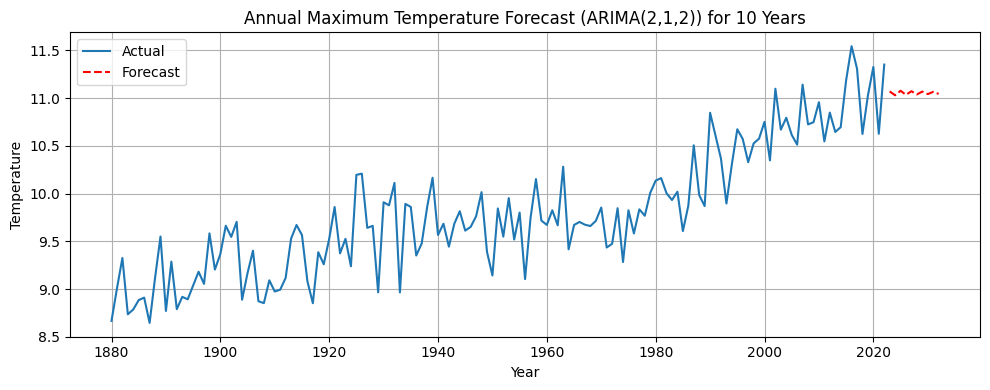


=== Annual Mean Temperature ===


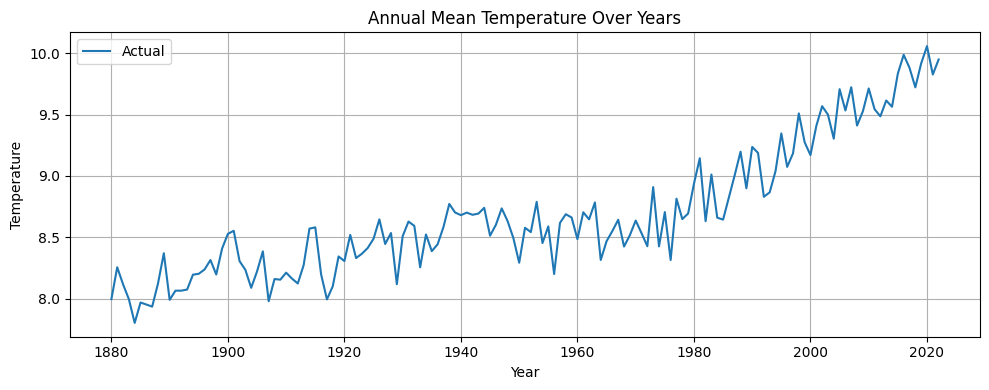


ADF Test - Annual Mean Temperature
ADF Statistic: 1.7800
p-value: 0.9983
=> Non-stationary (p > 0.05)


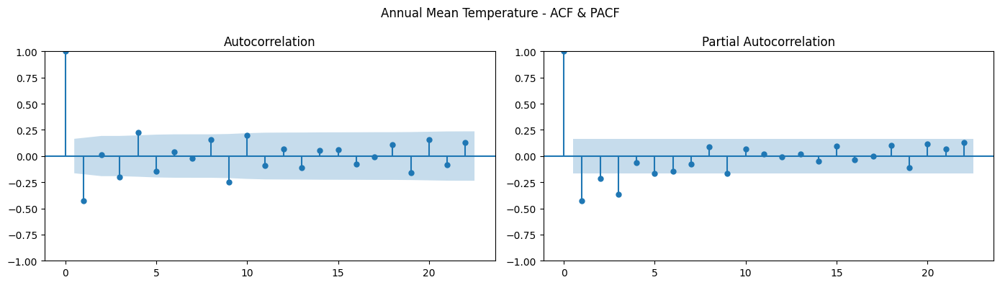

Fitting manual ARIMA(2,1,2) model...
                               SARIMAX Results                                
Dep. Variable:               MeanTemp   No. Observations:                  143
Model:                 ARIMA(2, 1, 2)   Log Likelihood                  43.450
Date:                Thu, 08 May 2025   AIC                            -76.900
Time:                        11:52:28   BIC                            -62.121
Sample:                    12-31-1880   HQIC                           -70.895
                         - 12-31-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7845      0.182     -4.315      0.000      -1.141      -0.428
ar.L2          0.1572      0.142      1.108      0.268      -0.121       0.435
ma.L1          

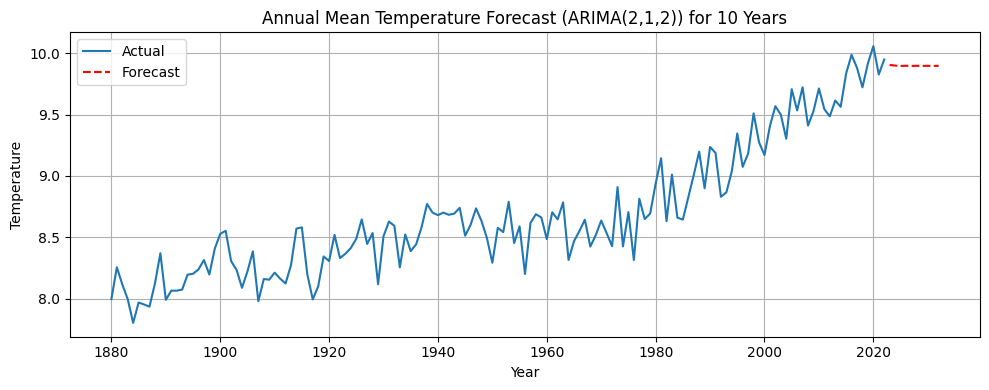

In [15]:
#=== Import Libraries ===  this model is for 2,1,2 order
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from pmdarima import auto_arima
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error

# === Step 1: Prepare Data ===
# Load dataset
df = pd.read_csv(r"C:\Users\ratne\Reserch Project_Global_Temp\global temperature.csv")

# Convert to datetime and set as index
df['Date'] = pd.to_datetime(df[['Year', 'Month', 'Day']])
df.set_index('Date', inplace=True)

# Retain only needed columns
df = df[['Temperature', 'Anomaly']]

# Add 'Year' column for aggregation
df['Year'] = df.index.year

# === Step 2: Aggregate to Annual Min, Max, Mean ===
# Aggregate temperature statistics per year
annual_stats = df.groupby('Year').agg({'Temperature': ['min', 'max', 'mean']}).reset_index()
annual_stats.columns = ['Year', 'MinTemp', 'MaxTemp', 'MeanTemp']

# Display summary
print("Annual Temperature Summary:")
print(annual_stats.head())

# Create directory to save plots
output_dir = r"C:\Users\ratne\Reserch Project_Global_Temp\plots"
os.makedirs(output_dir, exist_ok=True)

# === Step 3: ADF Test for Stationarity ===
def adf_test(series, title=""):
    result = adfuller(series.dropna())
    print(f"\nADF Test - {title}")
    print(f"ADF Statistic: {result[0]:.4f}")
    print(f"p-value: {result[1]:.4f}")
    if result[1] > 0.05:
        print("=> Non-stationary (p > 0.05)")
    else:
        print("=> Stationary (p <= 0.05)")

# === Step 4: Forecasting Function ===
def model_forecast(series, title, forecast_years=10):
    print(f"\n=== {title} ===")

    # Convert index to PeriodIndex for proper forecasting
    series.index = pd.PeriodIndex(series.index, freq='Y')

    # Plot time series
    plt.figure(figsize=(10, 4))
    plt.plot(series.index.to_timestamp(), series.values, label='Actual')
    plt.title(f'{title} Over Years')
    plt.xlabel('Year')
    plt.ylabel('Temperature')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"{title.replace(' ', '_')}_timeseries.png"))
    plt.show()

    # ADF Test
    adf_test(series, title)

    # Differencing for plotting ACF and PACF
    series_diff = series.diff().dropna()

    # ACF and PACF plots
    fig, axes = plt.subplots(1, 2, figsize=(14, 4))
    plot_acf(series_diff, ax=axes[0])
    plot_pacf(series_diff, ax=axes[1])
    fig.suptitle(f'{title} - ACF & PACF')
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"{title.replace(' ', '_')}_ACF_PACF.png"))
    plt.show()

    # === With manual model (2,1,2) ===
    print("Fitting manual ARIMA(2,1,2) model...")
    model = ARIMA(series, order=(2, 1, 2))
    model_fit = model.fit()
    print(model_fit.summary())

    # Forecast
    forecast = model_fit.forecast(steps=forecast_years)

    # Create forecast index
    forecast_index = pd.period_range(start=series.index[-1] + 1, periods=forecast_years, freq='Y')

    # Plot forecast
    plt.figure(figsize=(10, 4))
    plt.plot(series.index.to_timestamp(), series.values, label='Actual')
    plt.plot(forecast_index.to_timestamp(), forecast, label='Forecast', linestyle='--', color='red')
    plt.title(f'{title} Forecast (ARIMA(2,1,2)) for {forecast_years} Years')
    plt.xlabel('Year')
    plt.ylabel('Temperature')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"{title.replace(' ', '_')}_forecast_ARIMA212.png"))
    plt.show()

    return forecast

# === Step 5: Apply Forecasting to Min, Max, and Mean Temperatures ===
min_forecast = model_forecast(annual_stats.set_index('Year')['MinTemp'], "Annual Minimum Temperature")
max_forecast = model_forecast(annual_stats.set_index('Year')['MaxTemp'], "Annual Maximum Temperature")
mean_forecast = model_forecast(annual_stats.set_index('Year')['MeanTemp'], "Annual Mean Temperature")





Annual Temperature Summary:
   Year  MinTemp  MaxTemp  MeanTemp
0  1880    6.945    8.666  7.995557
1  1881    7.213    9.006  8.255378
2  1882    6.720    9.325  8.116529
3  1883    6.852    8.735  7.995145
4  1884    7.001    8.786  7.801880

=== Annual Minimum Temperature ===


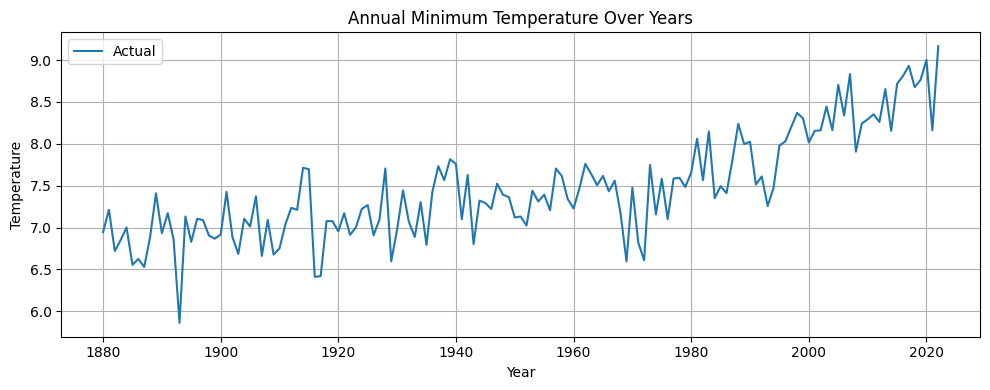


ADF Test - Annual Minimum Temperature
ADF Statistic: 0.1330
p-value: 0.9682
=> Non-stationary (p > 0.05)


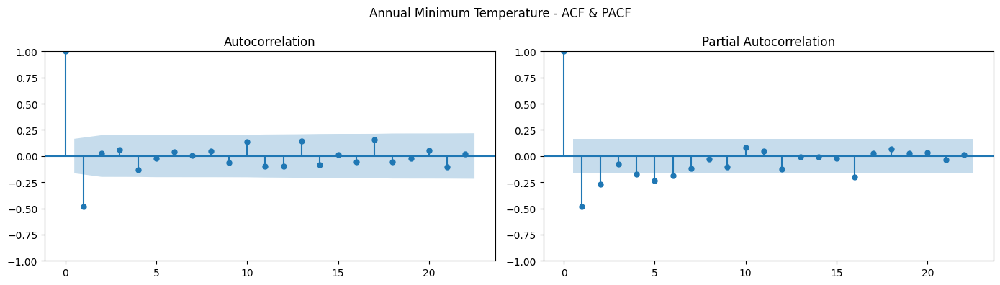

Fitting manual ARIMA(2,1,2) model...
                               SARIMAX Results                                
Dep. Variable:                MinTemp   No. Observations:                  143
Model:                 ARIMA(2, 1, 2)   Log Likelihood                 -49.391
Date:                Thu, 08 May 2025   AIC                            108.783
Time:                        12:07:05   BIC                            123.562
Sample:                    12-31-1880   HQIC                           114.789
                         - 12-31-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1198      1.496      0.080      0.936      -2.812       3.052
ar.L2          0.0839      0.130      0.647      0.518      -0.170       0.338
ma.L1         -

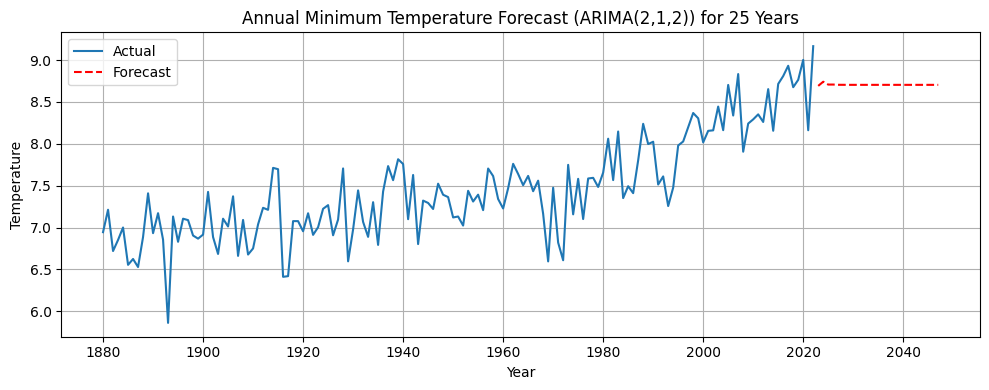


=== Annual Maximum Temperature ===


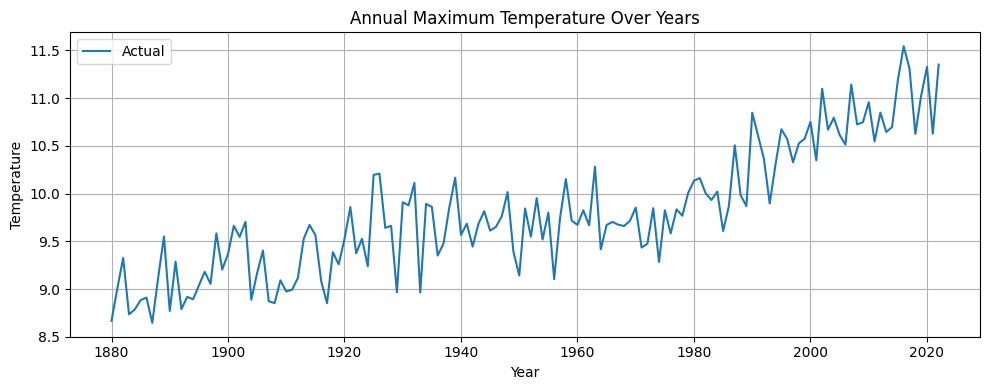


ADF Test - Annual Maximum Temperature
ADF Statistic: 0.8198
p-value: 0.9919
=> Non-stationary (p > 0.05)


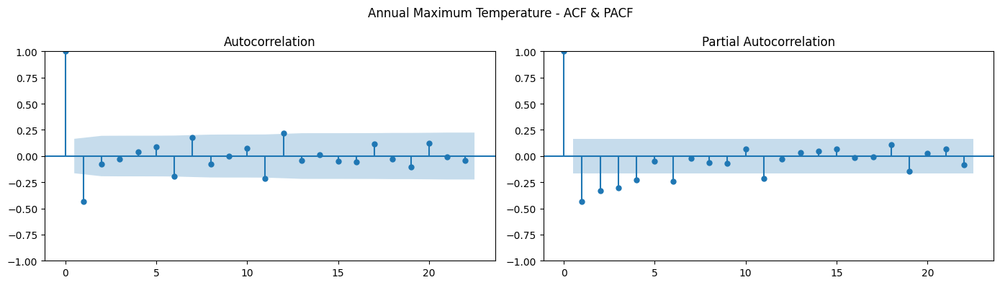

Fitting manual ARIMA(2,1,2) model...
                               SARIMAX Results                                
Dep. Variable:                MaxTemp   No. Observations:                  143
Model:                 ARIMA(2, 1, 2)   Log Likelihood                 -39.942
Date:                Thu, 08 May 2025   AIC                             89.883
Time:                        12:07:08   BIC                            104.662
Sample:                    12-31-1880   HQIC                            95.889
                         - 12-31-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9292      0.235     -3.956      0.000      -1.390      -0.469
ar.L2         -0.0339      0.125     -0.270      0.787      -0.279       0.211
ma.L1          

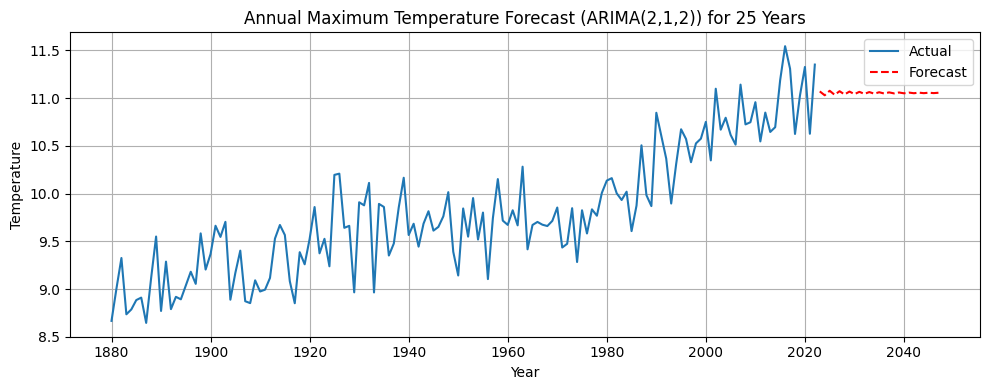


=== Annual Mean Temperature ===


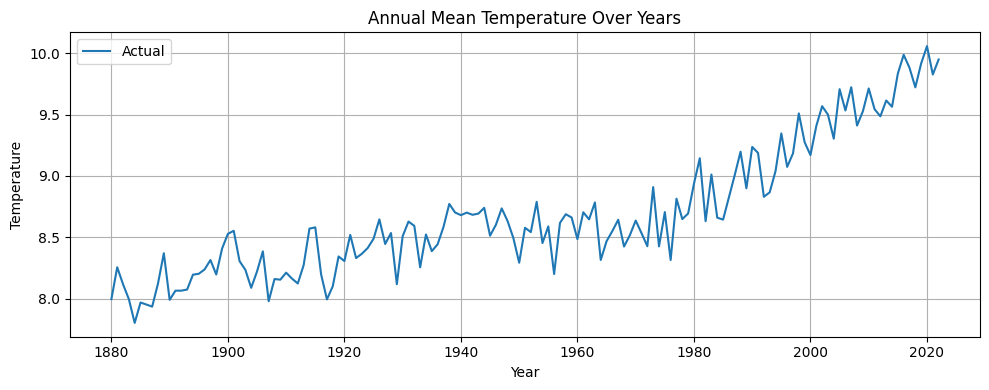


ADF Test - Annual Mean Temperature
ADF Statistic: 1.7800
p-value: 0.9983
=> Non-stationary (p > 0.05)


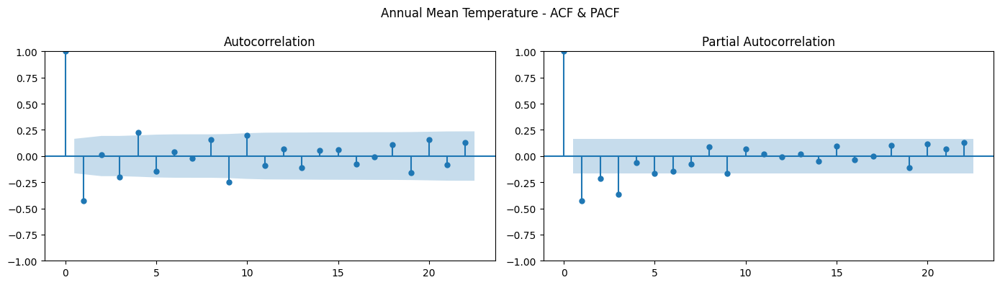

Fitting manual ARIMA(2,1,2) model...
                               SARIMAX Results                                
Dep. Variable:               MeanTemp   No. Observations:                  143
Model:                 ARIMA(2, 1, 2)   Log Likelihood                  43.450
Date:                Thu, 08 May 2025   AIC                            -76.900
Time:                        12:07:11   BIC                            -62.121
Sample:                    12-31-1880   HQIC                           -70.895
                         - 12-31-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7845      0.182     -4.315      0.000      -1.141      -0.428
ar.L2          0.1572      0.142      1.108      0.268      -0.121       0.435
ma.L1          

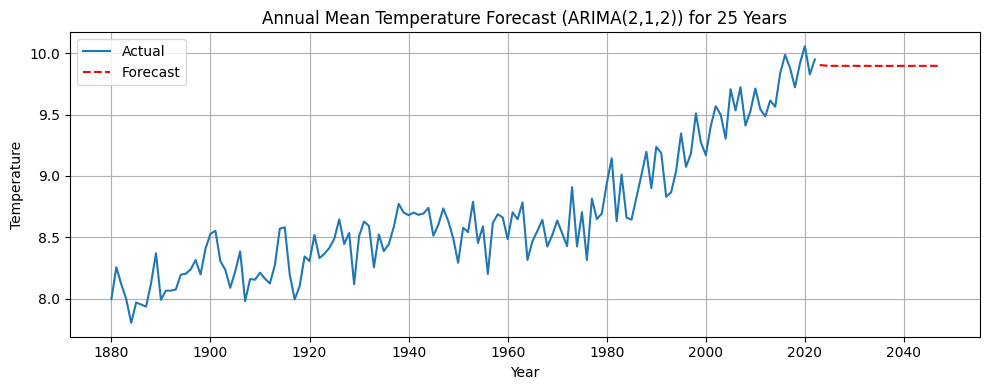

In [17]:
#=== Import Libraries === forecasting for next 25 years 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error

# === Step 1: Prepare Data ===
# Load dataset
df = pd.read_csv(r"C:\Users\ratne\Reserch Project_Global_Temp\global temperature.csv")

# Convert to datetime and set as index
df['Date'] = pd.to_datetime(df[['Year', 'Month', 'Day']])
df.set_index('Date', inplace=True)

# Retain only needed columns
df = df[['Temperature', 'Anomaly']]

# Add 'Year' column for aggregation
df['Year'] = df.index.year

# === Step 2: Aggregate to Annual Min, Max, Mean ===
# Aggregate temperature statistics per year
annual_stats = df.groupby('Year').agg({'Temperature': ['min', 'max', 'mean']}).reset_index()
annual_stats.columns = ['Year', 'MinTemp', 'MaxTemp', 'MeanTemp']

# Display summary
print("Annual Temperature Summary:")
print(annual_stats.head())

# Create directory to save plots
output_dir = r"C:\Users\ratne\Reserch Project_Global_Temp\plots"
os.makedirs(output_dir, exist_ok=True)

# === Step 3: ADF Test for Stationarity ===
def adf_test(series, title=""):
    result = adfuller(series.dropna())
    print(f"\nADF Test - {title}")
    print(f"ADF Statistic: {result[0]:.4f}")
    print(f"p-value: {result[1]:.4f}")
    if result[1] > 0.05:
        print("=> Non-stationary (p > 0.05)")
    else:
        print("=> Stationary (p <= 0.05)")

# === Step 4: Forecasting Function ===
def model_forecast(series, title, forecast_years=25):  # Change forecast_years to 25
    print(f"\n=== {title} ===")

    # Convert index to PeriodIndex for proper forecasting
    series.index = pd.PeriodIndex(series.index, freq='Y')

    # Plot time series
    plt.figure(figsize=(10, 4))
    plt.plot(series.index.to_timestamp(), series.values, label='Actual')
    plt.title(f'{title} Over Years')
    plt.xlabel('Year')
    plt.ylabel('Temperature')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"{title.replace(' ', '_')}_timeseries.png"))
    plt.show()

    # ADF Test
    adf_test(series, title)

    # Differencing for plotting ACF and PACF
    series_diff = series.diff().dropna()

    # ACF and PACF plots
    fig, axes = plt.subplots(1, 2, figsize=(14, 4))
    plot_acf(series_diff, ax=axes[0])
    plot_pacf(series_diff, ax=axes[1])
    fig.suptitle(f'{title} - ACF & PACF')
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"{title.replace(' ', '_')}_ACF_PACF.png"))
    plt.show()

    # === With manual model (2,1,2) ===
    print("Fitting manual ARIMA(2,1,2) model...")
    model = ARIMA(series, order=(2, 1, 2))
    model_fit = model.fit()
    print(model_fit.summary())

    # Forecast
    forecast = model_fit.forecast(steps=forecast_years)

    # Create forecast index
    forecast_index = pd.period_range(start=series.index[-1] + 1, periods=forecast_years, freq='Y')

    # Plot forecast
    plt.figure(figsize=(10, 4))
    plt.plot(series.index.to_timestamp(), series.values, label='Actual')
    plt.plot(forecast_index.to_timestamp(), forecast, label='Forecast', linestyle='--', color='red')
    plt.title(f'{title} Forecast (ARIMA(2,1,2)) for {forecast_years} Years')
    plt.xlabel('Year')
    plt.ylabel('Temperature')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"{title.replace(' ', '_')}_forecast_ARIMA212.png"))
    plt.show()

    return forecast

# === Step 5: Apply Forecasting to Min, Max, and Mean Temperatures ===
min_forecast = model_forecast(annual_stats.set_index('Year')['MinTemp'], "Annual Minimum Temperature", forecast_years=25)
max_forecast = model_forecast(annual_stats.set_index('Year')['MaxTemp'], "Annual Maximum Temperature", forecast_years=25)
mean_forecast = model_forecast(annual_stats.set_index('Year')['MeanTemp'], "Annual Mean Temperature", forecast_years=25)


Annual Temperature Summary:
   Year  MinTemp  MaxTemp  MeanTemp
0  1880    6.945    8.666  7.995557
1  1881    7.213    9.006  8.255378
2  1882    6.720    9.325  8.116529
3  1883    6.852    8.735  7.995145
4  1884    7.001    8.786  7.801880

=== Annual Minimum Temperature ===


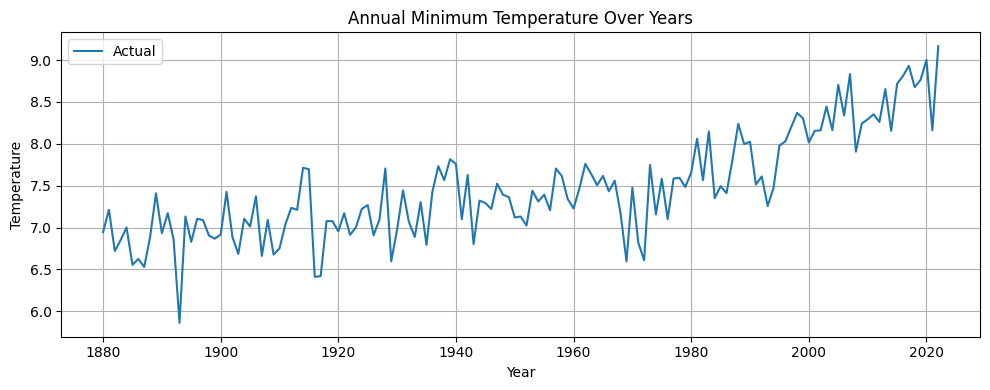


ADF Test - Annual Minimum Temperature
ADF Statistic: 0.1330
p-value: 0.9682
=> Non-stationary (p > 0.05)


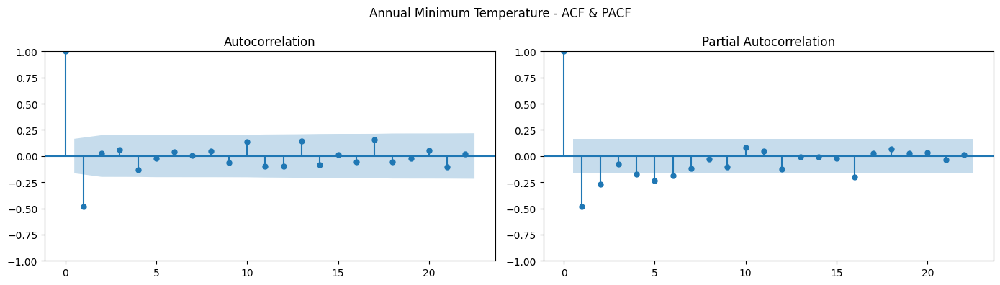

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=983.590, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=805.887, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=112.686, Time=0.21 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=114.497, Time=0.40 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=114.527, Time=0.30 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=666.412, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.18 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=inf, Time=0.50 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=109.937, Time=0.31 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=214.436, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=152.583, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=111.947, Time=0.48 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=111.796, Time=0.54 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=270.570, Time=0.0

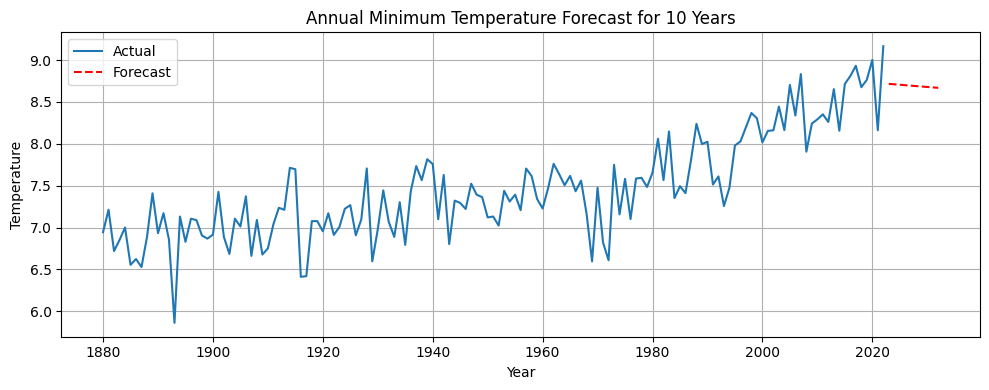


=== Annual Maximum Temperature ===


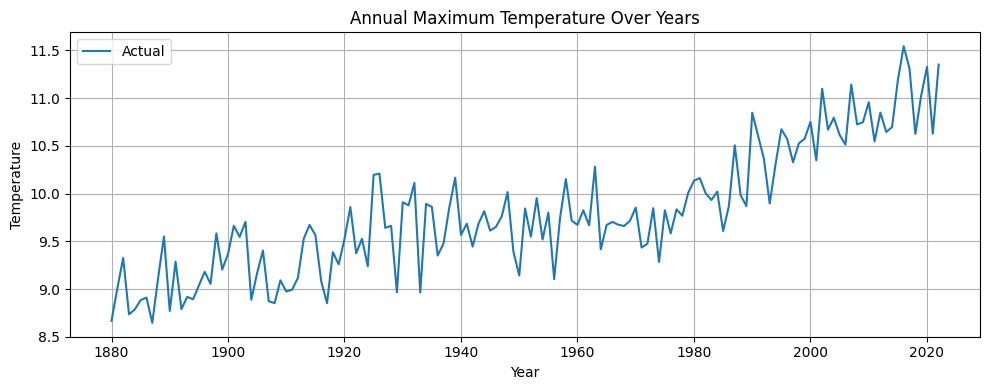


ADF Test - Annual Maximum Temperature
ADF Statistic: 0.8198
p-value: 0.9919
=> Non-stationary (p > 0.05)


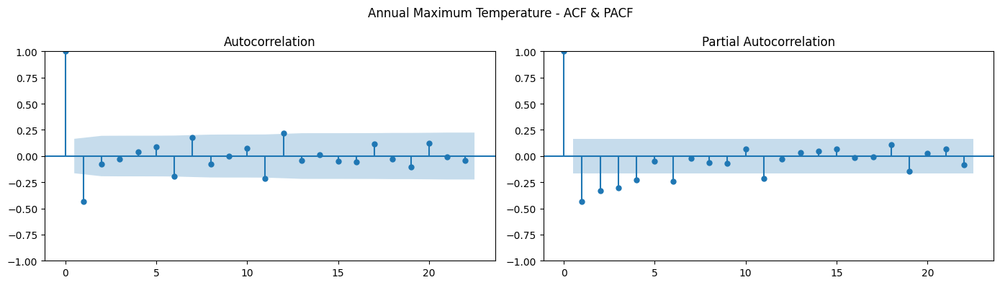

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1061.184, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=876.182, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=93.856, Time=0.33 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=95.852, Time=0.33 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=95.851, Time=0.31 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=738.570, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.29 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=inf, Time=0.48 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=91.219, Time=0.44 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=219.650, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=142.328, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=93.475, Time=0.47 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=93.148, Time=0.46 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=290.275, Time=0.05 sec

C:\Users\ratne\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


                               SARIMAX Results                                
Dep. Variable:                MaxTemp   No. Observations:                  143
Model:                 ARIMA(1, 0, 1)   Log Likelihood                 -41.533
Date:                Thu, 08 May 2025   AIC                             91.065
Time:                        14:06:07   BIC                            102.917
Sample:                    12-31-1880   HQIC                            95.881
                         - 12-31-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          9.9487      1.080      9.209      0.000       7.831      12.066
ar.L1          0.9968      0.010     99.624      0.000       0.977       1.016
ma.L1         -0.7640      0.059    -12.917      0.0

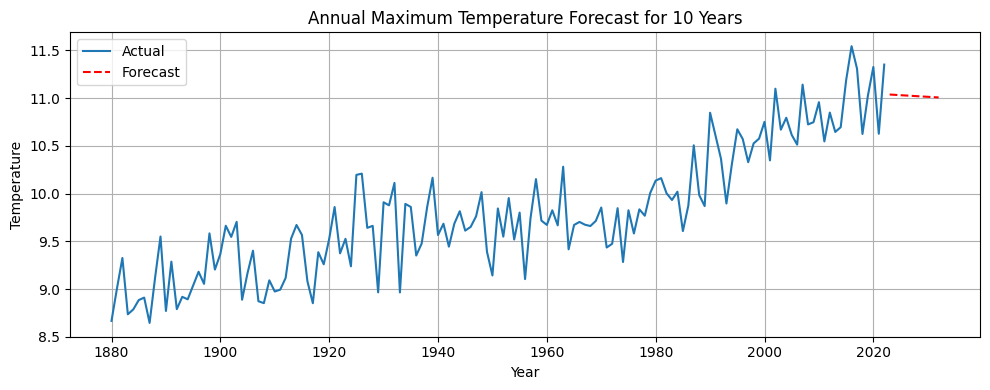


=== Annual Mean Temperature ===


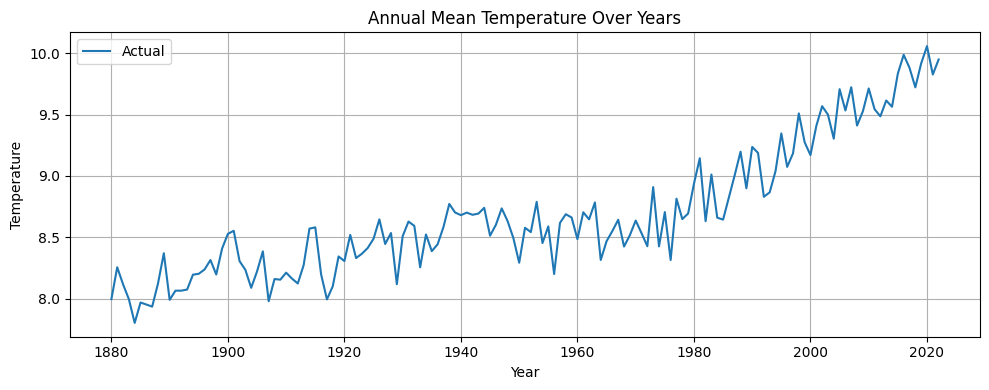


ADF Test - Annual Mean Temperature
ADF Statistic: 1.7800
p-value: 0.9983
=> Non-stationary (p > 0.05)


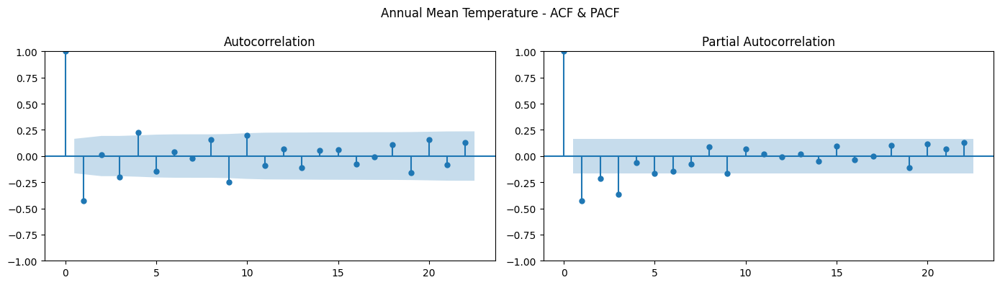

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1026.799, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=844.081, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-68.902, Time=0.33 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=-67.128, Time=0.44 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=-67.136, Time=0.72 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=inf, Time=0.33 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.24 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=-67.620, Time=0.45 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=-71.758, Time=0.46 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=130.306, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=-32.156, Time=0.19 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=-69.958, Time=0.56 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=-66.852, Time=0.60 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=227.462, Time=0.

C:\Users\ratne\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


                               SARIMAX Results                                
Dep. Variable:               MeanTemp   No. Observations:                  143
Model:                 ARIMA(1, 0, 1)   Log Likelihood                  39.879
Date:                Thu, 08 May 2025   AIC                            -71.758
Time:                        14:06:15   BIC                            -59.907
Sample:                    12-31-1880   HQIC                           -66.943
                         - 12-31-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          8.9326      0.836     10.679      0.000       7.293      10.572
ar.L1          0.9970      0.010     95.019      0.000       0.976       1.018
ma.L1         -0.6459      0.070     -9.278      0.0

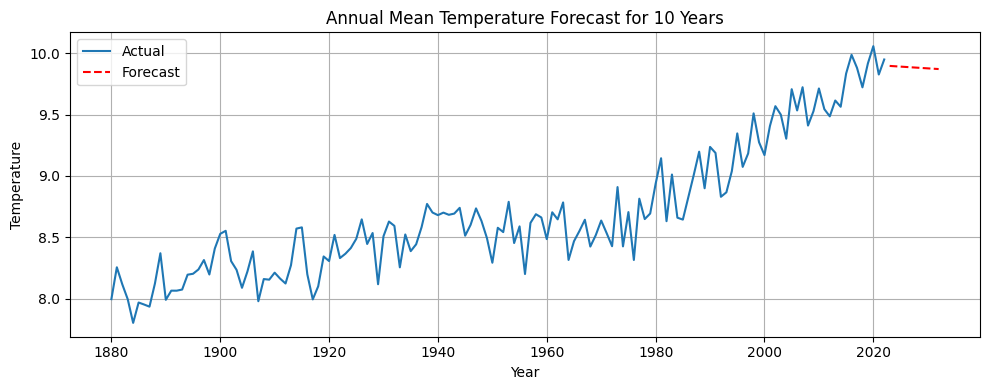

In [1]:
#=== Import Libraries ===  this model is for (0,d=0 or 2 ,1)  order 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from pmdarima import auto_arima
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error

# === Step 1: Prepare Data ===
# Load dataset
df = pd.read_csv(r"C:\Users\ratne\Reserch Project_Global_Temp\global temperature.csv")

# Convert to datetime and set as index
df['Date'] = pd.to_datetime(df[['Year', 'Month', 'Day']])
df.set_index('Date', inplace=True)

# Retain only needed columns
df = df[['Temperature', 'Anomaly']]

# Add 'Year' column for aggregation
df['Year'] = df.index.year

# === Step 2: Aggregate to Annual Min, Max, Mean ===
# Aggregate temperature statistics per year
annual_stats = df.groupby('Year').agg({'Temperature': ['min', 'max', 'mean']}).reset_index()
annual_stats.columns = ['Year', 'MinTemp', 'MaxTemp', 'MeanTemp']

# Display summary
print("Annual Temperature Summary:")
print(annual_stats.head())

# Create directory to save plots
output_dir = r"C:\Users\ratne\Reserch Project_Global_Temp\plots"
os.makedirs(output_dir, exist_ok=True)

# === Step 3: ADF Test for Stationarity ===
def adf_test(series, title=""):
    result = adfuller(series.dropna())
    print(f"\nADF Test - {title}")
    print(f"ADF Statistic: {result[0]:.4f}")
    print(f"p-value: {result[1]:.4f}")
    if result[1] > 0.05:
        print("=> Non-stationary (p > 0.05)")
    else:
        print("=> Stationary (p <= 0.05)")

# === Step 4: Forecasting Function ===
def model_forecast(series, title, forecast_years=10):
    print(f"\n=== {title} ===")

    # Convert index to PeriodIndex for proper forecasting
    series.index = pd.PeriodIndex(series.index, freq='Y')

    # Plot time series
    plt.figure(figsize=(10, 4))
    plt.plot(series.index.to_timestamp(), series.values, label='Actual')
    plt.title(f'{title} Over Years')
    plt.xlabel('Year')
    plt.ylabel('Temperature')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"{title.replace(' ', '_')}_timeseries.png"))
    plt.show()

    # ADF Test
    adf_test(series, title)

    # Differencing
    series_diff = series.diff().dropna()

    # ACF and PACF
    fig, axes = plt.subplots(1, 2, figsize=(14, 4))
    plot_acf(series_diff, ax=axes[0])
    plot_pacf(series_diff, ax=axes[1])
    fig.suptitle(f'{title} - ACF & PACF')
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"{title.replace(' ', '_')}_ACF_PACF.png"))
    plt.show()

    # Fit Auto ARIMA with flexible differencing
    # Fit Auto ARIMA with d=0 to preserve trend
    auto_model = auto_arima(series,
                            start_p=0, start_q=0,
                            max_p=5, max_q=5,
                            d=0,  # Force no differencing
                            seasonal=False,
                            trace=True,
                            error_action='ignore',
                            suppress_warnings=True,
                            stepwise=True)

    print(f"Selected ARIMA Order: {auto_model.order}")


    # Fit ARIMA model
    model = ARIMA(series, order=auto_model.order)
    model_fit = model.fit()
    print(model_fit.summary())

    # Forecast
    forecast = model_fit.forecast(steps=forecast_years)

    # Create forecast index
    forecast_index = pd.period_range(start=series.index[-1] + 1, periods=forecast_years, freq='Y')

    # Plot forecast
    plt.figure(figsize=(10, 4))
    plt.plot(series.index.to_timestamp(), series.values, label='Actual')
    plt.plot(forecast_index.to_timestamp(), forecast, label='Forecast', linestyle='--', color='red')
    plt.title(f'{title} Forecast for {forecast_years} Years')
    plt.xlabel('Year')
    plt.ylabel('Temperature')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"{title.replace(' ', '_')}_forecast.png"))
    plt.show()

    return forecast


# === Step 5: Apply Forecasting to Min, Max, and Mean Temperatures ===
min_forecast = model_forecast(annual_stats.set_index('Year')['MinTemp'], "Annual Minimum Temperature")
max_forecast = model_forecast(annual_stats.set_index('Year')['MaxTemp'], "Annual Maximum Temperature")
mean_forecast = model_forecast(annual_stats.set_index('Year')['MeanTemp'], "Annual Mean Temperature")




In [2]:
# checkin for best suitable values of d 

import pandas as pd
from statsmodels.tsa.stattools import adfuller

# Sample input: replace this with your actual data
# Example using your annual mean temperature series
series = annual_stats.set_index('Year')['MeanTemp']

def determine_best_d(series, max_d=2):
    """
    Finds the smallest value of d (0 to max_d) that makes the series stationary using the ADF test.
    """
    print("Determining optimal differencing (d) to achieve stationarity...\n")
    
    for d in range(max_d + 1):
        if d == 0:
            test_series = series.dropna()
        else:
            test_series = series.diff(d).dropna()
        
        if len(test_series) < 10:
            print(f"d = {d} | Not enough data after differencing.")
            continue

        result = adfuller(test_series)
        p_value = result[1]
        
        print(f"d = {d} | ADF Statistic = {result[0]:.4f} | p-value = {p_value:.4f}")
        
        if p_value <= 0.05:
            print(f"\n✅ Best d value: {d} (Stationary at p ≤ 0.05)")
            return d
    
    print("\n❌ No value of d in range 0 to", max_d, "makes the series stationary (p > 0.05). Consider higher d or transformations.")
    return None

# Run the test
best_d = determine_best_d(series)


Determining optimal differencing (d) to achieve stationarity...

d = 0 | ADF Statistic = 1.7800 | p-value = 0.9983
d = 1 | ADF Statistic = -12.2986 | p-value = 0.0000

✅ Best d value: 1 (Stationary at p ≤ 0.05)


Annual Temperature Summary:
   Year  MinTemp  MaxTemp  MeanTemp
0  1880    6.945    8.666  7.995557
1  1881    7.213    9.006  8.255378
2  1882    6.720    9.325  8.116529
3  1883    6.852    8.735  7.995145
4  1884    7.001    8.786  7.801880

=== Annual Minimum Temperature ===


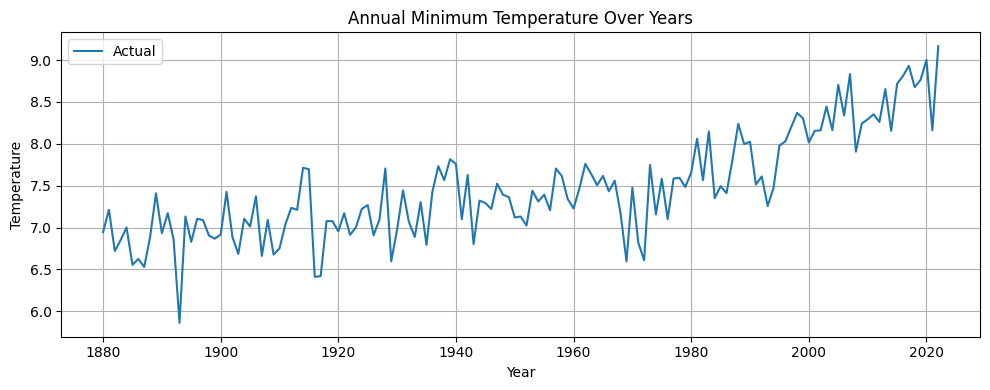


ADF Test - Annual Minimum Temperature
ADF Statistic: 0.1330
p-value: 0.9682
=> Non-stationary (p > 0.05)


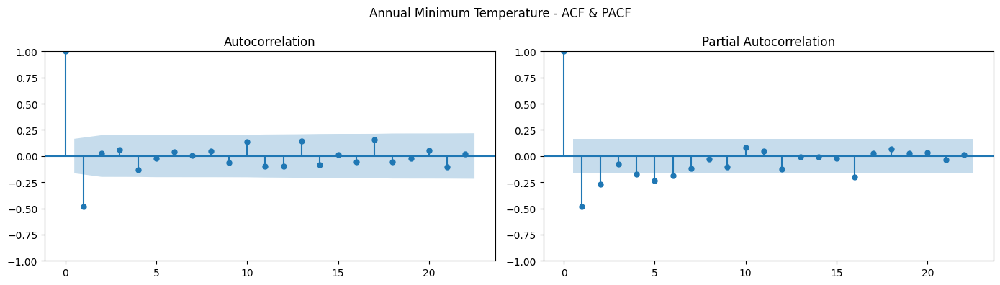

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=104.716, Time=1.52 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=163.981, Time=0.08 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=126.167, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=100.048, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=162.173, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=100.377, Time=0.11 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=99.552, Time=0.75 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=99.135, Time=0.35 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=96.519, Time=0.93 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=97.468, Time=1.89 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=165.628, Time=0.38 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=98.486, Time=1.29 sec
 ARIMA(0,1,2)(2,0,0)[12] intercept   : AIC=98.490, Time=1.40 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=126.693, Time=0.67 sec
 ARIMA(1,1,2)(2,0,0)[12] intercept   : 

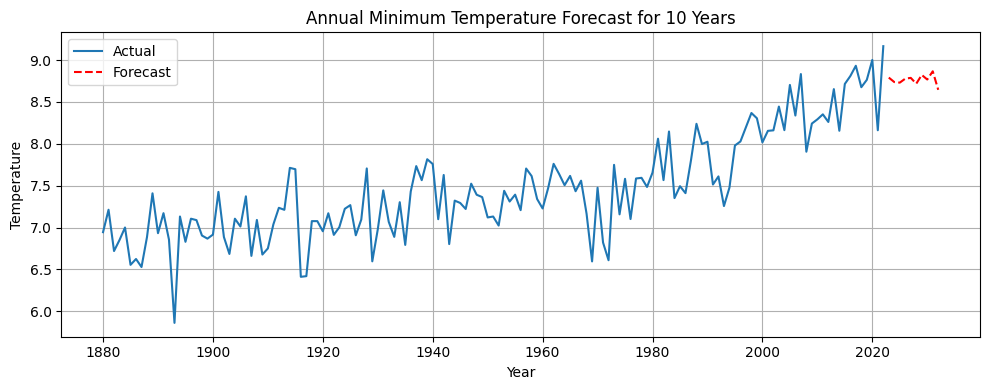


=== Annual Maximum Temperature ===


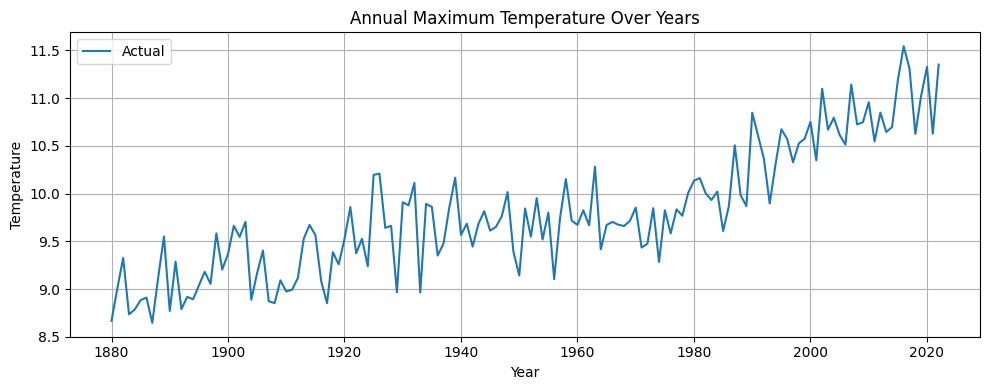


ADF Test - Annual Maximum Temperature
ADF Statistic: 0.8198
p-value: 0.9919
=> Non-stationary (p > 0.05)


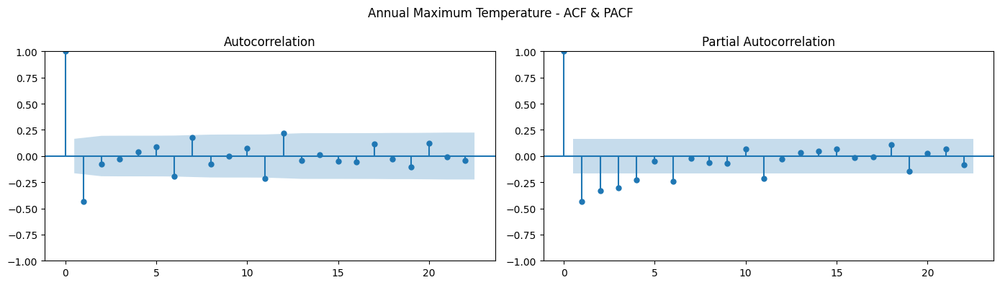

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=78.663, Time=1.37 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=149.246, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=116.237, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=72.640, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=147.557, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=77.889, Time=0.16 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=74.638, Time=0.54 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=74.639, Time=0.96 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=72.792, Time=0.36 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=76.619, Time=1.83 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=141.246, Time=0.14 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=74.395, Time=0.61 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=74.323, Time=0.71 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=115.844, Time=0.23 sec
 ARIMA(1,1,2)(0,0,1)[12] intercept   : AIC

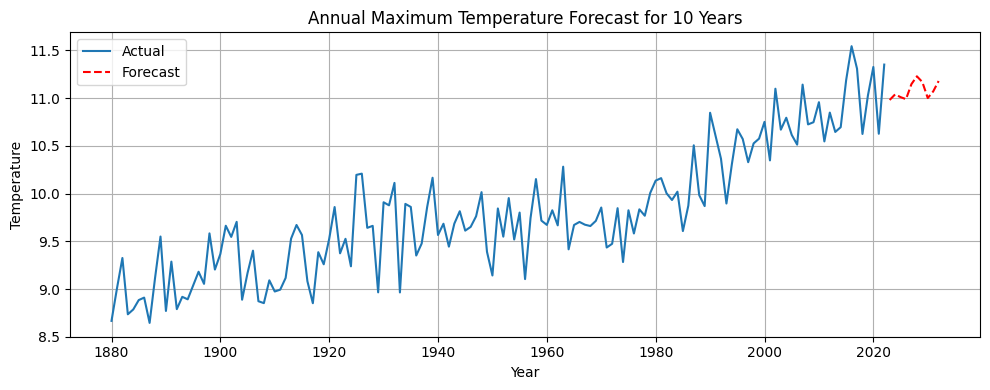


=== Annual Mean Temperature ===


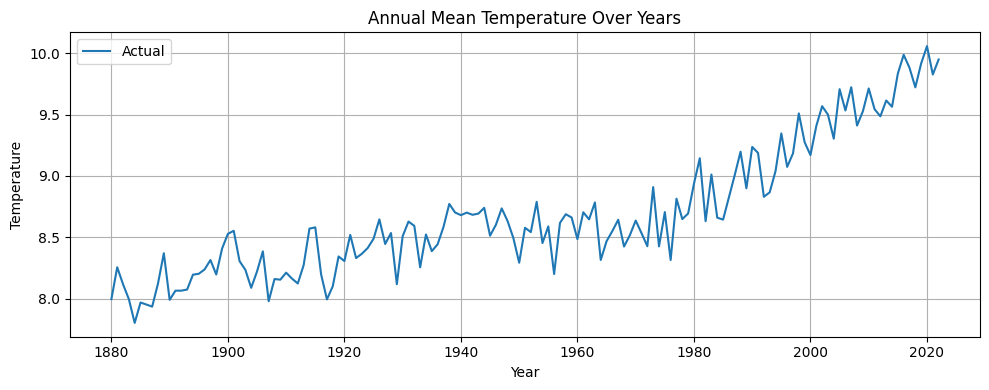


ADF Test - Annual Mean Temperature
ADF Statistic: 1.7800
p-value: 0.9983
=> Non-stationary (p > 0.05)


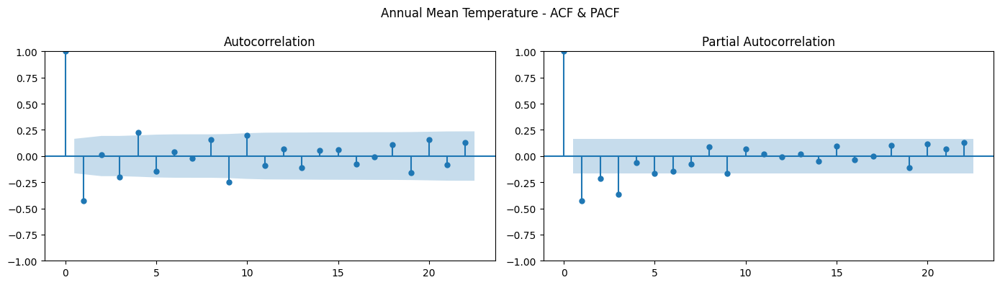

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=-79.601, Time=1.31 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-32.737, Time=0.08 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-57.464, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-82.393, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-34.143, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-84.205, Time=0.13 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=-82.385, Time=0.25 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=-80.659, Time=0.82 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=-82.957, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=-82.956, Time=0.21 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-59.463, Time=0.07 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=-82.726, Time=0.79 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=-78.140, Time=0.08 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 4.561 seconds
Selected SARIMA Order

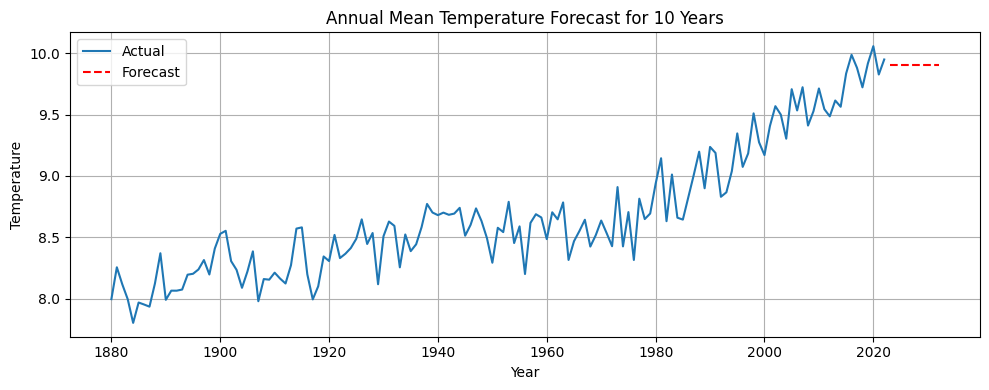

In [3]:
# using sariam model instead of arima 
# === Import Libraries ===
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from pmdarima import auto_arima
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_squared_error

# === Step 1: Prepare Data ===
# Load dataset
df = pd.read_csv(r"C:\Users\ratne\Reserch Project_Global_Temp\global temperature.csv")

# Convert to datetime and set as index
df['Date'] = pd.to_datetime(df[['Year', 'Month', 'Day']])
df.set_index('Date', inplace=True)

# Retain only needed columns
df = df[['Temperature', 'Anomaly']]

# Add 'Year' column for aggregation
df['Year'] = df.index.year

# === Step 2: Aggregate to Annual Min, Max, Mean ===
# Aggregate temperature statistics per year
annual_stats = df.groupby('Year').agg({'Temperature': ['min', 'max', 'mean']}).reset_index()
annual_stats.columns = ['Year', 'MinTemp', 'MaxTemp', 'MeanTemp']

# Display summary
print("Annual Temperature Summary:")
print(annual_stats.head())

# Create directory to save plots
output_dir = r"C:\Users\ratne\Reserch Project_Global_Temp\plots"
os.makedirs(output_dir, exist_ok=True)

# === Step 3: ADF Test for Stationarity ===
def adf_test(series, title=""):
    result = adfuller(series.dropna())
    print(f"\nADF Test - {title}")
    print(f"ADF Statistic: {result[0]:.4f}")
    print(f"p-value: {result[1]:.4f}")
    if result[1] > 0.05:
        print("=> Non-stationary (p > 0.05)")
    else:
        print("=> Stationary (p <= 0.05)")

# === Step 4: Forecasting Function ===
def model_forecast(series, title, forecast_years=10):
    print(f"\n=== {title} ===")

    # Convert index to PeriodIndex for proper forecasting
    series.index = pd.PeriodIndex(series.index, freq='Y')

    # Plot time series
    plt.figure(figsize=(10, 4))
    plt.plot(series.index.to_timestamp(), series.values, label='Actual')
    plt.title(f'{title} Over Years')
    plt.xlabel('Year')
    plt.ylabel('Temperature')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"{title.replace(' ', '_')}_timeseries.png"))
    plt.show()

    # ADF Test
    adf_test(series, title)

    # Differencing
    series_diff = series.diff().dropna()

    # ACF and PACF
    fig, axes = plt.subplots(1, 2, figsize=(14, 4))
    plot_acf(series_diff, ax=axes[0])
    plot_pacf(series_diff, ax=axes[1])
    fig.suptitle(f'{title} - ACF & PACF')
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"{title.replace(' ', '_')}_ACF_PACF.png"))
    plt.show()

    # Fit Auto ARIMA for seasonal components (SARIMA)
    auto_model = auto_arima(series, seasonal=True, m=12, trace=True,
                            error_action='ignore', suppress_warnings=True,
                            stepwise=True)
    print(f"Selected SARIMA Order: {auto_model.order}, Seasonal Order: {auto_model.seasonal_order}")

    # Fit SARIMA model
    seasonal_order = auto_model.seasonal_order  # Extract seasonal order
    model = SARIMAX(series, order=auto_model.order, seasonal_order=seasonal_order)
    model_fit = model.fit()
    print(model_fit.summary())

    # Forecast
    forecast = model_fit.forecast(steps=forecast_years)

    # Create forecast index
    forecast_index = pd.period_range(start=series.index[-1] + 1, periods=forecast_years, freq='Y')

    # Plot forecast
    plt.figure(figsize=(10, 4))
    plt.plot(series.index.to_timestamp(), series.values, label='Actual')
    plt.plot(forecast_index.to_timestamp(), forecast, label='Forecast', linestyle='--', color='red')
    plt.title(f'{title} Forecast for {forecast_years} Years')
    plt.xlabel('Year')
    plt.ylabel('Temperature')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"{title.replace(' ', '_')}_forecast.png"))
    plt.show()

    return forecast

# === Step 5: Apply Forecasting to Min, Max, and Mean Temperatures ===
min_forecast = model_forecast(annual_stats.set_index('Year')['MinTemp'], "Annual Minimum Temperature")
max_forecast = model_forecast(annual_stats.set_index('Year')['MaxTemp'], "Annual Maximum Temperature")
mean_forecast = model_forecast(annual_stats.set_index('Year')['MeanTemp'], "Annual Mean Temperature")


Annual Temperature Summary:
   Year  MinTemp  MaxTemp  MeanTemp
0  1880    6.945    8.666  7.995557
1  1881    7.213    9.006  8.255378
2  1882    6.720    9.325  8.116529
3  1883    6.852    8.735  7.995145
4  1884    7.001    8.786  7.801880

=== Annual Minimum Temperature with Trend + ARIMA Residuals ===


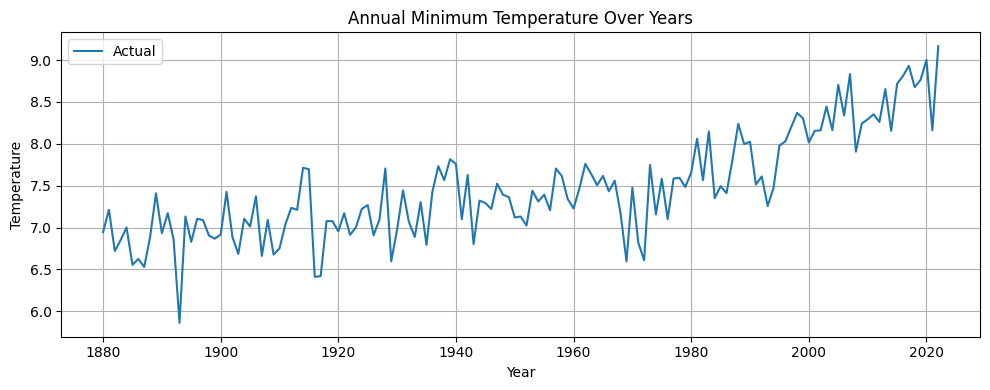


ADF Test - Annual Minimum Temperature
ADF Statistic: 0.1330
p-value: 0.9682
=> Non-stationary (p > 0.05)
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  143
Model:                 ARIMA(0, 1, 1)   Log Likelihood                 -47.243
Date:                Thu, 08 May 2025   AIC                             98.486
Time:                        14:57:19   BIC                            104.398
Sample:                             0   HQIC                           100.888
                                - 143                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.8382      0.042    -19.739      0.000      -0.921      -0.755
sigma2         0.1129    

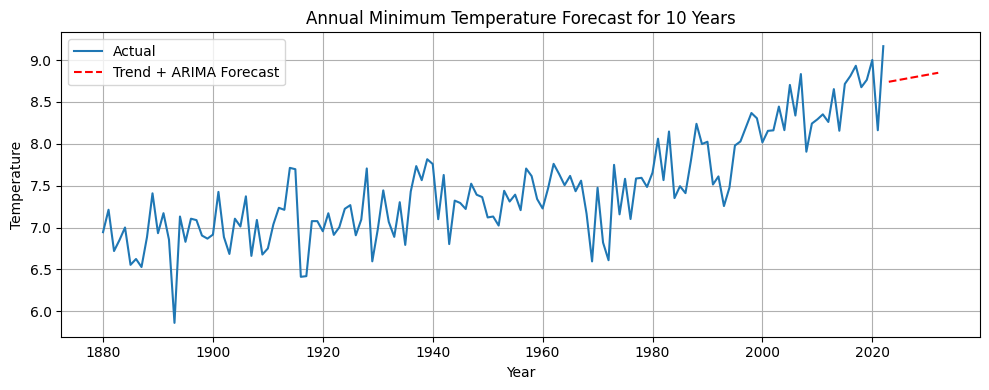


=== Annual Maximum Temperature with Trend + ARIMA Residuals ===


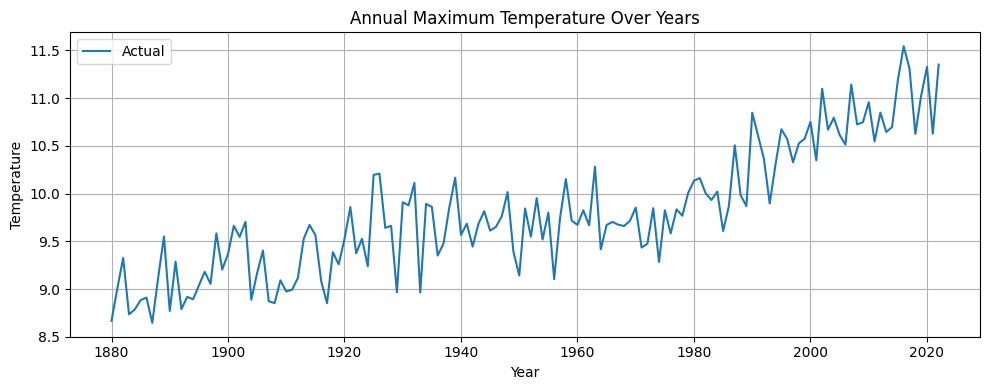


ADF Test - Annual Maximum Temperature
ADF Statistic: 0.8198
p-value: 0.9919
=> Non-stationary (p > 0.05)
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  143
Model:                 ARIMA(0, 1, 1)   Log Likelihood                 -36.055
Date:                Thu, 08 May 2025   AIC                             76.110
Time:                        14:57:21   BIC                             82.021
Sample:                             0   HQIC                            78.512
                                - 143                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.8415      0.050    -16.971      0.000      -0.939      -0.744
sigma2         0.0964    

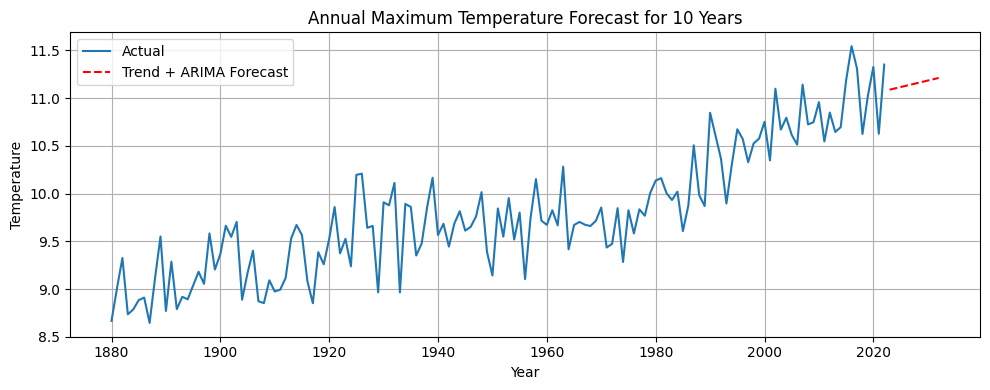


=== Annual Mean Temperature with Trend + ARIMA Residuals ===


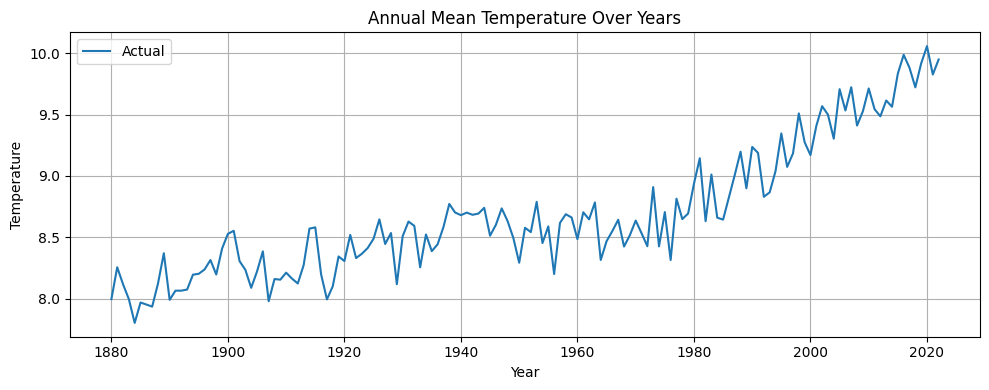


ADF Test - Annual Mean Temperature
ADF Statistic: 1.7800
p-value: 0.9983
=> Non-stationary (p > 0.05)
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  143
Model:                 ARIMA(0, 1, 1)   Log Likelihood                  44.971
Date:                Thu, 08 May 2025   AIC                            -85.942
Time:                        14:57:22   BIC                            -80.031
Sample:                             0   HQIC                           -83.540
                                - 143                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7340      0.065    -11.217      0.000      -0.862      -0.606
sigma2         0.0309      0

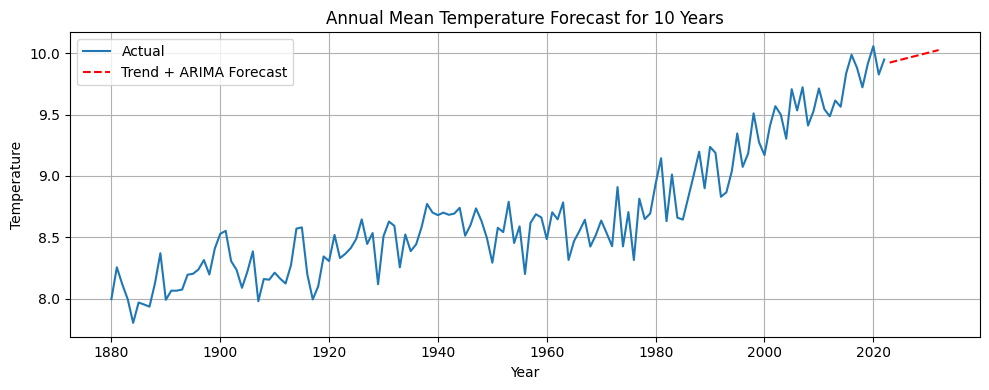

In [6]:
# Regression + ARIMA (Best Classical Approach)
#=== Import Libraries ===
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from statsmodels.tsa.stattools import adfuller
from sklearn.linear_model import LinearRegression
from statsmodels.tsa.arima.model import ARIMA

# === Step 1: Prepare Data ===
df = pd.read_csv(r"C:\Users\ratne\Reserch Project_Global_Temp\global temperature.csv")
df['Date'] = pd.to_datetime(df[['Year', 'Month', 'Day']])
df.set_index('Date', inplace=True)
df = df[['Temperature', 'Anomaly']]
df['Year'] = df.index.year

# === Step 2: Aggregate to Annual Min, Max, Mean ===
annual_stats = df.groupby('Year').agg({'Temperature': ['min', 'max', 'mean']}).reset_index()
annual_stats.columns = ['Year', 'MinTemp', 'MaxTemp', 'MeanTemp']
print("Annual Temperature Summary:")
print(annual_stats.head())

# Create output directory
output_dir = r"C:\Users\ratne\Reserch Project_Global_Temp\plots"
os.makedirs(output_dir, exist_ok=True)

# === ADF Test Function ===
def adf_test(series, title=""):
    result = adfuller(series.dropna())
    print(f"\nADF Test - {title}")
    print(f"ADF Statistic: {result[0]:.4f}")
    print(f"p-value: {result[1]:.4f}")
    if result[1] > 0.05:
        print("=> Non-stationary (p > 0.05)")
    else:
        print("=> Stationary (p <= 0.05)")

# === Forecasting Function with Trend + ARIMA Residuals ===
def trend_plus_arima_forecast(series, title, forecast_years=10):
    print(f"\n=== {title} with Trend + ARIMA Residuals ===")

    # Set PeriodIndex
    series.index = pd.PeriodIndex(series.index, freq='Y')

    # Plot actual data
    plt.figure(figsize=(10, 4))
    plt.plot(series.index.to_timestamp(), series.values, label='Actual')
    plt.title(f'{title} Over Years')
    plt.xlabel('Year')
    plt.ylabel('Temperature')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"{title.replace(' ', '_')}_timeseries.png"))
    plt.show()

    # ADF Test
    adf_test(series, title)

    # Step 1: Fit linear trend
    X = np.arange(len(series)).reshape(-1, 1)
    y = series.values
    trend_model = LinearRegression()
    trend_model.fit(X, y)
    trend_fitted = trend_model.predict(X)

    # Step 2: Residuals
    residuals = y - trend_fitted

    # Step 3: Fit ARIMA on residuals
    arima_model = ARIMA(residuals, order=(0,1,1))
    arima_fit = arima_model.fit()
    print(arima_fit.summary())

    # Step 4: Forecast residuals
    future_X = np.arange(len(series), len(series) + forecast_years).reshape(-1, 1)
    trend_forecast = trend_model.predict(future_X)
    residual_forecast = arima_fit.forecast(steps=forecast_years)

    # Combine
    total_forecast = trend_forecast + residual_forecast
    forecast_index = pd.period_range(start=series.index[-1] + 1, periods=forecast_years, freq='Y')

    # Plot forecast
    plt.figure(figsize=(10, 4))
    plt.plot(series.index.to_timestamp(), series.values, label='Actual')
    plt.plot(forecast_index.to_timestamp(), total_forecast, label='Trend + ARIMA Forecast', linestyle='--', color='red')
    plt.title(f'{title} Forecast for {forecast_years} Years')
    plt.xlabel('Year')
    plt.ylabel('Temperature')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"{title.replace(' ', '_')}_forecast.png"))
    plt.show()

    return total_forecast

# === Apply Forecasting to Min, Max, Mean Temperatures ===
min_forecast = trend_plus_arima_forecast(annual_stats.set_index('Year')['MinTemp'], "Annual Minimum Temperature")
max_forecast = trend_plus_arima_forecast(annual_stats.set_index('Year')['MaxTemp'], "Annual Maximum Temperature")
mean_forecast = trend_plus_arima_forecast(annual_stats.set_index('Year')['MeanTemp'], "Annual Mean Temperature")


Annual Temperature Summary:
   Year  MinTemp  MaxTemp  MeanTemp
0  1880    6.945    8.666  7.995557
1  1881    7.213    9.006  8.255378
2  1882    6.720    9.325  8.116529
3  1883    6.852    8.735  7.995145
4  1884    7.001    8.786  7.801880

=== Annual Minimum Temperature with Polynomial Trend (deg=2) + ARIMA Residuals ===


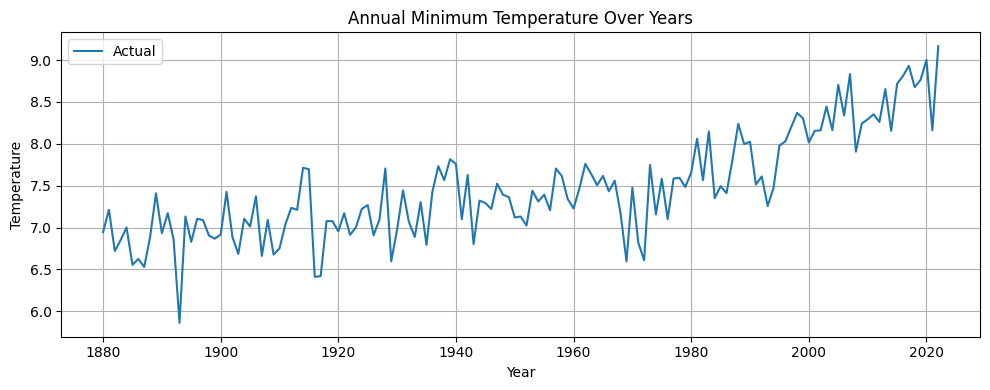


ADF Test - Annual Minimum Temperature
ADF Statistic: 0.1330
p-value: 0.9682
=> Non-stationary (p > 0.05)
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  143
Model:                 ARIMA(0, 1, 1)   Log Likelihood                 -44.665
Date:                Thu, 08 May 2025   AIC                             93.330
Time:                        15:09:45   BIC                             99.241
Sample:                             0   HQIC                            95.732
                                - 143                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.9040      0.031    -28.901      0.000      -0.965      -0.843
sigma2         0.1085    

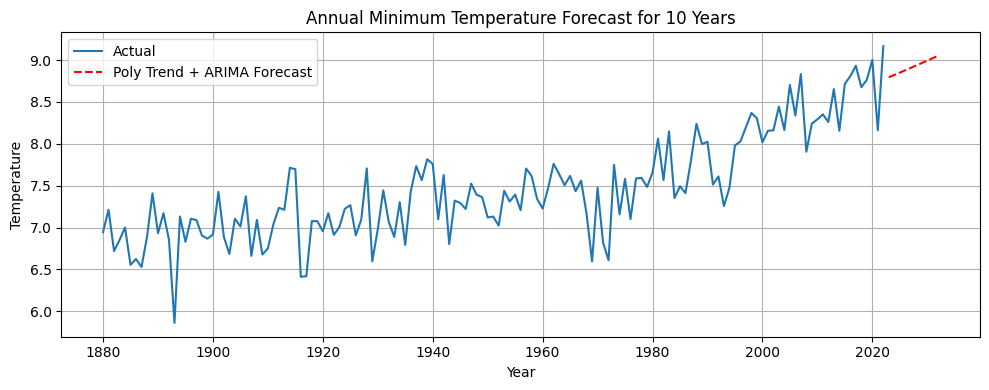


=== Annual Maximum Temperature with Polynomial Trend (deg=2) + ARIMA Residuals ===


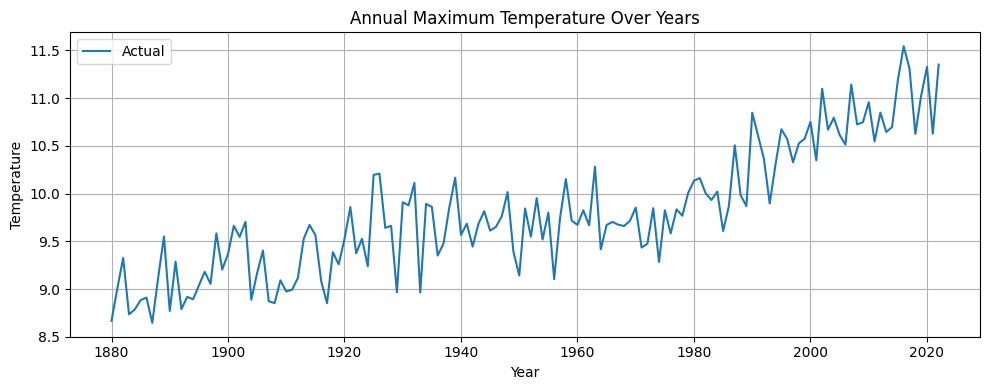


ADF Test - Annual Maximum Temperature
ADF Statistic: 0.8198
p-value: 0.9919
=> Non-stationary (p > 0.05)
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  143
Model:                 ARIMA(0, 1, 1)   Log Likelihood                 -35.289
Date:                Thu, 08 May 2025   AIC                             74.578
Time:                        15:09:47   BIC                             80.489
Sample:                             0   HQIC                            76.980
                                - 143                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.8596      0.042    -20.272      0.000      -0.943      -0.776
sigma2         0.0953    

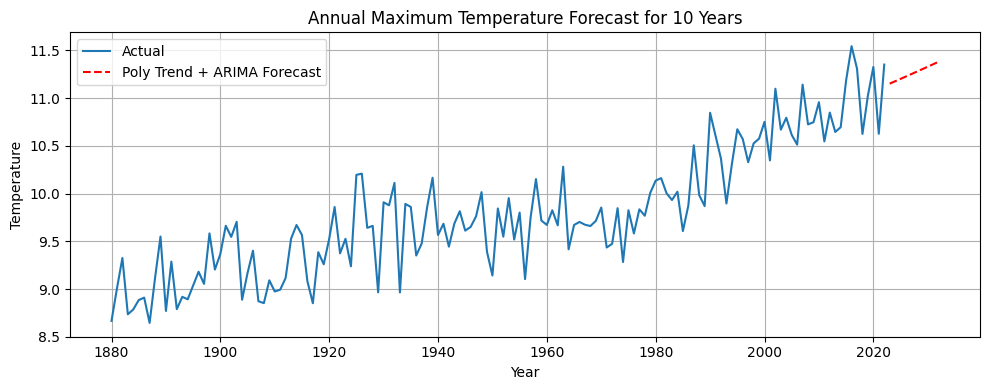


=== Annual Mean Temperature with Polynomial Trend (deg=2) + ARIMA Residuals ===


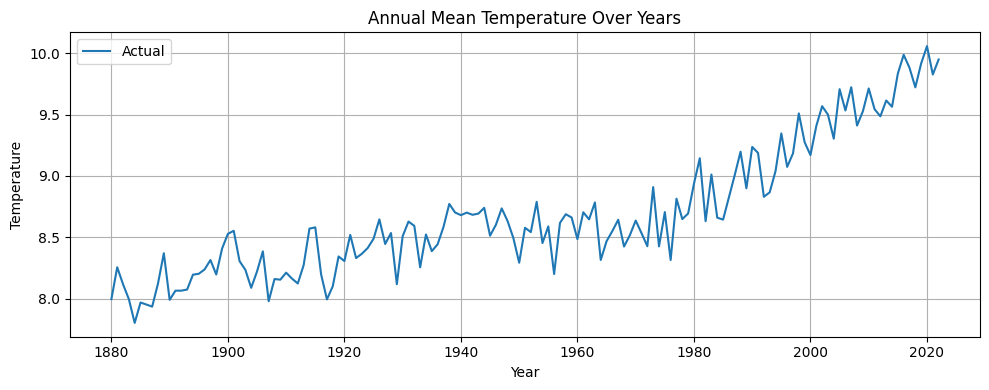


ADF Test - Annual Mean Temperature
ADF Statistic: 1.7800
p-value: 0.9983
=> Non-stationary (p > 0.05)
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  143
Model:                 ARIMA(0, 1, 1)   Log Likelihood                  46.967
Date:                Thu, 08 May 2025   AIC                            -89.933
Time:                        15:09:49   BIC                            -84.022
Sample:                             0   HQIC                           -87.531
                                - 143                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7779      0.058    -13.483      0.000      -0.891      -0.665
sigma2         0.0300      0

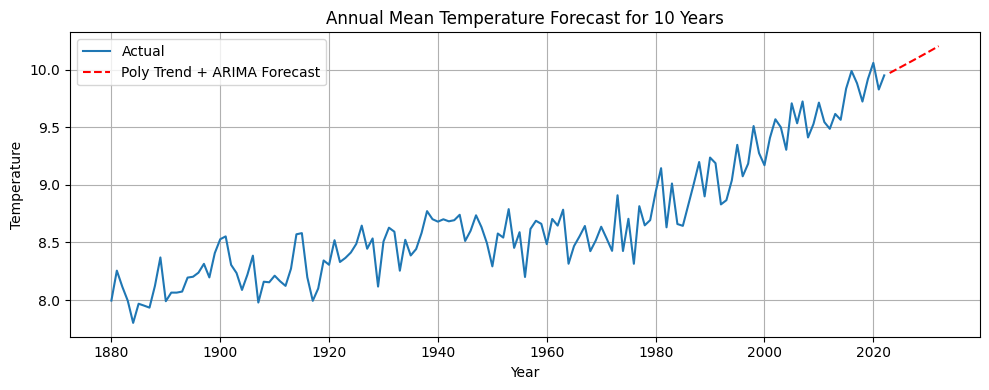

In [7]:
#Use Polynomial Regression + ARIMA (Nonlinear Trend + Residual Dynamics)
# === Regression (Polynomial) + ARIMA ===
#=== Import Libraries ===
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from statsmodels.tsa.stattools import adfuller
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from statsmodels.tsa.arima.model import ARIMA

# === Step 1: Prepare Data ===
df = pd.read_csv(r"C:\Users\ratne\Reserch Project_Global_Temp\global temperature.csv")
df['Date'] = pd.to_datetime(df[['Year', 'Month', 'Day']])
df.set_index('Date', inplace=True)
df = df[['Temperature', 'Anomaly']]
df['Year'] = df.index.year

# === Step 2: Aggregate to Annual Min, Max, Mean ===
annual_stats = df.groupby('Year').agg({'Temperature': ['min', 'max', 'mean']}).reset_index()
annual_stats.columns = ['Year', 'MinTemp', 'MaxTemp', 'MeanTemp']
print("Annual Temperature Summary:")
print(annual_stats.head())

# === Output Directory ===
output_dir = r"C:\Users\ratne\Reserch Project_Global_Temp\plots"
os.makedirs(output_dir, exist_ok=True)

# === ADF Test Function ===
def adf_test(series, title=""):
    result = adfuller(series.dropna())
    print(f"\nADF Test - {title}")
    print(f"ADF Statistic: {result[0]:.4f}")
    print(f"p-value: {result[1]:.4f}")
    if result[1] > 0.05:
        print("=> Non-stationary (p > 0.05)")
    else:
        print("=> Stationary (p <= 0.05)")

# === Forecasting Function: Polynomial Trend + ARIMA ===
def trend_plus_arima_forecast(series, title, forecast_years=10, degree=2):
    print(f"\n=== {title} with Polynomial Trend (deg={degree}) + ARIMA Residuals ===")

    # Set PeriodIndex
    series.index = pd.PeriodIndex(series.index, freq='Y')

    # Plot actual series
    plt.figure(figsize=(10, 4))
    plt.plot(series.index.to_timestamp(), series.values, label='Actual')
    plt.title(f'{title} Over Years')
    plt.xlabel('Year')
    plt.ylabel('Temperature')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"{title.replace(' ', '_')}_timeseries.png"))
    plt.show()

    # ADF Test
    adf_test(series, title)

    # Step 1: Polynomial trend
    X = np.arange(len(series)).reshape(-1, 1)
    y = series.values
    poly = PolynomialFeatures(degree=degree)
    X_poly = poly.fit_transform(X)
    trend_model = LinearRegression()
    trend_model.fit(X_poly, y)
    trend_fitted = trend_model.predict(X_poly)

    # Step 2: Residuals
    residuals = y - trend_fitted

    # Step 3: Fit ARIMA on residuals
    arima_model = ARIMA(residuals, order=(0, 1, 1))
    arima_fit = arima_model.fit()
    print(arima_fit.summary())

    # Step 4: Forecast future trend and residuals
    future_X = np.arange(len(series), len(series) + forecast_years).reshape(-1, 1)
    future_X_poly = poly.transform(future_X)
    trend_forecast = trend_model.predict(future_X_poly)
    residual_forecast = arima_fit.forecast(steps=forecast_years)

    # Step 5: Combine trend + residual forecast
    total_forecast = trend_forecast + residual_forecast
    forecast_index = pd.period_range(start=series.index[-1] + 1, periods=forecast_years, freq='Y')

    # Plot forecast
    plt.figure(figsize=(10, 4))
    plt.plot(series.index.to_timestamp(), series.values, label='Actual')
    plt.plot(forecast_index.to_timestamp(), total_forecast, label='Poly Trend + ARIMA Forecast', linestyle='--', color='red')
    plt.title(f'{title} Forecast for {forecast_years} Years')
    plt.xlabel('Year')
    plt.ylabel('Temperature')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"{title.replace(' ', '_')}_forecast.png"))
    plt.show()

    return total_forecast

# === Apply to Min, Max, Mean Temperatures ===
min_forecast = trend_plus_arima_forecast(annual_stats.set_index('Year')['MinTemp'], "Annual Minimum Temperature")
max_forecast = trend_plus_arima_forecast(annual_stats.set_index('Year')['MaxTemp'], "Annual Maximum Temperature")
mean_forecast = trend_plus_arima_forecast(annual_stats.set_index('Year')['MeanTemp'], "Annual Mean Temperature")


Annual Temperature Summary:
   Year  MinTemp  MaxTemp  MeanTemp
0  1880    6.945    8.666  7.995557
1  1881    7.213    9.006  8.255378
2  1882    6.720    9.325  8.116529
3  1883    6.852    8.735  7.995145
4  1884    7.001    8.786  7.801880

=== Annual Minimum Temperature with Degree-3 Polynomial Trend + ARIMA Residuals ===


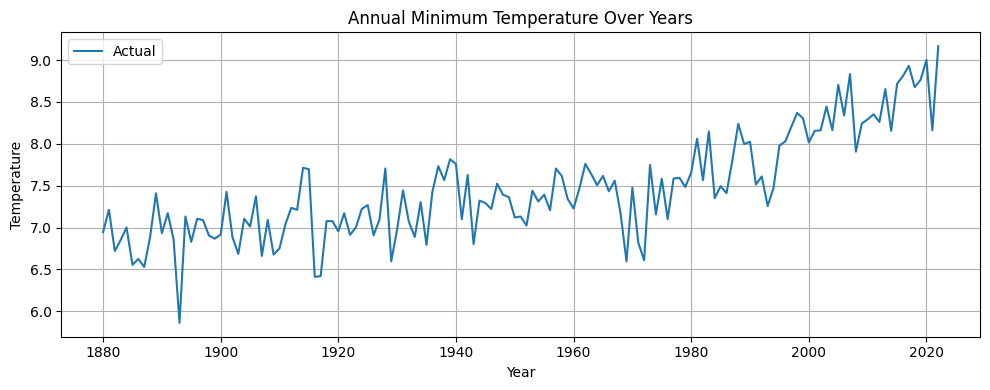


ADF Test - Annual Minimum Temperature
ADF Statistic: 0.1330
p-value: 0.9682
=> Non-stationary (p > 0.05)
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  143
Model:                 ARIMA(0, 1, 1)   Log Likelihood                 -40.876
Date:                Thu, 08 May 2025   AIC                             85.752
Time:                        16:24:27   BIC                             91.664
Sample:                             0   HQIC                            88.155
                                - 143                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.9995      1.252     -0.798      0.425      -3.453       1.454
sigma2         0.1005    

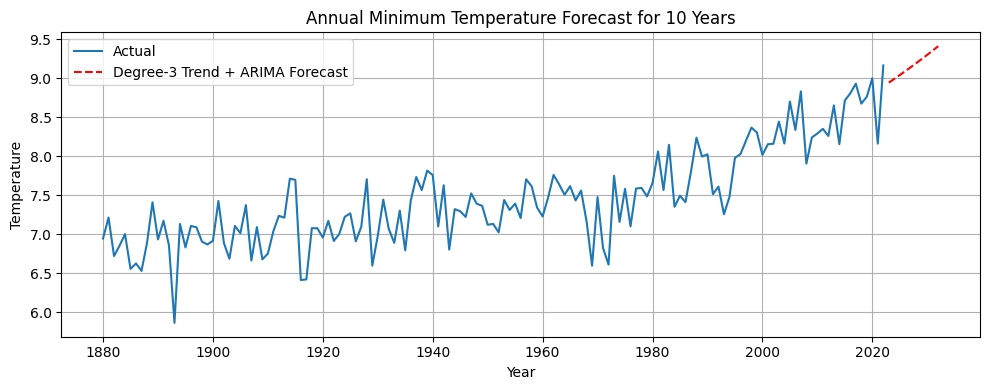


=== Annual Maximum Temperature with Degree-3 Polynomial Trend + ARIMA Residuals ===


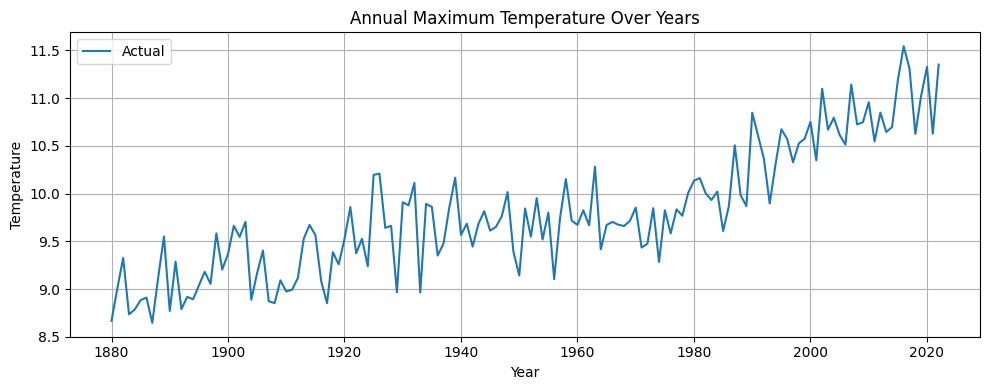


ADF Test - Annual Maximum Temperature
ADF Statistic: 0.8198
p-value: 0.9919
=> Non-stationary (p > 0.05)
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  143
Model:                 ARIMA(0, 1, 1)   Log Likelihood                 -32.775
Date:                Thu, 08 May 2025   AIC                             69.550
Time:                        16:24:29   BIC                             75.461
Sample:                             0   HQIC                            71.952
                                - 143                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.9994      0.773     -1.293      0.196      -2.514       0.515
sigma2         0.0898    

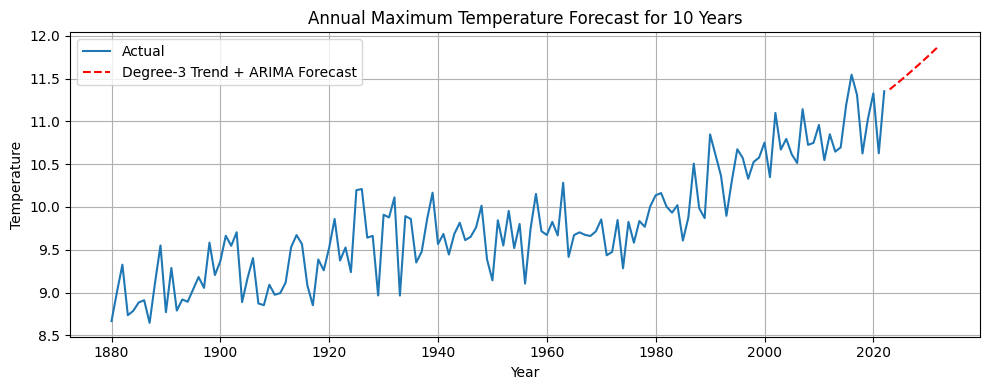


=== Annual Mean Temperature with Degree-3 Polynomial Trend + ARIMA Residuals ===


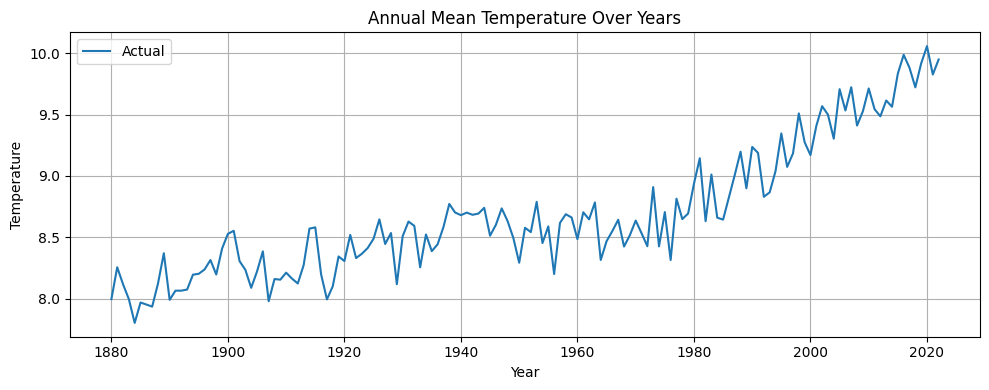


ADF Test - Annual Mean Temperature
ADF Statistic: 1.7800
p-value: 0.9983
=> Non-stationary (p > 0.05)
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  143
Model:                 ARIMA(0, 1, 1)   Log Likelihood                  48.799
Date:                Thu, 08 May 2025   AIC                            -93.598
Time:                        16:24:30   BIC                            -87.687
Sample:                             0   HQIC                           -91.196
                                - 143                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.8440      0.053    -15.848      0.000      -0.948      -0.740
sigma2         0.0292      0

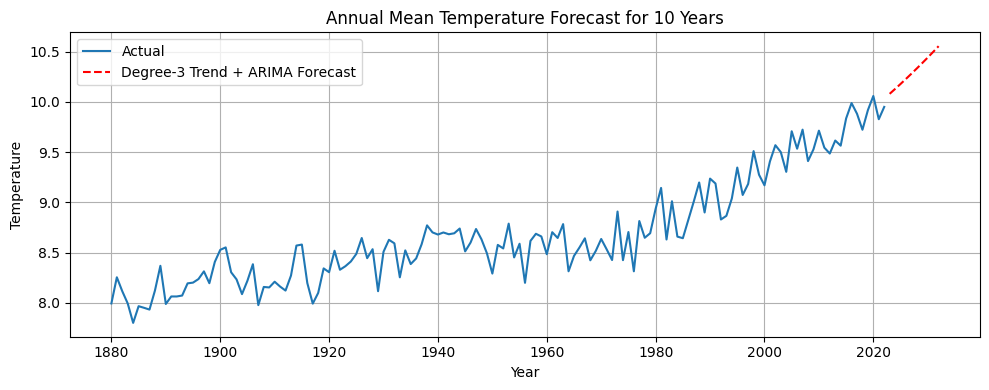


=== Forecasted Annual Temperatures for Next 10 Years ===
   Year  Forecast_MinTemp  Forecast_MaxTemp  Forecast_MeanTemp
0  2023             8.945            11.373             10.080
1  2024             8.993            11.425             10.129
2  2025             9.042            11.477             10.178
3  2026             9.093            11.531             10.229
4  2027             9.144            11.586             10.280
5  2028             9.196            11.642             10.333
6  2029             9.248            11.700             10.387
7  2030             9.302            11.758             10.441
8  2031             9.357            11.818             10.497
9  2032             9.413            11.878             10.554

=== Model Accuracy Metrics (In-Sample Fit) ===
  Temperature_Type     MAE     MSE    RMSE
0          MinTemp  0.2453  0.1034  0.3216
1          MaxTemp  0.2442  0.0923  0.3037
2         MeanTemp  0.1405  0.0293  0.1712


In [14]:
# Regression + ARIMA (Polynomial Degree 3 + Residual ARIMA)
# === Import Libraries ===
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from statsmodels.tsa.stattools import adfuller
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from statsmodels.tsa.arima.model import ARIMA

# === Step 1: Prepare Data ===
df = pd.read_csv(r"C:\Users\ratne\Reserch Project_Global_Temp\global temperature.csv")
df['Date'] = pd.to_datetime(df[['Year', 'Month', 'Day']])
df.set_index('Date', inplace=True)
df = df[['Temperature', 'Anomaly']]
df['Year'] = df.index.year

# === Step 2: Aggregate to Annual Min, Max, Mean ===
annual_stats = df.groupby('Year').agg({'Temperature': ['min', 'max', 'mean']}).reset_index()
annual_stats.columns = ['Year', 'MinTemp', 'MaxTemp', 'MeanTemp']
print("Annual Temperature Summary:")
print(annual_stats.head())

# Create output directory
output_dir = r"C:\Users\ratne\Reserch Project_Global_Temp\plots"
os.makedirs(output_dir, exist_ok=True)

# === ADF Test Function ===
def adf_test(series, title=""):
    result = adfuller(series.dropna())
    print(f"\nADF Test - {title}")
    print(f"ADF Statistic: {result[0]:.4f}")
    print(f"p-value: {result[1]:.4f}")
    if result[1] > 0.05:
        print("=> Non-stationary (p > 0.05)")
    else:
        print("=> Stationary (p <= 0.05)")

# === Forecasting Function with Polynomial Trend + ARIMA Residuals ===
def poly_trend_plus_arima_forecast(series, title, forecast_years=10, degree=3):
    print(f"\n=== {title} with Degree-{degree} Polynomial Trend + ARIMA Residuals ===")

    # Set PeriodIndex
    series.index = pd.PeriodIndex(series.index, freq='Y')

    # Plot actual data
    plt.figure(figsize=(10, 4))
    plt.plot(series.index.to_timestamp(), series.values, label='Actual')
    plt.title(f'{title} Over Years')
    plt.xlabel('Year')
    plt.ylabel('Temperature')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"{title.replace(' ', '_')}_timeseries.png"))
    plt.show()

    # ADF Test
    adf_test(series, title)

    # Step 1: Polynomial Regression (degree=3)
    X = np.arange(len(series)).reshape(-1, 1)
    y = series.values
    poly = PolynomialFeatures(degree=degree)
    X_poly = poly.fit_transform(X)

    poly_model = LinearRegression()
    poly_model.fit(X_poly, y)
    trend_fitted = poly_model.predict(X_poly)

    # Step 2: Residuals
    residuals = y - trend_fitted

    # Step 3: ARIMA on Residuals
    arima_model = ARIMA(residuals, order=(0, 1, 1))
    arima_fit = arima_model.fit()
    print(arima_fit.summary())

    # Step 4: Forecasting
    future_X = np.arange(len(series), len(series) + forecast_years).reshape(-1, 1)
    future_X_poly = poly.transform(future_X)
    trend_forecast = poly_model.predict(future_X_poly)
    residual_forecast = arima_fit.forecast(steps=forecast_years)

    total_forecast = trend_forecast + residual_forecast
    forecast_index = pd.period_range(start=series.index[-1] + 1, periods=forecast_years, freq='Y')

    # Plot forecast
    plt.figure(figsize=(10, 4))
    plt.plot(series.index.to_timestamp(), series.values, label='Actual')
    plt.plot(forecast_index.to_timestamp(), total_forecast, label=f'Degree-{degree} Trend + ARIMA Forecast', linestyle='--', color='red')
    plt.title(f'{title} Forecast for {forecast_years} Years')
    plt.xlabel('Year')
    plt.ylabel('Temperature')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"{title.replace(' ', '_')}_forecast.png"))
    plt.show()

    return total_forecast

# === Step 5: Apply Forecasting to Min, Max, Mean Temperatures ===
min_forecast = poly_trend_plus_arima_forecast(annual_stats.set_index('Year')['MinTemp'], "Annual Minimum Temperature")
max_forecast = poly_trend_plus_arima_forecast(annual_stats.set_index('Year')['MaxTemp'], "Annual Maximum Temperature")
mean_forecast = poly_trend_plus_arima_forecast(annual_stats.set_index('Year')['MeanTemp'], "Annual Mean Temperature")


# === Step 6: Combine Forecasts into One Table ===
forecast_years = 10
last_year = annual_stats['Year'].max()
future_years = np.arange(last_year + 1, last_year + forecast_years + 1)

# Create DataFrame
forecast_table = pd.DataFrame({
    'Year': future_years,
    'Forecast_MinTemp': min_forecast,
    'Forecast_MaxTemp': max_forecast,
    'Forecast_MeanTemp': mean_forecast
})

# Round for clarity
forecast_table = forecast_table.round(3)

# Display the forecast table
print("\n=== Forecasted Annual Temperatures for Next 10 Years ===")
print(forecast_table)


from sklearn.metrics import mean_absolute_error, mean_squared_error

# === Step 7: Accuracy Metrics Function ===
def calculate_accuracy(true_series, trend_model, arima_model):
    X = np.arange(len(true_series)).reshape(-1, 1)

    # Create same polynomial features used in training
    X_poly = np.hstack([X**i for i in range(1, 4)])

    # Predict trend using polynomial regression
    trend = trend_model.predict(X_poly)

    # Predict residuals using ARIMA (in-sample)
    arima_pred = arima_model.predict()

    # Combined final prediction
    combined_pred = trend + arima_pred

    # Accuracy metrics
    mae = mean_absolute_error(true_series, combined_pred)
    mse = mean_squared_error(true_series, combined_pred)
    rmse = np.sqrt(mse)

    return mae, mse, rmse


# === Step 8: Re-train models to get components for accuracy ===
annual_stats.set_index('Year', inplace=True)

def get_models(series):
    # Ensure proper index with year-based datetime
    if not isinstance(series.index, pd.DatetimeIndex):
        years = series.index
        series.index = pd.to_datetime(years.astype(str) + '-01-01')  # Safe format

    X = np.arange(len(series)).reshape(-1, 1)
    y = series.values

    # Polynomial features (degree 3)
    X_poly = np.hstack([X**i for i in range(1, 4)])
    poly_model = LinearRegression()
    poly_model.fit(X_poly, y)

    trend = poly_model.predict(X_poly)
    residuals = y - trend

       # Fit ARIMA on residuals
    arima_model = ARIMA(residuals, order=(0, 1, 1)).fit()

    return y, poly_model, arima_model


# Collect metrics
metrics = []

for label, series in zip(
    ['MinTemp', 'MaxTemp', 'MeanTemp'],
    [annual_stats['MinTemp'], annual_stats['MaxTemp'], annual_stats['MeanTemp']]
):
    y_true, trend_model, arima_model = get_models(series)
    mae, mse, rmse = calculate_accuracy(y_true, trend_model, arima_model)
    metrics.append([label, round(mae, 4), round(mse, 4), round(rmse, 4)])

# Create metrics DataFrame
metrics_df = pd.DataFrame(metrics, columns=['Temperature_Type', 'MAE', 'MSE', 'RMSE'])

# Display the table
print("\n=== Model Accuracy Metrics (In-Sample Fit) ===")
print(metrics_df)




In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error


# Convert to datetime if not already
if 'Date' in df.columns:
    df['Date'] = pd.to_datetime(df['Date'])
    df.set_index('Date', inplace=True)

# Set year column for grouping
df['Year'] = df.index.year

# Initialize parameters
group_size = 10
start_year = 1880
end_year = 2020

# Function to perform ADF test
def adf_test(series):
    result = adfuller(series.dropna())
    return result[0], result[1]

# Store results
mae_rmse_arima_results = []

# Loop over 20-year groups
for start in range(start_year, end_year, group_size):
    df_group = df[(df['Year'] >= start) & (df['Year'] < start + group_size)].copy()
    if len(df_group) < 40:  # skip very small samples
        continue

    # ADF Test
    _, pval = adf_test(df_group['Temperature'])
    if pval > 0.05:
        df_group['Temperature_Diff'] = df_group['Temperature'].diff()
        diff_data = df_group['Temperature_Diff'].dropna()
    else:
        diff_data = df_group['Temperature']

    # Fit ARIMA (5,1,2) arbitrarily; in full work, ACF/PACF should guide p,d,q
    try:
        model = ARIMA(df_group['Temperature'], order=(5,1,2))
        arima_result = model.fit()

        # Forecast last 4 days
        forecast = arima_result.forecast(steps=4)
        y_actual = df_group['Temperature'][-4:]
        y_pred = forecast[:4]

        # Compute MAE and RMSE
        mae = mean_absolute_error(y_actual, y_pred)
        rmse = np.sqrt(mean_squared_error(y_actual, y_pred))
        mae_rmse_arima_results.append([f"{start}-{start + group_size}", mae, rmse])
    except:
        continue

# Create results DataFrame
results_arima_df = pd.DataFrame(mae_rmse_arima_results, columns=["Time Period", "ARIMA_MAE", "ARIMA_RMSE"])
results_arima_df




# lstm models 


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.seasonal import seasonal_decompose

from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Define group range
group_size = 10
start_year = 1880
end_year = 2020

# ADF Test
def adf_test(series):
    result = adfuller(series.dropna())
    print(f"ADF Statistic: {result[0]}")
    print(f"p-value: {result[1]}")
    if result[1] > 0.05:
        print("Non-stationary series (p > 0.05)")
    else:
        print("Stationary series (p <= 0.05)")

# Function to create sequences for LSTM
def create_sequences(data, seq_length=10):
    X, y = [], []
    for i in range(len(data) - seq_length):
        X.append(data[i:i + seq_length])
        y.append(data[i + seq_length])
    return np.array(X), np.array(y)

# Assuming df is already loaded and contains 'Year' and 'Temperature'
mae_rmse_results = []

for start in range(start_year, end_year, group_size):
    df_group = df[(df['Year'] >= start) & (df['Year'] < start + group_size)].copy()
    print(f"\nAnalyzing period: {start}-{start + group_size}")

    # Decompose time series
    decomposition = seasonal_decompose(df_group['Temperature'], model='additive', period=365)
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(14, 8))
    decomposition.trend.plot(ax=ax1, title='Trend')
    decomposition.seasonal.plot(ax=ax2, title='Seasonality')
    decomposition.resid.plot(ax=ax3, title='Residuals')
    plt.tight_layout()
    plt.show()

    # Normalize Data
    scaler = MinMaxScaler(feature_range=(0, 1))
    df_group['Temperature_Scaled'] = scaler.fit_transform(df_group[['Temperature']])

    # Prepare Sequences for LSTM
    seq_length = 30  # Using 30 days of past data
    X, y = create_sequences(df_group['Temperature_Scaled'].values, seq_length)

    # Reshape for LSTM
    X = X.reshape((X.shape[0], X.shape[1], 1))

    # Train-Test Split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

    # Build LSTM Model
    model = Sequential([
        LSTM(50, activation='relu', return_sequences=True, input_shape=(seq_length, 1)),
        LSTM(50, activation='relu'),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')

    # Train Model
    model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=1)

    # Predictions
    y_pred_lstm = model.predict(X_test)
    y_pred_lstm = scaler.inverse_transform(y_pred_lstm)

    # Evaluate Performance
    y_test_actual = scaler.inverse_transform(y_test.reshape(-1, 1))
    mae_lstm = mean_absolute_error(y_test_actual, y_pred_lstm)
    rmse_lstm = np.sqrt(mean_squared_error(y_test_actual, y_pred_lstm))

    # Store Results
    mae_rmse_results.append([f"{start}-{start + group_size}", mae_lstm, rmse_lstm])
    print(f'LSTM MAE ({start}-{start + group_size}): {mae_lstm:.4f}, RMSE: {rmse_lstm:.4f}')

# Create DataFrame for Results
results_df = pd.DataFrame(mae_rmse_results, columns=["Time Period", "MAE", "RMSE"])
print("\nSummary of LSTM Performance:")
print(results_df)

# Plot Results
plt.figure(figsize=(12, 6))
plt.plot(results_df["Time Period"], results_df["MAE"], marker='o', label="MAE")
plt.plot(results_df["Time Period"], results_df["RMSE"], marker='s', label="RMSE")
plt.xlabel("Time Period")
plt.ylabel("Error Value")
plt.title("MAE and RMSE for Each 10-Year Group using LSTM")
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()


In [9]:
# Calculate yearly average
df_yearly = df.groupby('Year')['Temperature'].mean().reset_index()

# Calculate 5-year average
df['5YearGroup'] = (df['Year'] // 5) * 5
df_5year = df.groupby('5YearGroup')['Temperature'].mean().reset_index()


In [10]:
def train_lstm_on_series(series, label=""):
    # Normalize
    scaler = MinMaxScaler()
    series_scaled = scaler.fit_transform(series.values.reshape(-1, 1))

    # Create sequences
    seq_length = 5
    X, y = create_sequences(series_scaled, seq_length)
    X = X.reshape((X.shape[0], X.shape[1], 1))

    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

    # Model
    model = Sequential([
        LSTM(50, activation='relu', return_sequences=True, input_shape=(seq_length, 1)),
        LSTM(50, activation='relu'),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')
    model.fit(X_train, y_train, epochs=50, batch_size=8, verbose=1)

    # Predict and inverse transform
    y_pred = model.predict(X_test)
    y_pred_inv = scaler.inverse_transform(y_pred)
    y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

    # Metrics
    mae = mean_absolute_error(y_test_inv, y_pred_inv)
    rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))

    print(f"\nLSTM Performance ({label}):")
    print(f"MAE: {mae:.4f}")
    print(f"RMSE: {rmse:.4f}")

    # Plot
    plt.figure(figsize=(10, 4))
    plt.plot(y_test_inv, label='Actual')
    plt.plot(y_pred_inv, label='Predicted')
    plt.title(f"LSTM Prediction - {label}")
    plt.legend()
    plt.tight_layout()
    plt.show()

    return model


Epoch 1/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0897
Epoch 2/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0547 
Epoch 3/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0099 
Epoch 4/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0107 
Epoch 5/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0094 
Epoch 6/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0105 
Epoch 7/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0087 
Epoch 8/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0085 
Epoch 9/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0083 
Epoch 10/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0076 
Epoch 11/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0062 
Epoch 12/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0075 
Epoch 13/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0068 
Epoch 14/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0064 
Epoch 15/50
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0078 
Epoch

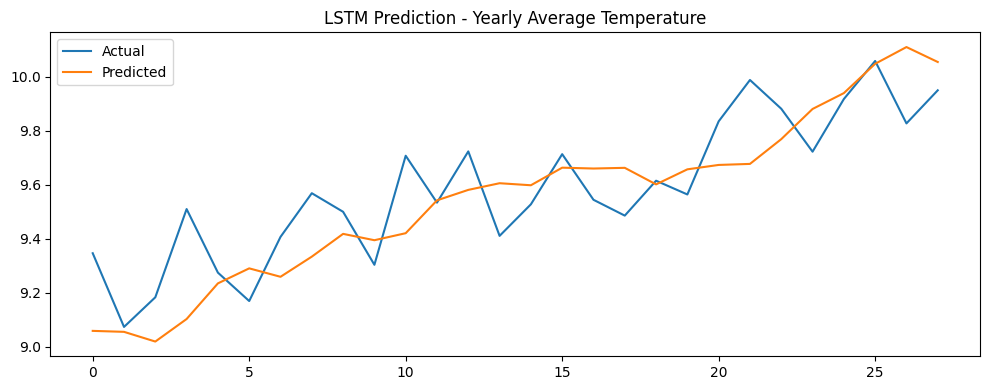

Epoch 1/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.1160
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0938 
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0880 
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0752 
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0808 
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0532 
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0568 
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0378 
Epoch 9/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0332 
Epoch 10/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0263 
Epoch 11/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0217 
Epoch 12/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0119 
Epoch 13/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0151 
Epoch 14/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0157 
Epoch 15/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0172 
Epoch 16/50
3/3 ━━━━━━━━━━━━━━━━━━━

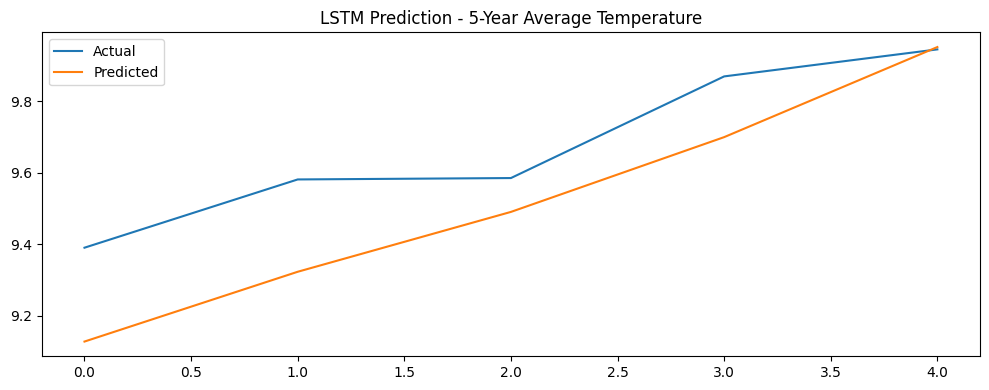

<Sequential name=sequential_15, built=True>

In [11]:
# Yearly model
train_lstm_on_series(df_yearly['Temperature'], label="Yearly Average Temperature")

# 5-Year model
train_lstm_on_series(df_5year['Temperature'], label="5-Year Average Temperature")


In [12]:
def forecast_future(model, series, years, scaler, seq_length=5):
    """Forecast future temperature values"""
    predictions = []
    input_seq = scaler.transform(series[-seq_length:].values.reshape(-1, 1)).tolist()

    for _ in range(years):
        # Prepare input for prediction
        X_input = np.array(input_seq[-seq_length:]).reshape((1, seq_length, 1))
        next_pred = model.predict(X_input, verbose=0)[0][0]
        predictions.append(next_pred)
        input_seq.append([next_pred])  # keep the sequence growing

    # Inverse scale predictions
    predictions_inv = scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
    return predictions_inv


Epoch 1/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.2090
Epoch 2/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.1328 
Epoch 3/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0302 
Epoch 4/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0153 
Epoch 5/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0102 
Epoch 6/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0076 
Epoch 7/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0076 
Epoch 8/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0072 
Epoch 9/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0077 
Epoch 10/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0070 
Epoch 11/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0077 
Epoch 12/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0076 
Epoch 13/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0068 
Epoch 14/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0072 
Epoch 15/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0064 
Epoch

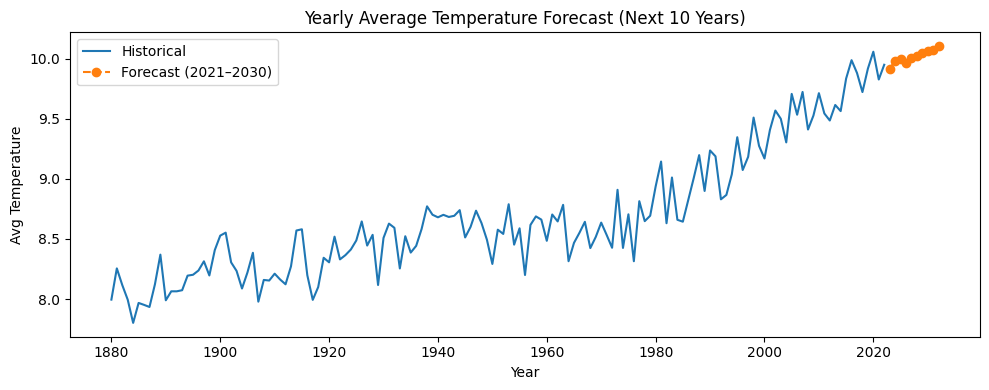


Forecasted Temperatures (2021–2030):
   Year  Predicted Temperature
0  2023               9.916318
1  2024               9.985366
2  2025               9.995470
3  2026               9.963815
4  2027              10.008984
5  2028              10.019996
6  2029              10.049272
7  2030              10.060635
8  2031              10.074349
9  2032              10.104771


In [13]:
# Train on full data for forecasting
scaler = MinMaxScaler()
series_scaled = scaler.fit_transform(df_yearly['Temperature'].values.reshape(-1, 1))

# Re-train model on entire dataset
X_full, y_full = create_sequences(series_scaled, seq_length=5)
X_full = X_full.reshape((X_full.shape[0], X_full.shape[1], 1))
model_full = Sequential([
    LSTM(50, activation='relu', return_sequences=True, input_shape=(5, 1)),
    LSTM(50, activation='relu'),
    Dense(1)
])
model_full.compile(optimizer='adam', loss='mse')
model_full.fit(X_full, y_full, epochs=50, batch_size=8, verbose=1)

# Forecast next 10 years
future_years = list(range(df_yearly['Year'].iloc[-1] + 1, df_yearly['Year'].iloc[-1] + 11))
future_predictions = forecast_future(model_full, df_yearly['Temperature'], 10, scaler)

# Plot
plt.figure(figsize=(10, 4))
plt.plot(df_yearly['Year'], df_yearly['Temperature'], label='Historical')
plt.plot(future_years, future_predictions, label='Forecast (2021–2030)', linestyle='--', marker='o')
plt.xlabel("Year")
plt.ylabel("Avg Temperature")
plt.title("Yearly Average Temperature Forecast (Next 10 Years)")
plt.legend()
plt.tight_layout()
plt.show()

# Print values
forecast_df = pd.DataFrame({'Year': future_years, 'Predicted Temperature': future_predictions})
print("\nForecasted Temperatures (2021–2030):")
print(forecast_df)


In [ ]:
# Filter data for the last decade
last_decade_df = df[(df['Year'] >= 2010) & (df['Year'] < 2020)].copy()

# Normalize temperature
scaler = MinMaxScaler(feature_range=(0, 1))
last_decade_df['Temperature_Scaled'] = scaler.fit_transform(last_decade_df[['Temperature']])

# Prepare sequences
seq_length = 30
data = last_decade_df['Temperature_Scaled'].values

# Use last 30 days for prediction
last_sequence = data[-seq_length:].reshape(1, seq_length, 1)

# Load your last trained model (or retrain here if needed)

# Forecast next 10 days recursively
future_predictions = []

current_sequence = last_sequence.copy()

for _ in range(10):
    next_pred = model.predict(current_sequence)[0, 0]
    future_predictions.append(next_pred)

    # Update the sequence with the new prediction
    current_sequence = np.append(current_sequence[:, 1:, :], [[[next_pred]]], axis=1)

# Inverse transform predictions to original scale
future_predictions_actual = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))

# Show predictions
for i, temp in enumerate(future_predictions_actual.flatten(), start=1):
    print(f"Day {i}: Predicted Temp = {temp:.3f}°C")

# Plotting
plt.figure(figsize=(10, 4))
plt.plot(range(1, 11), future_predictions_actual, marker='o', linestyle='--')
plt.title("LSTM Forecast: Next 10 Days of Temperature")
plt.xlabel("Day")
plt.ylabel("Predicted Temperature (°C)")
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

# Set group size to 35 years
group_size = 35
start_year = 1880
end_year = 2020

def adf_test(series):
    result = adfuller(series.dropna())
    print(f"ADF Statistic: {result[0]}")
    print(f"p-value: {result[1]}")
    if result[1] > 0.05:
        print("Non-stationary series (p > 0.05)")
    else:
        print("Stationary series (p <= 0.05)")

def create_sequences(data, seq_length=30):
    X, y = [], []
    for i in range(len(data) - seq_length):
        X.append(data[i:i+seq_length])
        y.append(data[i+seq_length])
    return np.array(X), np.array(y)

mae_rmse_results = []

for start in range(start_year, end_year, group_size):
    df_group = df[(df['Year'] >= start) & (df['Year'] < start + group_size)].copy()
    if df_group.empty:
        continue

    print(f"\nAnalyzing period: {start}-{start + group_size}")

    # Normalize Data
    scaler = MinMaxScaler(feature_range=(0,1))
    df_group['Temperature_Scaled'] = scaler.fit_transform(df_group[['Temperature']])
    
    # Prepare Sequences for LSTM
    seq_length = 30
    X, y = create_sequences(df_group['Temperature_Scaled'].values, seq_length)
    
    # Reshape input for LSTM
    X = X.reshape((X.shape[0], X.shape[1], 1))
    
    # Train-Test Split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)
    
    # Build LSTM Model
    model = Sequential([
        LSTM(50, activation='relu', return_sequences=True, input_shape=(seq_length, 1)),
        LSTM(50, activation='relu'),
        Dense(1)
    ])
    
    model.compile(optimizer='adam', loss='mse')
    
    # Train Model
    model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=1)
    
    # Predictions
    y_pred_lstm = model.predict(X_test)
    y_pred_lstm = scaler.inverse_transform(y_pred_lstm)
    
    # Evaluate Performance
    mae_lstm = mean_absolute_error(scaler.inverse_transform(y_test.reshape(-1,1)), y_pred_lstm)
    rmse_lstm = np.sqrt(mean_squared_error(scaler.inverse_transform(y_test.reshape(-1,1)), y_pred_lstm))
    
    mae_rmse_results.append([f"{start}-{start + group_size}", mae_lstm, rmse_lstm])
    print(f'LSTM MAE ({start}-{start + group_size}): {mae_lstm:.4f}, RMSE: {rmse_lstm:.4f}')

# Create DataFrame for results
results_df = pd.DataFrame(mae_rmse_results, columns=["Time Period", "MAE", "RMSE"])
print(results_df)

# Plot Results
plt.figure(figsize=(12, 6))
plt.plot(results_df["Time Period"], results_df["MAE"], marker='o', label="MAE")
plt.plot(results_df["Time Period"], results_df["RMSE"], marker='s', label="RMSE")
plt.xlabel("Time Period")
plt.ylabel("Error Value")
plt.title("MAE and RMSE for Each 35-Year Group")
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()


Model	MAE (Lower is better)	RMSE (Lower is better)	Pros	                                         Cons
ARIMA	0.3038,                 0.3772	              Works well for small data, interpretable	Fails for non-linear patterns
LSTM	0.1130,                 0.1429	              Captures complex relationships, good for long-term forecasting	Computationally expensive, needs large data

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

# Decompose the time series
decomposition = seasonal_decompose(df['Temperature'], model='additive', period=365)  # Assuming yearly seasonality

# Plot components
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(14,8))
decomposition.trend.plot(ax=ax1, title='Trend')
decomposition.seasonal.plot(ax=ax2, title='Seasonality')
decomposition.resid.plot(ax=ax3, title='Residuals')
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from statsmodels.tsa.seasonal import seasonal_decompose

group_size = 20
start_year = 1880
end_year = 2020

def adf_test(series):
    result = adfuller(series.dropna())
    print(f"ADF Statistic: {result[0]}")
    print(f"p-value: {result[1]}")
    if result[1] > 0.05:
        print("Non-stationary series (p > 0.05)")
    else:
        print("Stationary series (p <= 0.05)")

def create_sequences(data, seq_length=10):
    X, y = [], []
    for i in range(len(data) - seq_length):
        X.append(data[i:i+seq_length])
        y.append(data[i+seq_length])
    return np.array(X), np.array(y)

mae_rmse_results = []

for start in range(start_year, end_year, group_size):
    df_group = df[(df['Year'] >= start) & (df['Year'] < start + group_size)].copy()
    print(f"Analyzing period: {start}-{start + group_size}")
    
    # Decomposition
    decomposition = seasonal_decompose(df_group['Temperature'], model='additive', period=365)
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(14,8))
    decomposition.trend.plot(ax=ax1, title='Trend')
    decomposition.seasonal.plot(ax=ax2, title='Seasonality')
    decomposition.resid.plot(ax=ax3, title='Residuals')
    plt.tight_layout()
    plt.show()
    
    # Normalize Data
    scaler = MinMaxScaler(feature_range=(0,1))
    df_group['Temperature_Scaled'] = scaler.fit_transform(df_group[['Temperature']])
    
    # Prepare Sequences for LSTM
    seq_length = 30  # Using 30 days of past data
    X, y = create_sequences(df_group['Temperature_Scaled'].values, seq_length)
    
    # Train-Test Split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)
    
    # Build LSTM Model
    model = Sequential([
        LSTM(50, activation='relu', return_sequences=True, input_shape=(seq_length, 1)),
        LSTM(50, activation='relu'),
        Dense(1)
    ])
    
    model.compile(optimizer='adam', loss='mse')
    
    # Train Model
    model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=1)
    
    # Predictions
    y_pred_lstm = model.predict(X_test)
    y_pred_lstm = scaler.inverse_transform(y_pred_lstm)
    
    # Evaluate Performance
    mae_lstm = mean_absolute_error(scaler.inverse_transform(y_test.reshape(-1,1)), y_pred_lstm)
    rmse_lstm = np.sqrt(mean_squared_error(scaler.inverse_transform(y_test.reshape(-1,1)), y_pred_lstm))
    
    mae_rmse_results.append([f"{start}-{start + group_size}", mae_lstm, rmse_lstm])
    print(f'LSTM MAE ({start}-{start + group_size}): {mae_lstm:.4f}, RMSE: {rmse_lstm:.4f}')

# Create DataFrame for results
results_df = pd.DataFrame(mae_rmse_results, columns=["Time Period", "MAE", "RMSE"])
print(results_df)

# Plot Results
plt.figure(figsize=(12, 6))
plt.plot(results_df["Time Period"], results_df["MAE"], marker='o', label="MAE")
plt.plot(results_df["Time Period"], results_df["RMSE"], marker='s', label="RMSE")
plt.xlabel("Time Period")
plt.ylabel("Error Value")
plt.title("MAE and RMSE for Each 10-Year Group")
plt.xticks(rotation=45)
plt.legend()
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from statsmodels.tsa.seasonal import seasonal_decompose

group_size = 35
start_year = 1880
end_year = 2020

def adf_test(series):
    result = adfuller(series.dropna())
    print(f"ADF Statistic: {result[0]}")
    print(f"p-value: {result[1]}")
    if result[1] > 0.05:
        print("Non-stationary series (p > 0.05)")
    else:
        print("Stationary series (p <= 0.05)")

def create_sequences(data, seq_length=10):
    X, y = [], []
    for i in range(len(data) - seq_length):
        X.append(data[i:i+seq_length])
        y.append(data[i+seq_length])
    return np.array(X), np.array(y)

mae_rmse_results = []

for start in range(start_year, end_year, group_size):
    df_group = df[(df['Year'] >= start) & (df['Year'] < start + group_size)].copy()
    print(f"Analyzing period: {start}-{start + group_size}")
    
    # Decomposition
    decomposition = seasonal_decompose(df_group['Temperature'], model='additive', period=365)
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(14,8))
    decomposition.trend.plot(ax=ax1, title='Trend')
    decomposition.seasonal.plot(ax=ax2, title='Seasonality')
    decomposition.resid.plot(ax=ax3, title='Residuals')
    plt.tight_layout()
    plt.show()
    
    # Normalize Data
    scaler = MinMaxScaler(feature_range=(0,1))
    df_group['Temperature_Scaled'] = scaler.fit_transform(df_group[['Temperature']])
    
    # Prepare Sequences for LSTM
    seq_length = 30  # Using 30 days of past data
    X, y = create_sequences(df_group['Temperature_Scaled'].values, seq_length)
    
    # Train-Test Split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)
    
    # Build LSTM Model
    model = Sequential([
        LSTM(50, activation='relu', return_sequences=True, input_shape=(seq_length, 1)),
        LSTM(50, activation='relu'),
        Dense(1)
    ])
    
    model.compile(optimizer='adam', loss='mse')
    
    # Train Model
    model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=1)
    
    # Predictions
    y_pred_lstm = model.predict(X_test)
    y_pred_lstm = scaler.inverse_transform(y_pred_lstm)
    
    # Evaluate Performance
    mae_lstm = mean_absolute_error(scaler.inverse_transform(y_test.reshape(-1,1)), y_pred_lstm)
    rmse_lstm = np.sqrt(mean_squared_error(scaler.inverse_transform(y_test.reshape(-1,1)), y_pred_lstm))
    
    mae_rmse_results.append([f"{start}-{start + group_size}", mae_lstm, rmse_lstm])
    print(f'LSTM MAE ({start}-{start + group_size}): {mae_lstm:.4f}, RMSE: {rmse_lstm:.4f}')

# Create DataFrame for results
results_df = pd.DataFrame(mae_rmse_results, columns=["Time Period", "MAE", "RMSE"])
print(results_df)

# Plot Results
plt.figure(figsize=(12, 6))
plt.plot(results_df["Time Period"], results_df["MAE"], marker='o', label="MAE")
plt.plot(results_df["Time Period"], results_df["RMSE"], marker='s', label="RMSE")
plt.xlabel("Time Period")
plt.ylabel("Error Value")
plt.title("MAE and RMSE for Each 10-Year Group")
plt.xticks(rotation=45)
plt.legend()
plt.show()


In [ ]:
from statsmodels.graphics.tsaplots import plot_acf

# ACF Plot
plt.figure(figsize=(10,5))
plot_acf(df['Temperature'], lags=365)
plt.title("Autocorrelation Function (ACF) Plot")
plt.show()


In [ ]:
import seaborn as sns

df['Month'] = df.index.month  # Extract month
plt.figure(figsize=(12,6))
sns.boxplot(x='Month', y='Temperature', data=df)
plt.title("Monthly Temperature Variation")
plt.xlabel("Month")
plt.ylabel("Temperature")
plt.show()


# Forecasting 

In [ ]:
combined_df = results_df.copy()
combined_df['ARIMA_MAE'] = results_arima_df['MAE']
combined_df['ARIMA_RMSE'] = results_arima_df['RMSE']

plt.figure(figsize=(14, 6))
plt.plot(combined_df['Time Period'], combined_df['MAE'], label='LSTM MAE', marker='o')
plt.plot(combined_df['Time Period'], combined_df['ARIMA_MAE'], label='ARIMA MAE', marker='s')
plt.plot(combined_df['Time Period'], combined_df['RMSE'], label='LSTM RMSE', marker='o', linestyle='--')
plt.plot(combined_df['Time Period'], combined_df['ARIMA_RMSE'], label='ARIMA RMSE', marker='s', linestyle='--')
plt.xticks(rotation=45)
plt.title("Model Performance Comparison: LSTM vs. ARIMA")
plt.xlabel("Time Period")
plt.ylabel("Error")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
# Fit ARIMA on entire dataset
model_arima = ARIMA(df['Temperature'], order=(5,1,2))
result_arima = model_arima.fit()

# Forecast next 30 days
forecast_arima = result_arima.forecast(steps=30)

# Plot
plt.figure(figsize=(10, 5))
plt.plot(df['Temperature'], label='Original')
plt.plot(pd.date_range(df.index[-1], periods=30, freq='D'), forecast_arima, label='ARIMA Forecast', color='green')
plt.title("ARIMA Forecast for Next 30 Days")
plt.xlabel("Date")
plt.ylabel("Temperature")
plt.legend()
plt.show()
